# **Introduction to WGAN 🏔️**

**Wasserstein GAN** is a variant of the **Generative Adversarial Network (GAN) architecture**, which was introduced to address some of the **training instability issues** associated with **traditional GANs.** The main problem it aims to solve is **the vanishing or exploding gradient problem**, which can occur during the **training of GANs**.

In a **standard GAN**, **the generator and discriminator** are trained using a **binary cross-entropy loss function**, which measures the difference between **the predicted probability distribution** and **the true distribution**. However, this can lead to issues such as **mode collapse and difficulties in training**.

**WGAN** introduces **Wasserstein distance** (also known as **Earth Mover's distance**) as a measure of the **difference between the generated and real data distributions.** The **Wasserstein distance** provides a **more stable** and **meaningful metric** for **training GANs** compared to the **Jensen-Shannon divergence** or the **Kullback-Leibler divergence**, which are used in **traditional GANs**.

The key innovation of **WGAN** is the use of a **critic** instead of a **discriminator**. The **critic** is trained to output a score that represents **how realistic the generated samples are**. The **training process** involves **minimizing the Wasserstein distance between the distributions of real and generated data**. This approach helps to mitigate **mode collapse and stabilize the training process**.

DCGANs : [Know more](https://www.kaggle.com/code/utkarshsaxenadn/dcgan-mnist-pytorch)

## **WGAN GP**

**Wasserstein GAN** with **Gradient Penalty (WGAN-GP)** is an extension of the **Wasserstein GAN (WGAN)** that incorporates a **gradient penalty** term into the **training objective**. This modification helps **stabilize the training process and addresses some of the limitations of the original WGAN.**

In the **standard WGAN**, the **Wasserstein distance** is used as the **loss function**, and the **training involves optimizing the parameters** of a **critic network** to **minimize this distance between the distribution of real and generated data**. However, in practice, enforcing the **Lipschitz continuity constraint** on the **critic** (required for the Wasserstein distance to be well-defined) can be challenging.

**WGAN-GP** addresses this **challenge** by introducing a **gradient penalty term**, which penalizes the **norm of the gradient** of the **critic** with respect to its input. This **penalty term encourages the critic** to be **smooth and helps in maintaining** the **Lipschitz continuity** without the **need for weight clipping**, which was used in the **original WGAN** and could **lead to training instability**.

**WGAN-GP** has been shown to provide **more stable training** and **generate higher quality samples compared to the original WGAN**, making it a **popular choice** in the **field of generative models**. The **gradient penalty** helps in enforcing the **Lipschitz continuity constraint** without **resorting to potentially problematic weight clipping.**

# **Environmental Set Up ⚙️**

In this section, our priority is to establish a robust foundation for our notebook by meticulously configuring the environment. This involves the seamless loading of **essential libraries, initializing crucial constants, and setting hyperparameters to optimal values.**

By carefully orchestrating this preparatory phase, we pave the way for a **smooth and efficient execution of subsequent tasks**, allowing us to channel our focus towards the core components of our **analysis or model implementation**.

In [ ]:
# Common imports
import os
import torch
import numpy as np
from tqdm import tqdm

# Dataset
from torchvision import transforms
from torch.utils.data import DataLoader
from torchvision.datasets import MNIST

# Data Visualization
import matplotlib.pyplot as plt

# Model
from torch import nn
from torch.nn import Module, Sequential
from torch.nn import Conv2d, ConvTranspose2d
from torch.nn import BatchNorm2d, ReLU, LeakyReLU, Tanh

# Metrics
!pip install pytorch-msssim
from pytorch_msssim import ssim

In [ ]:
# ENV Constants
DEVICE = "cuda"
IMG_DIMS = 28

# Model Constants
ZDIM = 32
HDIM = 32
IMG_CHANNELS = 1

# Training Constants
LR = 2e-4
EPOCHS = 20                           # Change with respect to your hardware
beta_1 = 0.5
C_LAMBDA = 10
beta_2 = 0.999
BATCH_SIZE = 16
CRITIC_STEPS = 5
DISPLAY_STEP = 500

# Reproducibility
np.random.seed(42)
torch.manual_seed(42)

# **Generator Architecture 🎨**

The **generator** in a **Wasserstein Generative Adversarial Network (W-GAN)** follows a **standard architecture**, beginning with a **noise vector input** that undergoes **a series of convolutional transpose layers**, progressively **upsampling the data**.

**Batch normalization** and **activation functions** introduce **non-linearity**, aiding in the **generation of diverse and realistic features**. The final layer transforms the output to **match the desired data range**.

The overall architecture aims to **efficiently map random noise to a high-dimensional representation** leveraging Wasserstein loss for **improved training stability and diverse synthetic data generation.**

In [ ]:

class Generator(Module):
    """
    Generator for a Spectral Normalization Generative Adversarial Network (SN GAN).

    Parameters:
    - zdims (int): Dimensionality of the input noise vector.
    - hdims (int): Dimensionality of the hidden layers in the generator.
    - img_channels (int): Number of channels in the output synthesized images.

    Attributes:
    - zdims (int): Dimensionality of the input noise vector.
    - generator (Sequential): Sequential model representing the generator architecture.
    """

    def __init__(self, zdims: int = ZDIM, hdims: int = HDIM, img_channels: int = IMG_CHANNELS):
        """
        Initializes the Generator.

        Args:
        - zdims (int): Dimensionality of the input noise vector.
        - hdims (int): Dimensionality of the hidden layers in the generator.
        - img_channels (int): Number of channels in the output synthesized images.
        """

        super(Generator, self).__init__()

        self.zdims = zdims
        self.generator = Sequential(
            self.generator_block(ZDIM, HDIM),
            self.generator_block(HDIM, HDIM * 2, kernel_size=4, stride=1),
            self.generator_block(HDIM * 2, HDIM * 4),
            self.generator_block(HDIM * 4, img_channels, kernel_size=4, output_layer=True),
        )

    def generator_block(self, input_dims: int, output_dims: int, kernel_size: int = 3, stride: int = 2, output_layer: bool = False):
        """
        Defines a generator block.

        Args:
        - input_dims (int): Dimensionality of the input to the block.
        - output_dims (int): Dimensionality of the output from the block.
        - kernel_size (int): Size of the convolutional kernel.
        - stride (int): Stride of the convolutional operation.
        - output_layer (bool): Indicates whether this block is the output layer.

        Returns:
        - Sequential: Generator block as a Sequential model.
        """

        if output_layer:
            return Sequential(
                ConvTranspose2d(input_dims, output_dims, kernel_size, stride),
                Tanh()
            )
        else:
            return Sequential(
                ConvTranspose2d(input_dims, output_dims, kernel_size, stride),
                BatchNorm2d(output_dims),
                ReLU(inplace=True)
            )

    def forward(self, noise):
        """
        Forward pass of the generator.

        Args:
        - noise (Tensor): Input noise tensor.

        Returns:
        - Tensor: Synthesized images.
        """

        noise = noise.view(len(noise), self.zdims, 1, 1)
        synthesized_images = self.generator(noise)

        return synthesized_images


In the realm of **Generative Adversarial Networks (GANs)**, the fundamental essence lies in the **ability of generators** to transmute a **noise vector** into an **image vector**. To embark on this journey of creative synthesis, our first step entails the **creation of the noise vector** itself.

In [ ]:
def generate_noise(n_samples: int, z_dims: int = ZDIM, device: str = DEVICE) -> torch.Tensor:
    """
    Generate a random noise vector for GAN input.

    Args:
    - n_samples (int): Number of noise vectors to generate.
    - z_dims (int): Dimensionality of the noise vector.
    - device (str): Device to place the generated noise tensor (default is DEVICE).

    Returns:
    - torch.Tensor: Random noise vector of shape (n_samples, z_dims).
    """
    return torch.randn(n_samples, z_dims, device=device)

In [ ]:
noise = generate_noise(28, z_dims=28, device="cpu")
noise.shape

torch.Size([28, 28])

Let's craft a handy function to visualize noise vectors. This versatile tool isn't limited to noise—it seamlessly adapts to any image input or generated content.

As we traverse the GAN landscape, this function becomes our visual guide, shedding light on the training process, showcasing the generator's evolving creations, and ultimately aiding in the comprehensive evaluation of the model's generated output.

In [ ]:
def show_generations(generations, n_rows=1, n_cols=1, figsize=(8, 5), title=None, save_loc=None):
    """
    Display a grid of synthetic images generated by the generator.

    Args:
        generations (torch.Tensor): A tensor containing synthetic image data.
        n_rows (int): Number of rows in the grid.
        n_cols (int): Number of columns in the grid.
        figsize (tuple): Size of the figure (default is (8, 5)).
        title (str): Title for the figure (default is None).
        save_loc (str): File path to save the figure (default is None).

    """
    synthetic_images = generations.view(-1, IMG_DIMS, IMG_DIMS, IMG_CHANNELS).detach().cpu()

    plt.figure(figsize=figsize)
    plt.suptitle("Synthetic Images" if title is None else title)

    for index in range(n_rows * n_cols):
        plt.subplot(n_rows, n_cols, index+1)
        plt.imshow(synthetic_images[index], cmap='gray')
        plt.axis('off')

    if save_loc is not None:
        if not os.path.exists(os.path.dirname(save_loc)):
            os.makedirs(os.path.dirname(save_loc))
        plt.savefig(save_loc)

    plt.show()


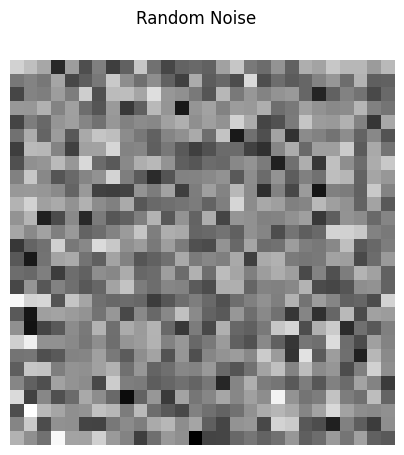

In [ ]:
show_generations(noise, figsize=(5,5), title="Random Noise")

This is what a **random noise vector** looks like. It will be the **generators task** to convert this **noise vector** into an **actual image**. Keep one thing in mind, the **noise vector** will not exactly be **28 x 28 pixels**. It will be **1 x 28 pixels** for a **single image**. So really, **generating** an image from just a **noise vector** is **extremely tough task**.

---

Let's have a look at **generations**. When the generator is untrained.

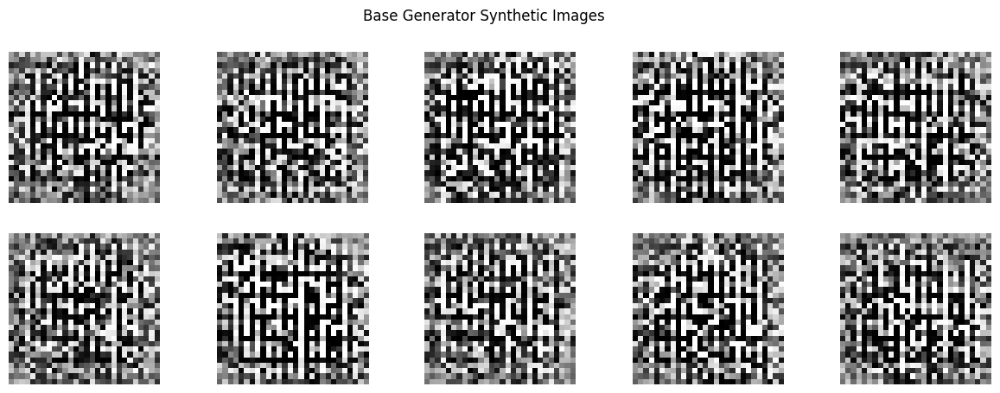

In [ ]:
noise = generate_noise(10, device='cpu')
synthetic_images = Generator()(noise)

show_generations(
    synthetic_images, 2, 5,
    figsize=(15, 5),
    title="Base Generator Synthetic Images",
    save_loc = "./GeneratorImages/base_generations.png"
)


At this is stage when the **generator is not trained**, the **generations looks like some random noises**.

# **Critic Architecture 🔍**

The **Critic architecture** in a **Generative Adversarial Network** (GAN) serves as the **adversary to the generator**, **playing a critical role in distinguishing between real and generated data**. Typically implemented as a **convolutional neural network (CNN),** the **Critic** takes input in the form of **data samples** and aims to **assign an score to the image describing how realistic the image is.**

In [ ]:
class Critic(Module):
    def __init__(self, hdims:int =HDIM, img_channels:int=IMG_CHANNELS):
        """
        Initialize the Critic network.

        Args:
        - img_channels (int): Number of input channels (e.g., 1 for grayscale, 3 for RGB).
        - hdims (int): Number of channels in the first hidden layer.
        """
        super(Critic, self).__init__()

        self.critic = Sequential(
            self.critic_block(img_channels, hdims),
            self.critic_block(hdims, hdims * 2),
            self.critic_block(hdims * 2, 1, output_layer=True),
        )

    def critic_block(self, input_dims, output_dims, kernel_size=4, stride=2, output_layer=False):
        """
        Create a Critic block.

        Args:
        - input_dims (int): Number of input channels.
        - output_dims (int): Number of output channels.
        - kernel_size (int): Size of the convolutional kernel.
        - stride (int): Stride for the convolution operation.
        - output_layer (bool, optional): If True, only spectral normalization is applied, else batch normalization and LeakyReLU are added.

        Returns:
        - Sequential: A Critic block.
        """
        if output_layer:
            return Sequential(
                Conv2d(input_dims, output_dims, kernel_size, stride)
            )
        else:
            return Sequential(
                Conv2d(input_dims, output_dims, kernel_size, stride),
                BatchNorm2d(output_dims),
                LeakyReLU(0.2, inplace=True)
            )

    def forward(self, image):
        """
        Forward pass of the Critic network.

        Args:
        - image (torch.Tensor): The input image.

        Returns:
        - torch.Tensor: The Critic's prediction.
        """
        critic_pred = self.critic(image)
        return critic_pred.view(len(critic_pred), -1)


# **WGAN Architecture ⚒️**

The building blocks of are GAN are ready. Now it's time to combine these building blocks to make up the final architecture.

In [ ]:
# Initialize the generator
generator = Generator().to(DEVICE)

# Initialize generator optimizer
generator_optim = torch.optim.Adam(params = generator.parameters(), lr = LR, betas = (beta_1, beta_2))

# Initialize the critic
critic = Critic().to(DEVICE)

# Initialize critic optimizer
critic_optim = torch.optim.Adam(params = critic.parameters(), lr = LR, betas = (beta_1, beta_2))

In [ ]:
# Normalize the weights of generator and critic
def weights_init(m):
    if isinstance(m, nn.Conv2d) or isinstance(m, nn.ConvTranspose2d):
        torch.nn.init.normal_(m.weight, 0.0, 0.02)
    if isinstance(m, nn.BatchNorm2d):
        torch.nn.init.normal_(m.weight, 0.0, 0.02)
        torch.nn.init.constant_(m.bias, 0)

generator = generator.apply(weights_init)
critic = critic.apply(weights_init)

Finally, everything is on in the right place. Other than a single thing the data set. It's time to load the data set.

In [ ]:
transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize((0.5,), (0.5,)),
])

dataloader = DataLoader(
    MNIST(".", download=True, transform=transform),
    batch_size=BATCH_SIZE,
    shuffle=True)

100%|██████████| 9912422/9912422 [00:00<00:00, 143285961.30it/s]

Extracting ./MNIST/raw/train-images-idx3-ubyte.gz to ./MNIST/raw


100%|██████████| 28881/28881 [00:00<00:00, 117039317.70it/s]


Extracting ./MNIST/raw/train-labels-idx1-ubyte.gz to ./MNIST/raw






100%|██████████| 1648877/1648877 [00:00<00:00, 32051699.69it/s]

Extracting ./MNIST/raw/t10k-images-idx3-ubyte.gz to ./MNIST/raw


100%|██████████| 4542/4542 [00:00<00:00, 4838843.98it/s]


Extracting ./MNIST/raw/t10k-labels-idx1-ubyte.gz to ./MNIST/raw




# **Gradient Penalty 💵**

To calculate the **gradient penalty** in the context of **Wasserstein GAN** with **Gradient Penalty** (WGAN-GP), the process involves creating a **mixed image** by combining **real and fake images**, obtaining the **critic's output on this mixed image**, and **subsequently computing the gradient of the critic's output with respect to the pixels of the mixed image**.

This **gradient** is then **used to calculate a penalty term** by measuring the **squared norm of the gradient minus 1**, scaled by a hyperparameter known as **lambda**. The purpose of this **gradient penalty** is to **enforce Lipschitz continuity in the critic**, ensuring a **smoother learning process** and **mitigating training instability issues**.

The **resulting penalty term** is **incorporated into the WGAN-GP loss** function to improve the **stability and effectiveness** of the **generative adversarial network during training**.

In [ ]:
def extract_gradients(critic: Module, real: torch.Tensor, fake: torch.Tensor, epsilon: torch.Tensor) -> torch.Tensor:
    """
    Extracts the gradients of the critic's output with respect to the pixels of mixed images.

    Parameters:
        critic (torch.nn.Module): The critic model.
        real (torch.Tensor): Real images.
        fake (torch.Tensor): Fake images.
        epsilon (float): Weighting factor for combining real and fake images in creating mixed images.

    Returns:
        torch.Tensor: Gradients of the critic's output with respect to the pixels of the mixed images.
    """
    # Create mixed images
    mixed_images = real * epsilon + fake * (1 - epsilon)

    # Get critic's scores on the mixed images
    mixed_scores = critic(mixed_images)

    # Compute gradients
    gradients = torch.autograd.grad(
        inputs=mixed_images,
        outputs=mixed_scores,
        grad_outputs=torch.ones_like(mixed_scores),
        create_graph=True,
        retain_graph=True
    )[0]

    return gradients


Now we need another function, which will take these gradients and compute the penalty out of them.

In [ ]:
def gradient_penalty(gradients: torch.Tensor) -> torch.Tensor:
    """
    Computes the gradient penalty based on the norm of the gradients.

    Parameters:
        gradients (torch.Tensor): Gradients of the critic's output with respect to the pixels.

    Returns:
        torch.Tensor: Computed gradient penalty.
    """
    # Reshape gradients for computation
    gradients = gradients.view(len(gradients), -1)

    # Calculate the L2 norm of gradients
    gradient_norm = gradients.norm(2, dim=1)

    # Compute the penalty term
    penalty = torch.mean((gradient_norm - 1) ** 2)

    return penalty

# **Loss Terms ✖️**

The **generator loss** and **critic loss** used in **Wasserstein GANs with Gradient Penalty (WGAN-GP)** are designed to address **specific challenges** associated with training **generative adversarial networks (GANs).** Let's explore the intuition behind each:

1. **Generator Loss:**
   - **Objective:** The generator loss aims to encourage the generator to produce samples that are indistinguishable from real samples according to the critic.
   - **Intuition:** By minimizing the negative mean of the critic's output for generated samples, the generator is incentivized to produce samples that the critic cannot easily distinguish from real ones. This aligns with the Wasserstein GAN's goal of achieving a meaningful Wasserstein distance between the real and generated data distributions. Unlike traditional GANs, WGANs provide a more stable training signal for the generator.

2. **Critic Loss:**
   - **Objective:** The critic loss has two main components: encouraging the critic to score fake samples lower than real samples and incorporating a gradient penalty to ensure Lipschitz continuity.
   - **Intuition:**
      - The first term, (torch.mean(crit_fake_pred) - torch.mean(crit_real_pred)), ensures that the critic distinguishes between real and fake samples. The generator minimizes this term by producing realistic samples, while the critic maximizes it to improve discrimination.

      - The second term, (c_lambda x gp), introduces a gradient penalty (gp) to enforce Lipschitz continuity, which helps stabilize training. The penalty is proportional to the deviation of the gradient norms from 1. By adding this term, the WGAN-GP encourages the critic to have a Lipschitz constant of 1, reducing the risk of mode collapse and improving the convergence of the training process.

In summary, the generator loss pushes the generator to produce realistic samples, while the critic loss guides the critic to effectively distinguish between real and generated samples and maintain Lipschitz continuity through a gradient penalty. This combination helps address issues such as mode collapse and training instability, leading to more stable and reliable training of GANs.

In [ ]:
# Updated generator Loss
def compute_generator_loss(critic_fake_pred):
    """
    Calculates the generator loss for a Wasserstein GAN.

    Parameters:
        critic_fake_pred (torch.Tensor): Critic's output for fake/generated samples.

    Returns:
        torch.Tensor: Generator loss.
    """
    return -1. * torch.mean(critic_fake_pred)

# Updated Critic Loss
def compute_critic_loss(crit_fake_pred, crit_real_pred, gp, c_lambda):
    """
    Calculates the critic loss for a Wasserstein GAN with Gradient Penalty.

    Parameters:
        crit_fake_pred (torch.Tensor): Critic's output for fake/generated samples.
        crit_real_pred (torch.Tensor): Critic's output for real samples.
        gp (torch.Tensor): Gradient penalty.
        c_lambda (float): Hyperparameter controlling the strength of the gradient penalty.

    Returns:
        torch.Tensor: Critic loss.
    """
    return torch.mean(crit_fake_pred) - torch.mean(crit_real_pred) + c_lambda * gp

**Generator Loss Intuition:**
 * When the generator creates fake images, the critic easily identifies them as fake by assigning extremely negative values. This leads to a generator loss that is the negative of these values, essentially increasing the loss for the generator. In response, the generator adjusts its parameters to decrease this loss, compelling it to produce more convincing and realistic images.

**Critic Loss Intuition:**
 * For the critic, when faced with both real and fake images, it generates predictions. If these predictions for fake images are inaccurate, assigning positive values, and predictions for real images are negative, it results in a higher overall loss. This motivates the critic to improve its classification ability by minimizing the loss, aligning with the goal of accurately distinguishing between real and fake samples. Additionally, the inclusion of a gradient penalty enhances stability in training, ensuring smoother convergence.

# **Training WGAN 💭**

Now we have all the **components** that are **essential** for **creating and training the Wasserstein GAN with gradient penalty**. Now it's time to actually create the **training process**.

  0%|          | 0/3750 [00:00<?, ?it/s]

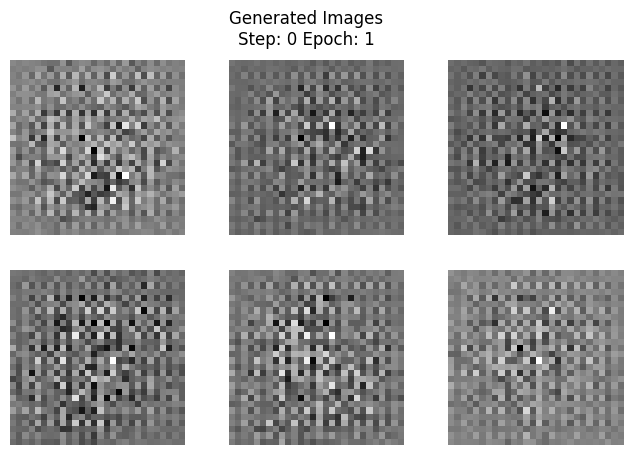

 13%|█▎        | 500/3750 [00:30<04:23, 12.32it/s]

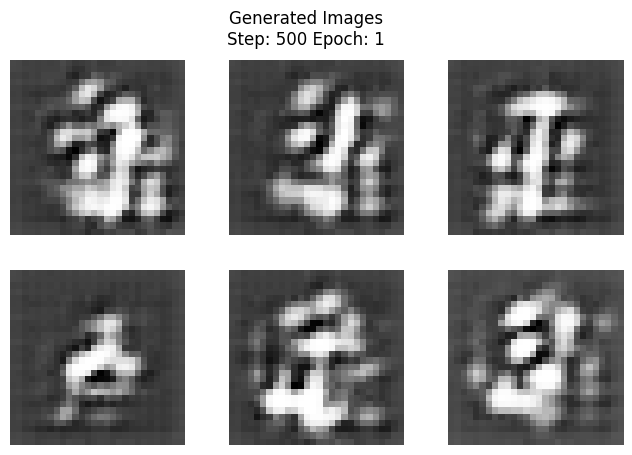

 27%|██▋       | 999/3750 [00:57<01:57, 23.46it/s]

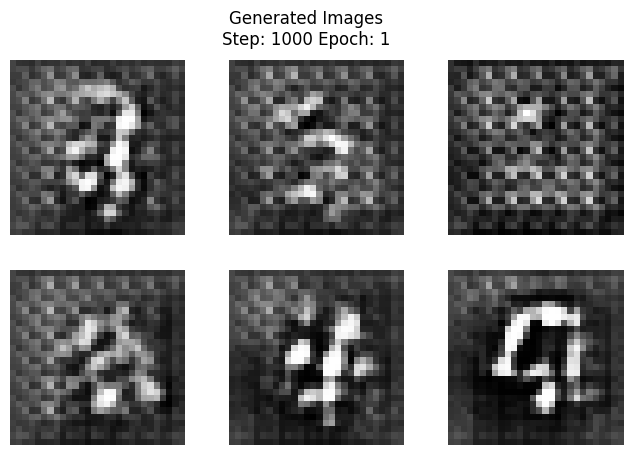

 40%|████      | 1500/3750 [01:21<01:38, 22.84it/s]

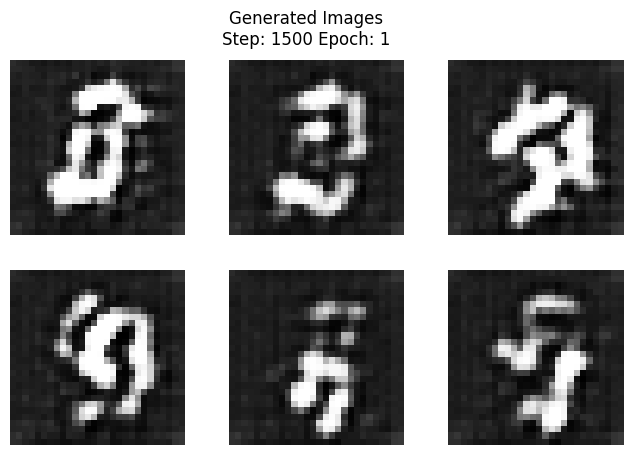

 53%|█████▎    | 2000/3750 [01:45<01:40, 17.37it/s]

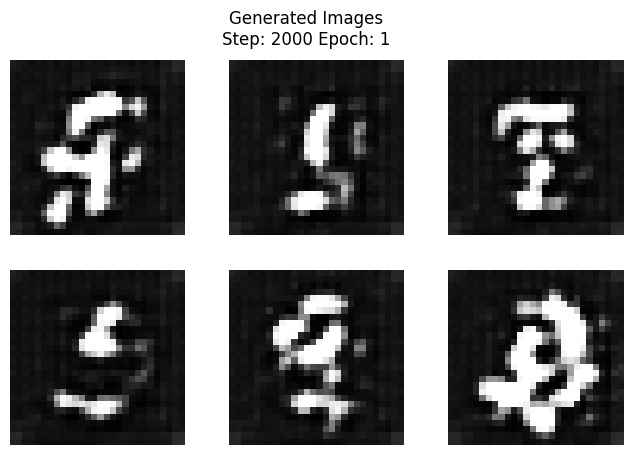

 67%|██████▋   | 2500/3750 [02:10<00:54, 22.77it/s]

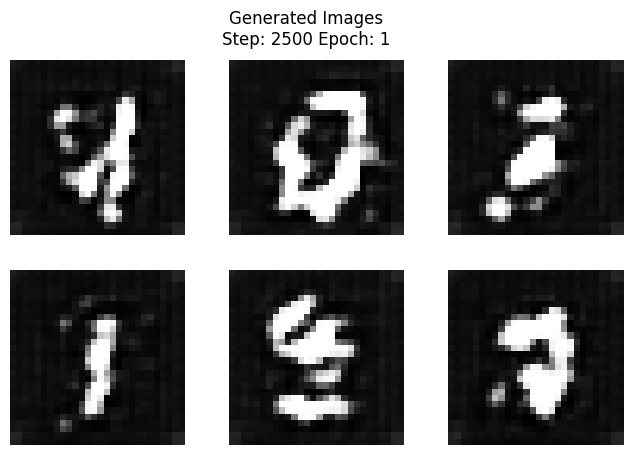

 80%|███████▉  | 2999/3750 [02:34<00:35, 20.97it/s]

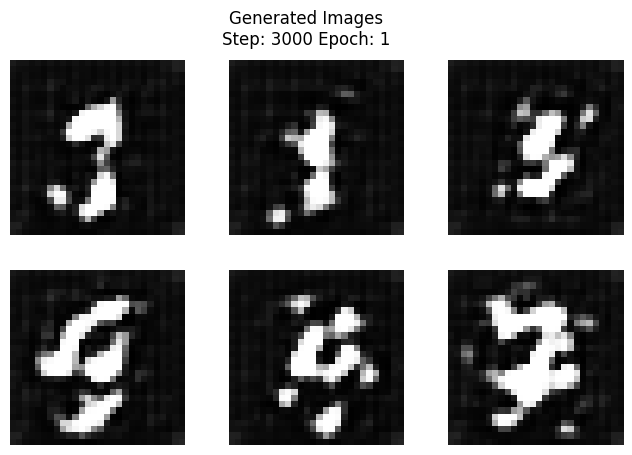

 93%|█████████▎| 3500/3750 [02:58<00:10, 22.97it/s]

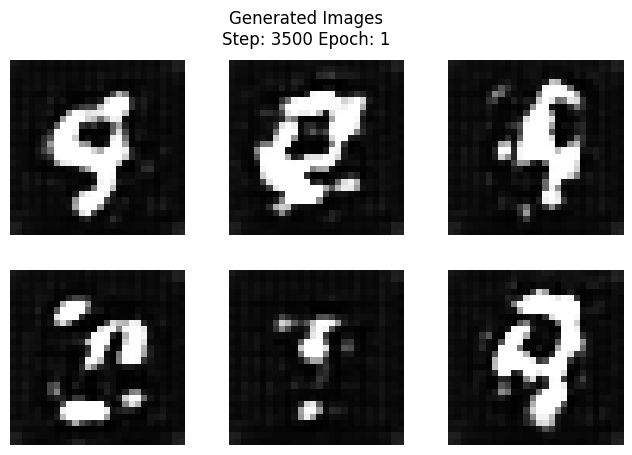

100%|██████████| 3750/3750 [03:11<00:00, 19.62it/s]


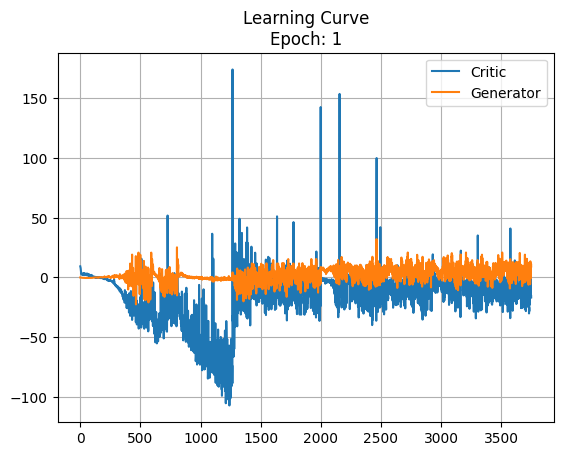

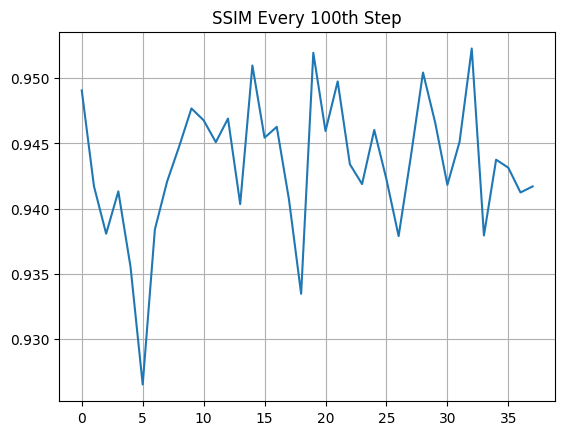

  0%|          | 0/3750 [00:00<?, ?it/s]

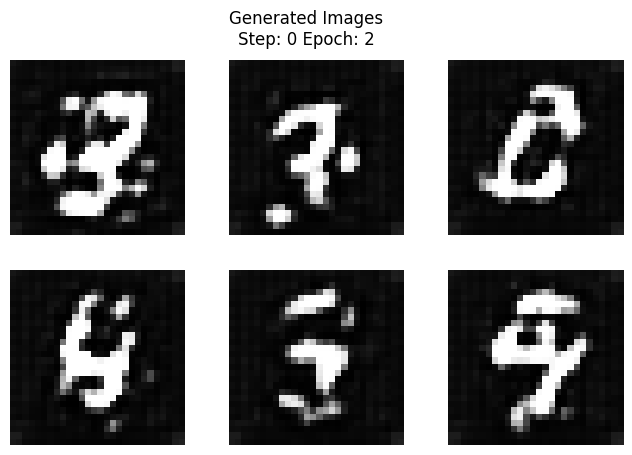

 13%|█▎        | 499/3750 [00:24<03:14, 16.75it/s]

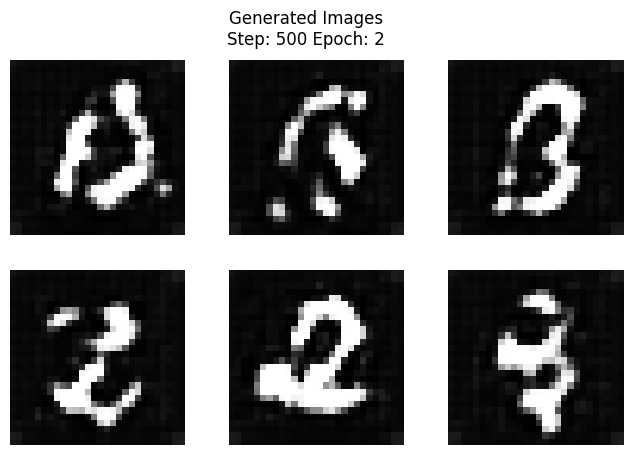

 27%|██▋       | 998/3750 [00:48<02:00, 22.93it/s]

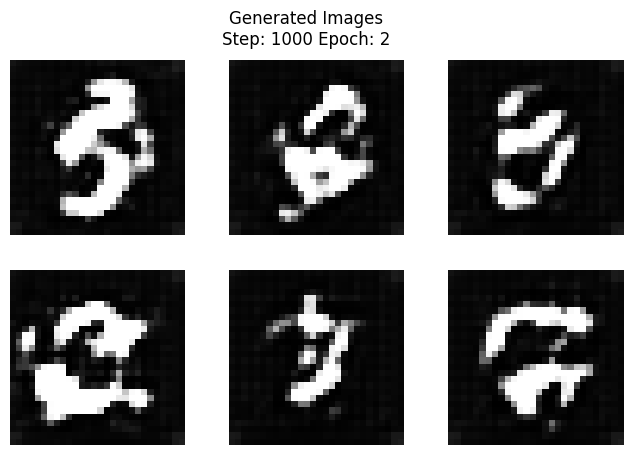

 40%|███▉      | 1499/3750 [01:12<01:37, 22.99it/s]

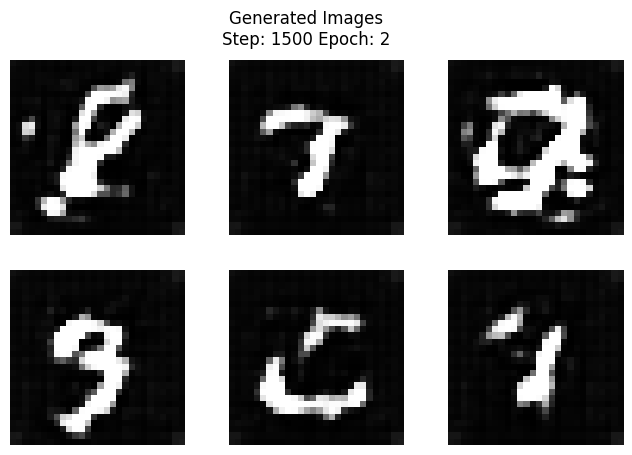

 53%|█████▎    | 2000/3750 [01:37<01:17, 22.48it/s]

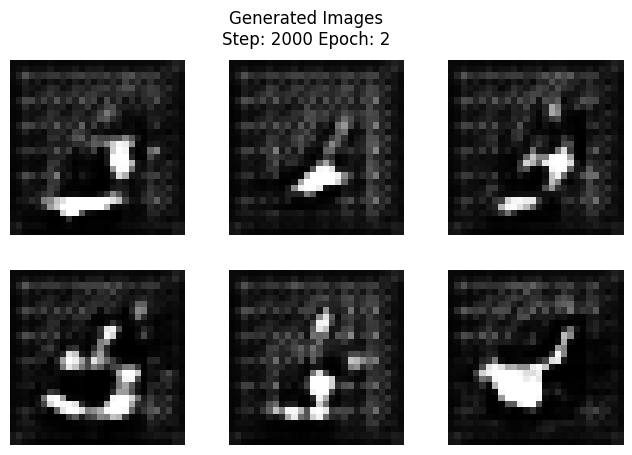

 67%|██████▋   | 2500/3750 [02:01<00:56, 22.32it/s]

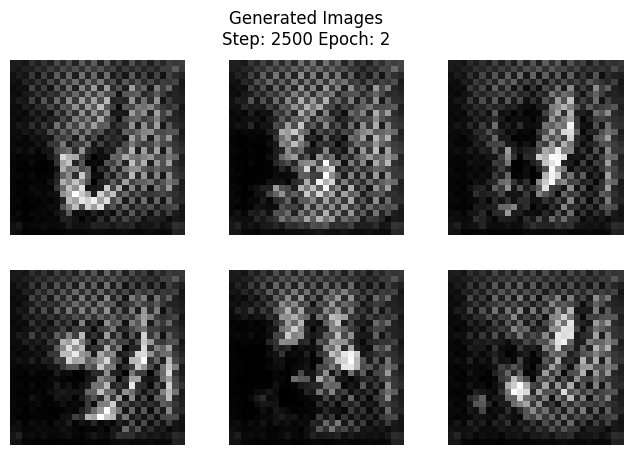

 80%|████████  | 3000/3750 [02:26<00:43, 17.35it/s]

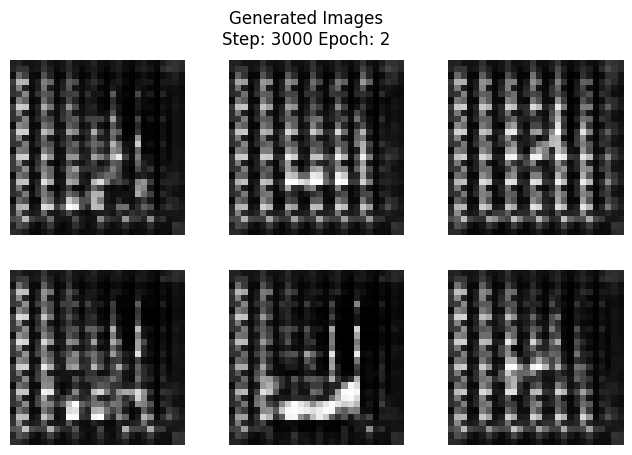

 93%|█████████▎| 3500/3750 [02:50<00:11, 21.68it/s]

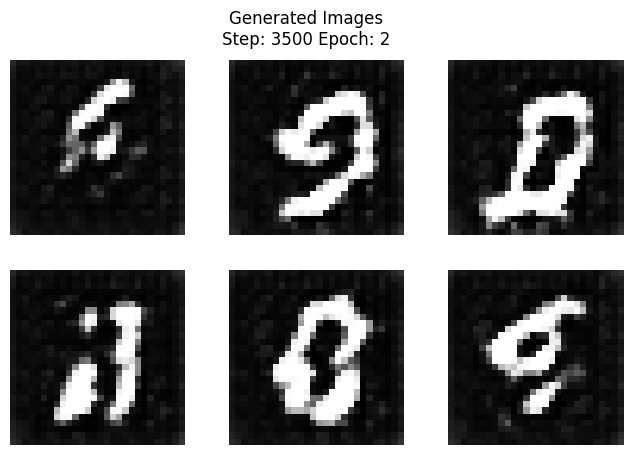

100%|██████████| 3750/3750 [03:02<00:00, 20.50it/s]


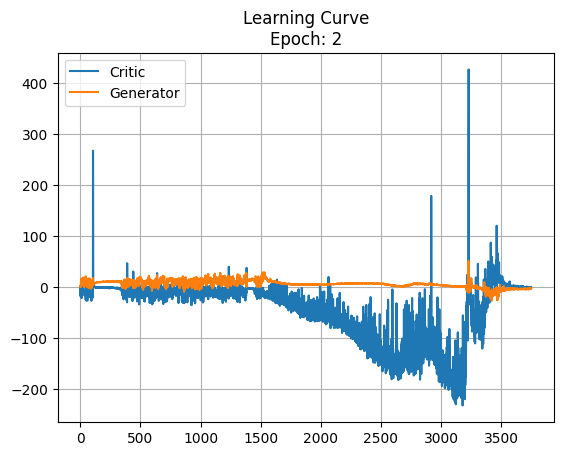

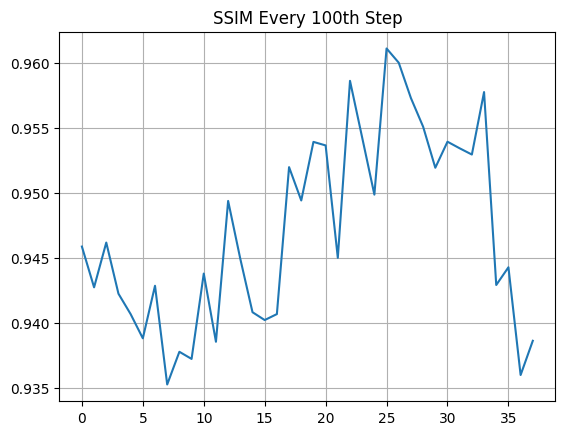

  0%|          | 0/3750 [00:00<?, ?it/s]

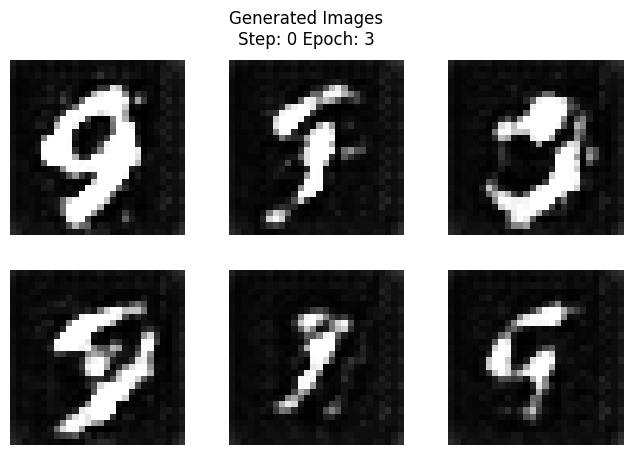

 13%|█▎        | 499/3750 [00:24<02:24, 22.51it/s]

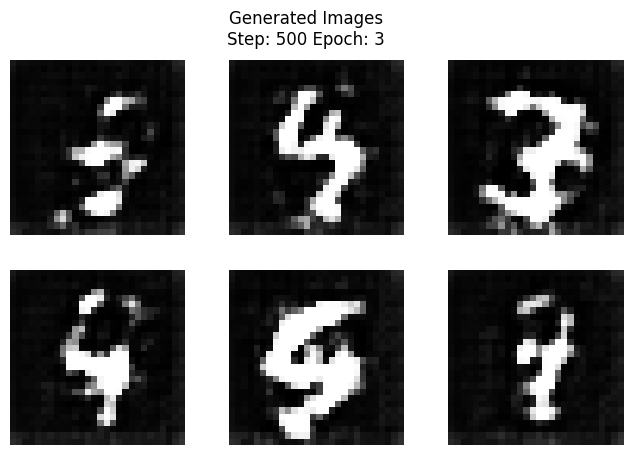

 27%|██▋       | 1000/3750 [00:50<02:04, 22.06it/s]

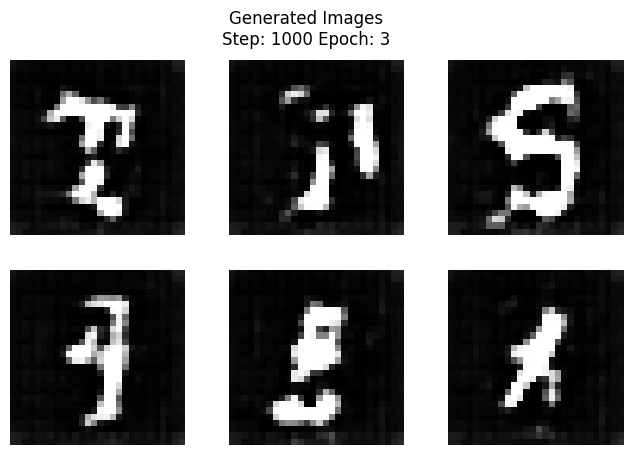

 40%|███▉      | 1498/3750 [01:14<01:40, 22.44it/s]

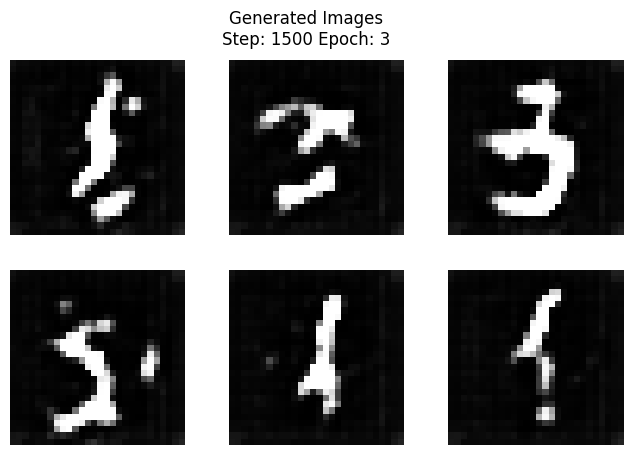

 53%|█████▎    | 2000/3750 [01:38<01:23, 21.01it/s]

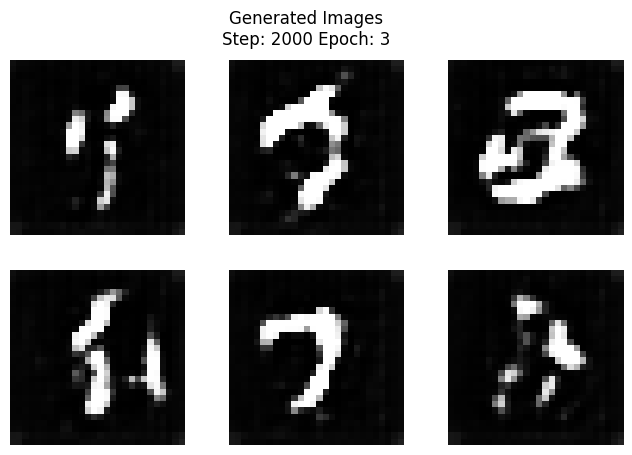

 67%|██████▋   | 2499/3750 [02:01<01:10, 17.81it/s]

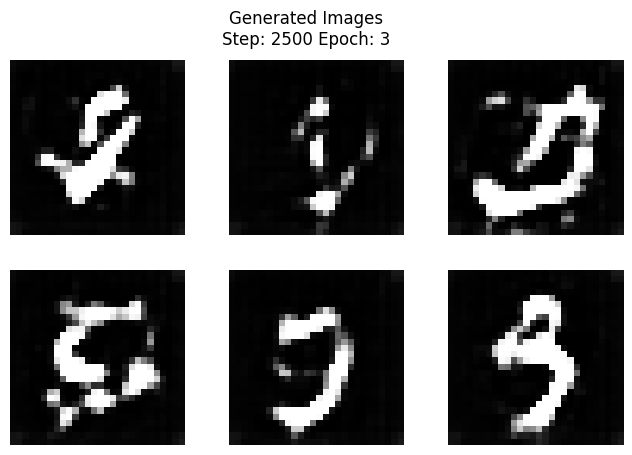

 80%|████████  | 3000/3750 [02:25<00:41, 18.08it/s]

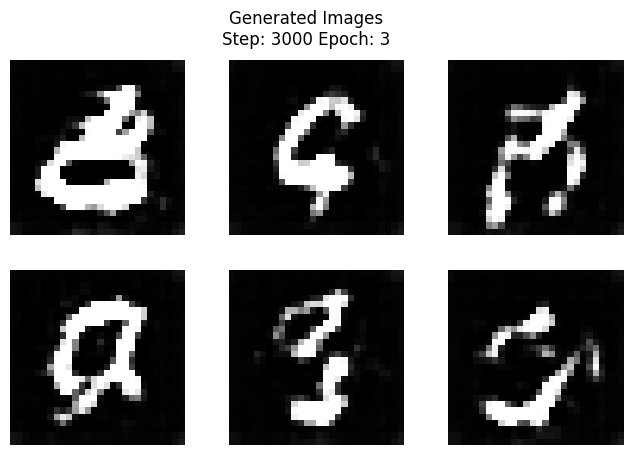

 93%|█████████▎| 3500/3750 [02:49<00:11, 22.13it/s]

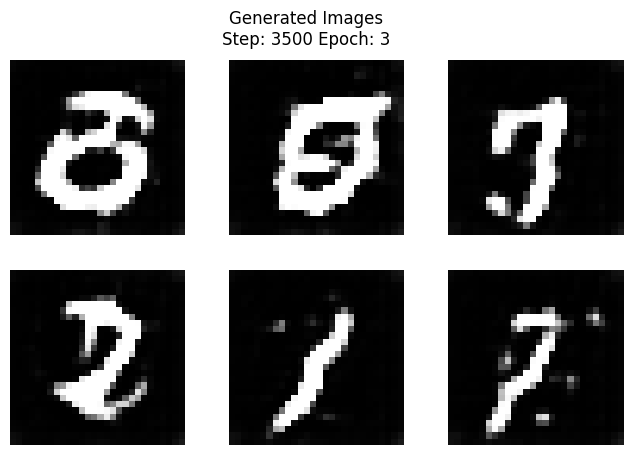

100%|██████████| 3750/3750 [03:01<00:00, 20.62it/s]


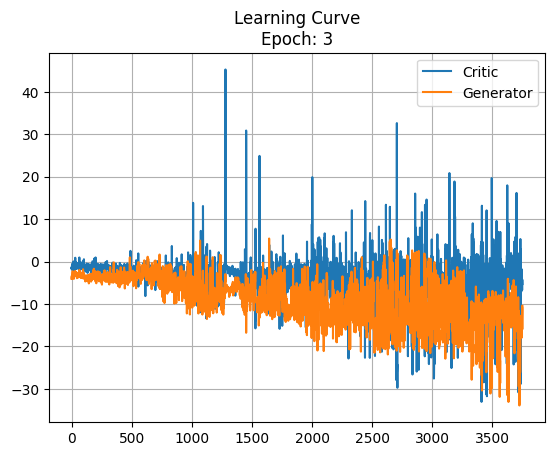

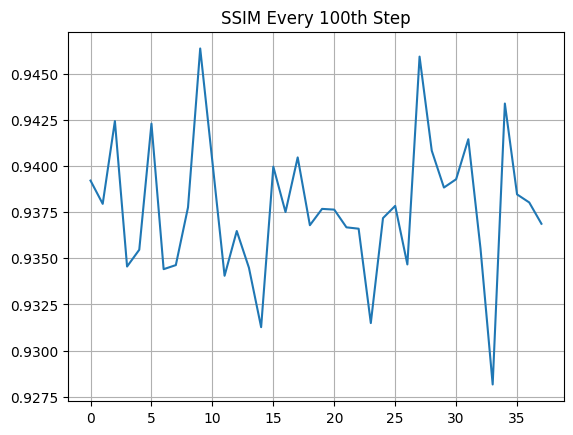

  0%|          | 0/3750 [00:00<?, ?it/s]

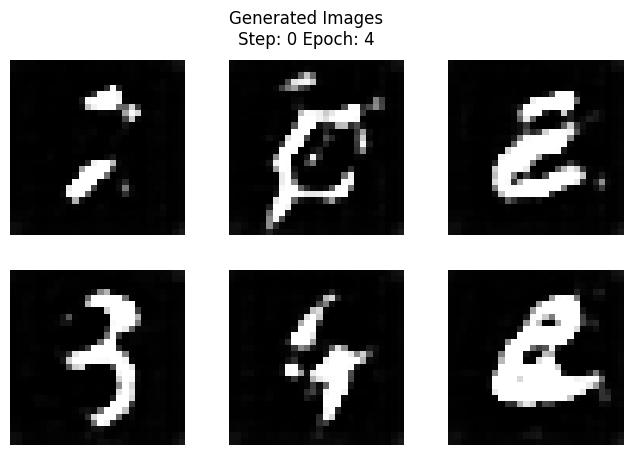

 13%|█▎        | 500/3750 [00:23<02:20, 23.21it/s]

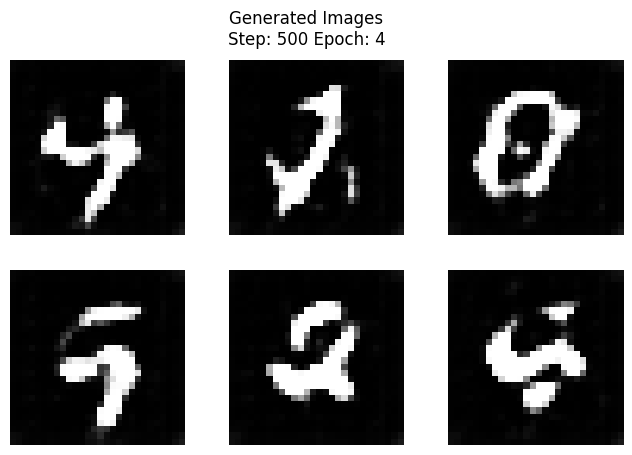

 27%|██▋       | 999/3750 [00:47<02:00, 22.87it/s]

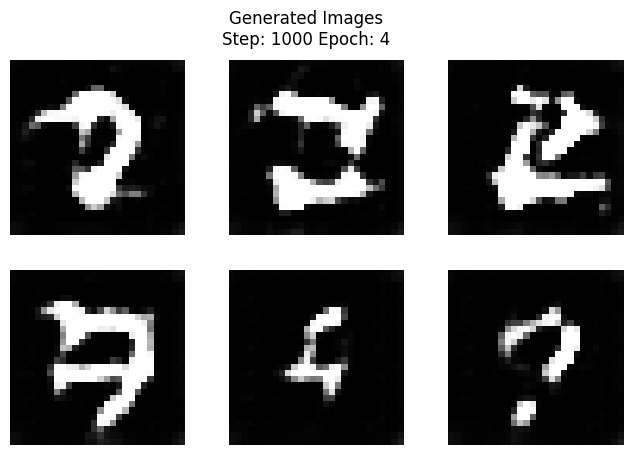

 40%|████      | 1500/3750 [01:10<01:39, 22.61it/s]

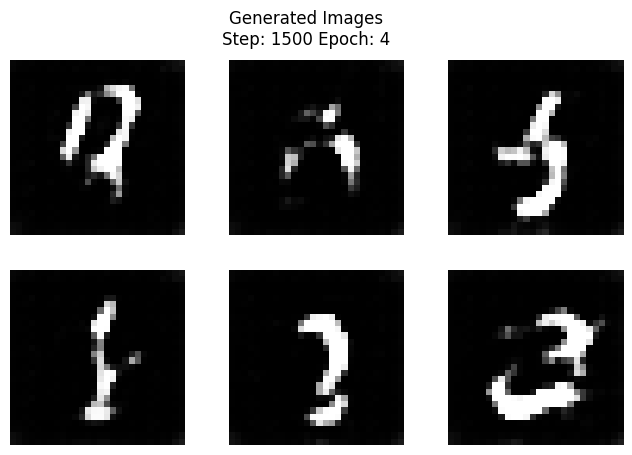

 53%|█████▎    | 1999/3750 [01:34<01:17, 22.52it/s]

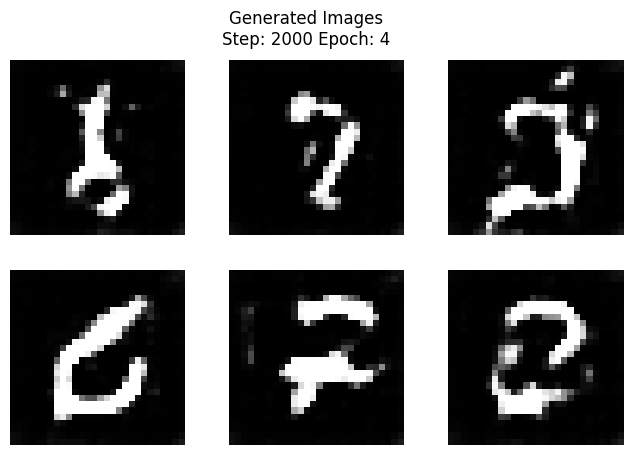

 67%|██████▋   | 2499/3750 [01:58<00:54, 23.08it/s]

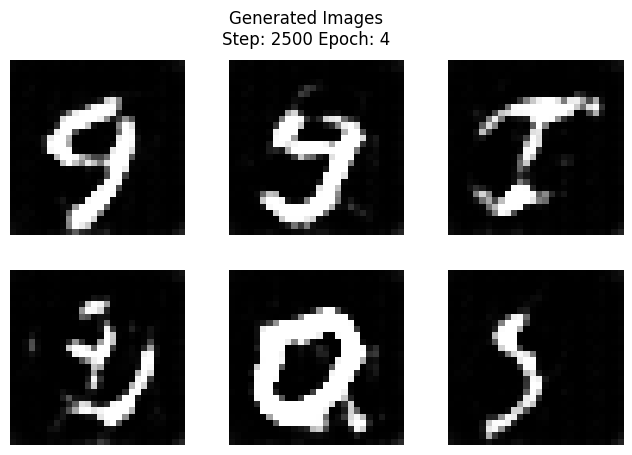

 80%|████████  | 3000/3750 [02:23<00:36, 20.40it/s]

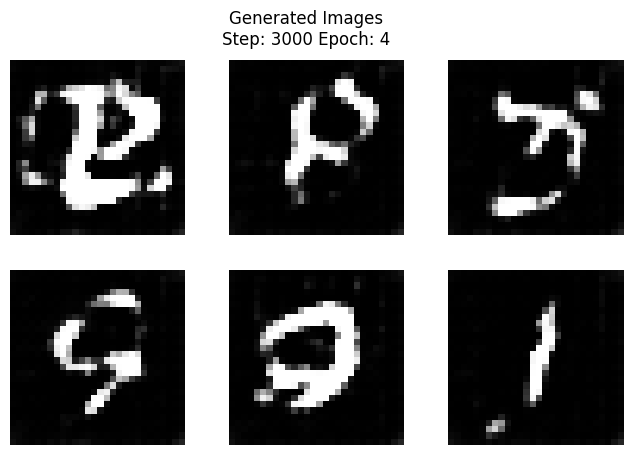

 93%|█████████▎| 3500/3750 [02:48<00:11, 22.72it/s]

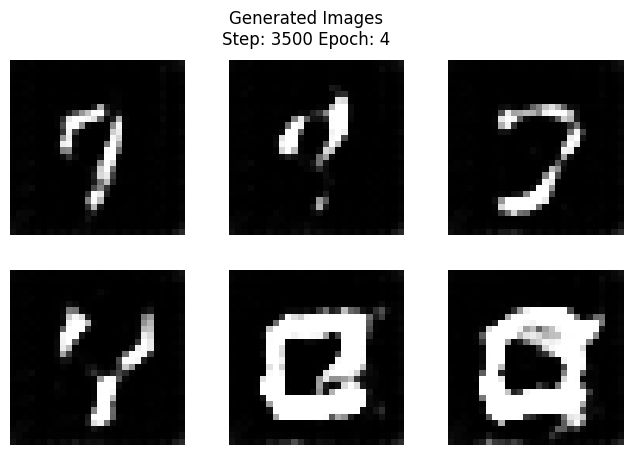

100%|██████████| 3750/3750 [03:00<00:00, 20.77it/s]


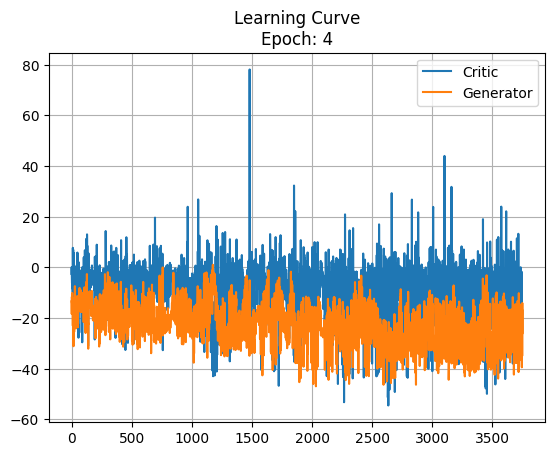

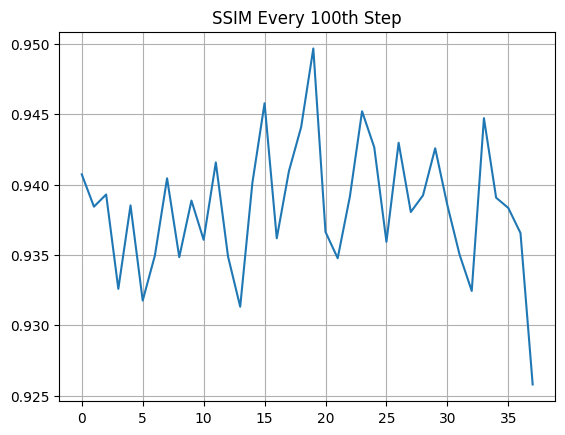

  0%|          | 0/3750 [00:00<?, ?it/s]

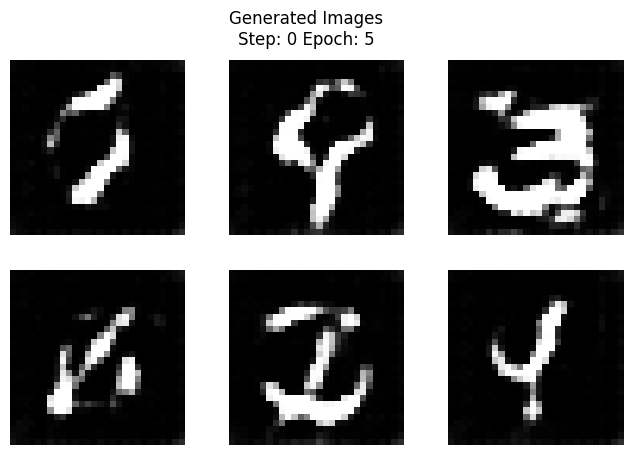

 13%|█▎        | 499/3750 [00:24<02:23, 22.60it/s]

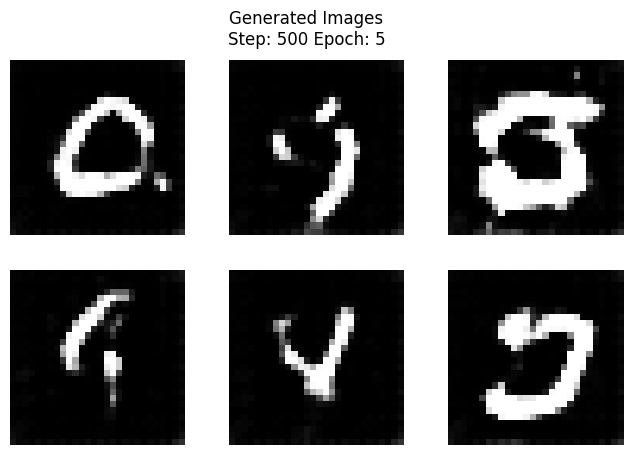

 27%|██▋       | 998/3750 [00:48<02:01, 22.72it/s]

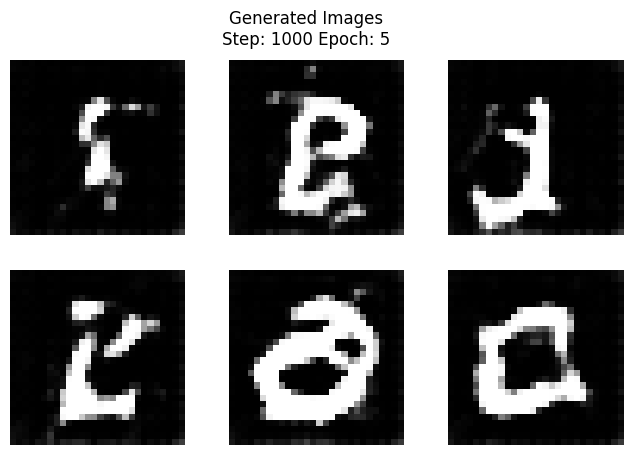

 40%|███▉      | 1499/3750 [01:11<01:42, 21.87it/s]

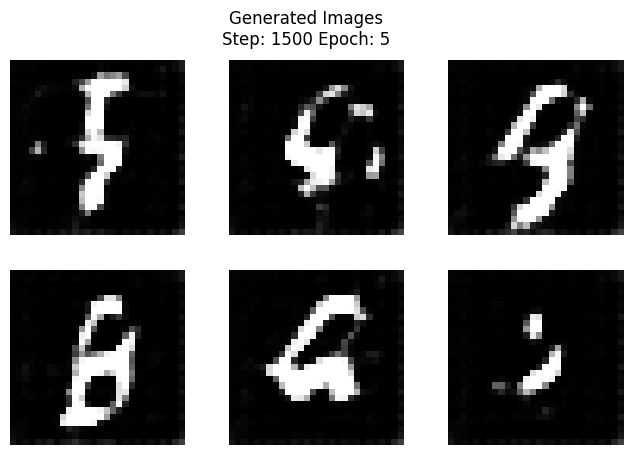

 53%|█████▎    | 2000/3750 [01:35<01:17, 22.57it/s]

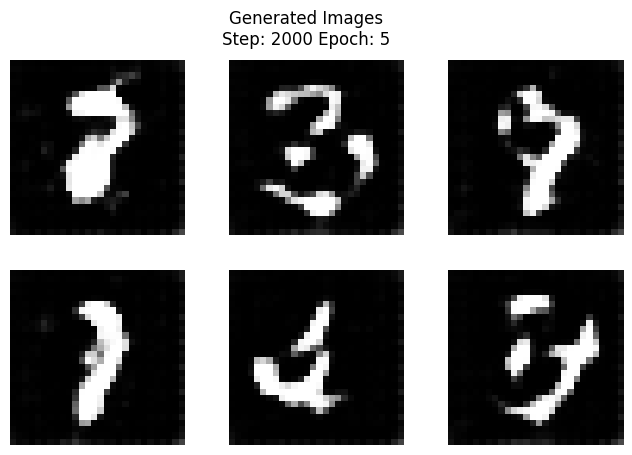

 67%|██████▋   | 2498/3750 [01:59<00:56, 22.15it/s]

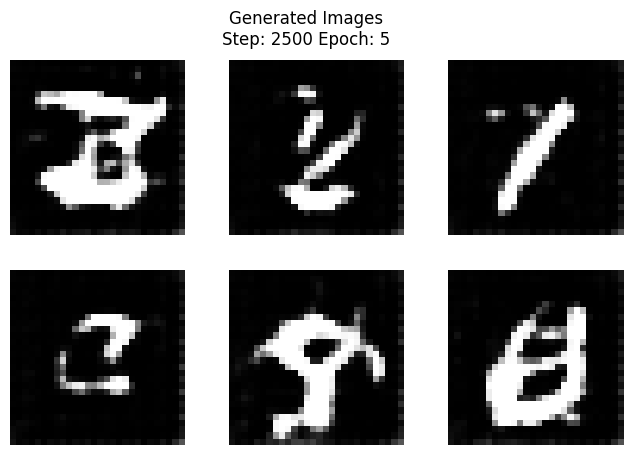

 80%|███████▉  | 2999/3750 [02:24<00:37, 20.28it/s]

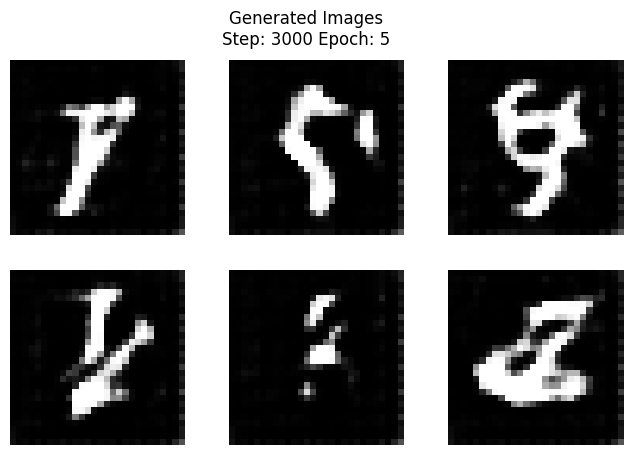

 93%|█████████▎| 3500/3750 [02:49<00:12, 20.13it/s]

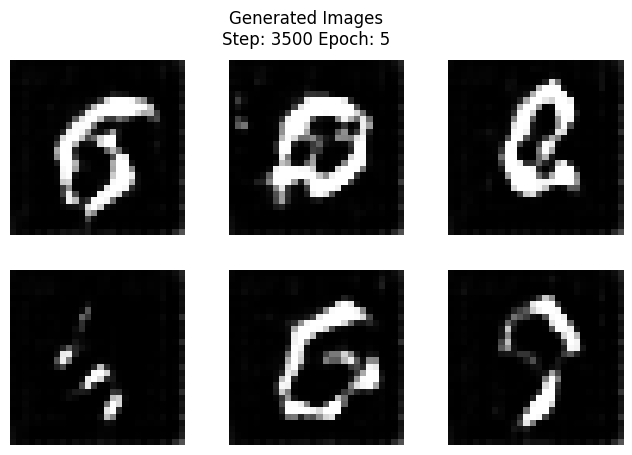

100%|██████████| 3750/3750 [03:01<00:00, 20.64it/s]


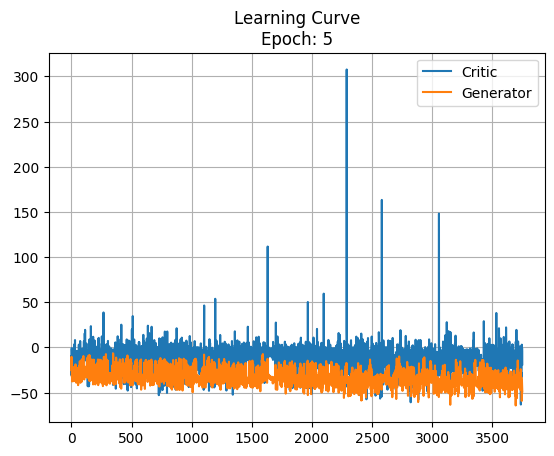

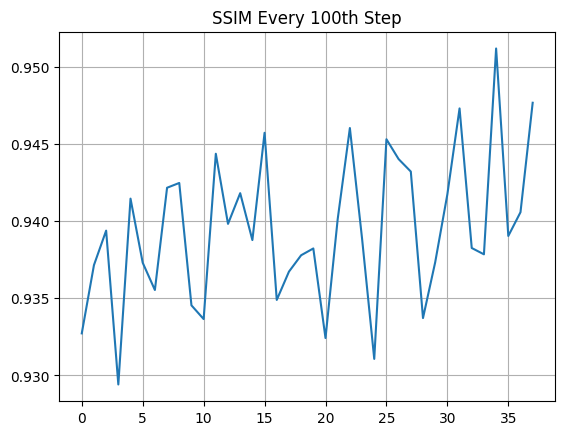

  0%|          | 0/3750 [00:00<?, ?it/s]

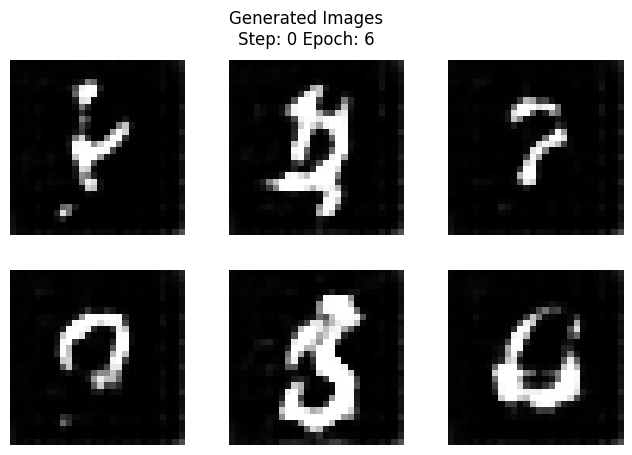

 13%|█▎        | 500/3750 [00:24<02:47, 19.39it/s]

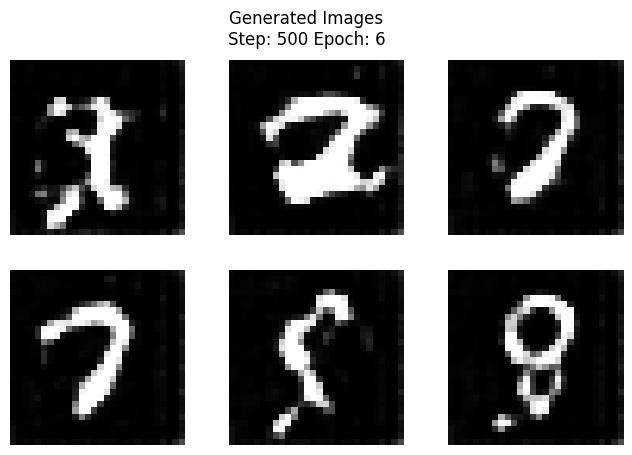

 27%|██▋       | 998/3750 [00:49<02:21, 19.46it/s]

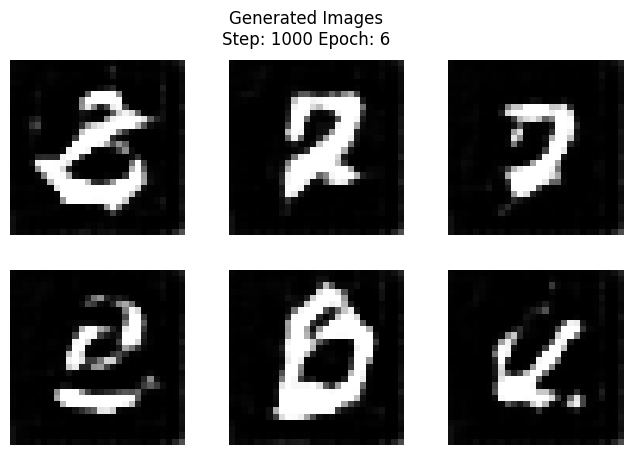

 40%|████      | 1500/3750 [01:14<02:20, 16.02it/s]

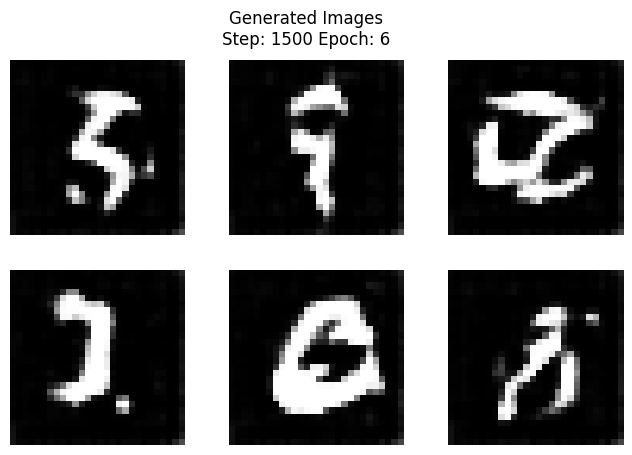

 53%|█████▎    | 1999/3750 [01:38<01:43, 16.88it/s]

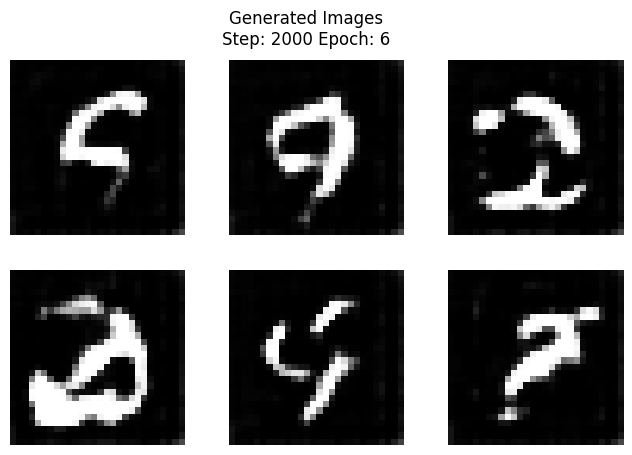

 67%|██████▋   | 2500/3750 [02:03<01:16, 16.41it/s]

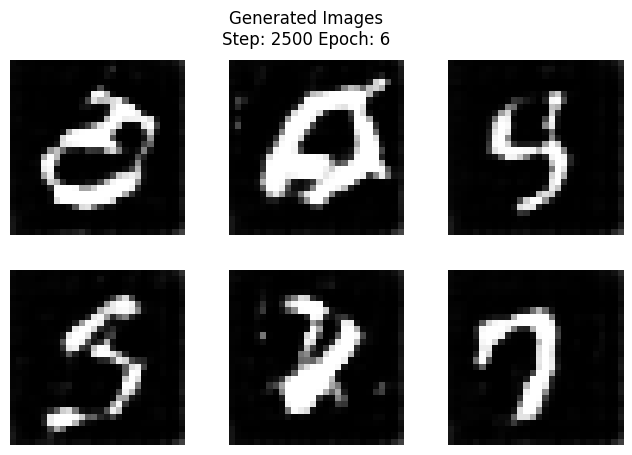

 80%|███████▉  | 2998/3750 [02:27<00:37, 20.22it/s]

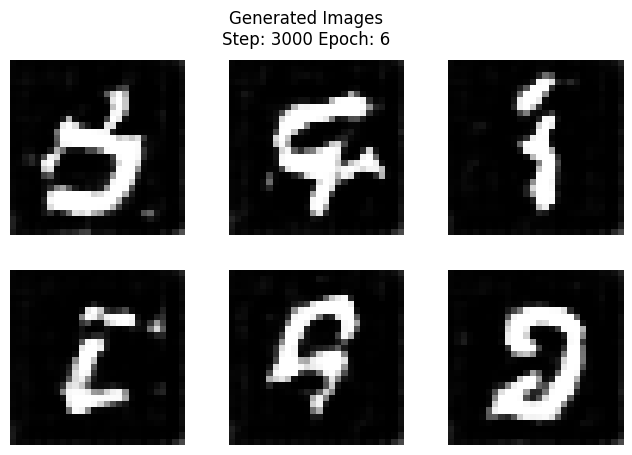

 93%|█████████▎| 3499/3750 [02:52<00:11, 21.67it/s]

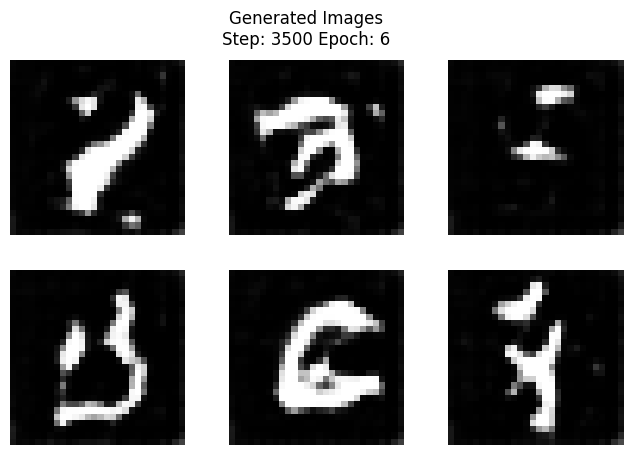

100%|██████████| 3750/3750 [03:05<00:00, 20.22it/s]


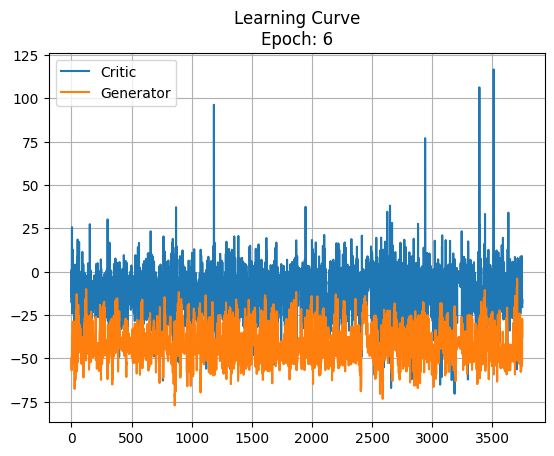

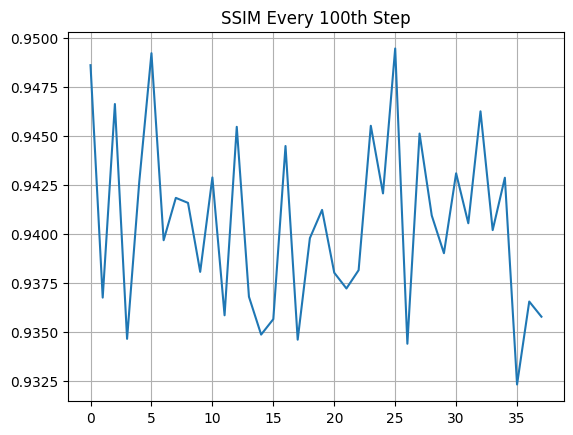

  0%|          | 0/3750 [00:00<?, ?it/s]

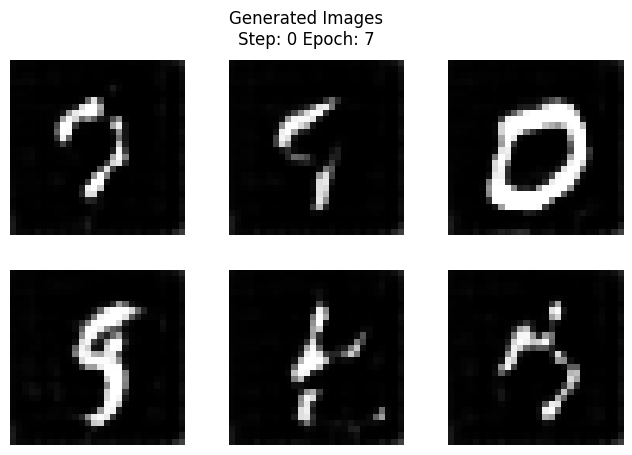

 13%|█▎        | 499/3750 [00:24<02:33, 21.14it/s]

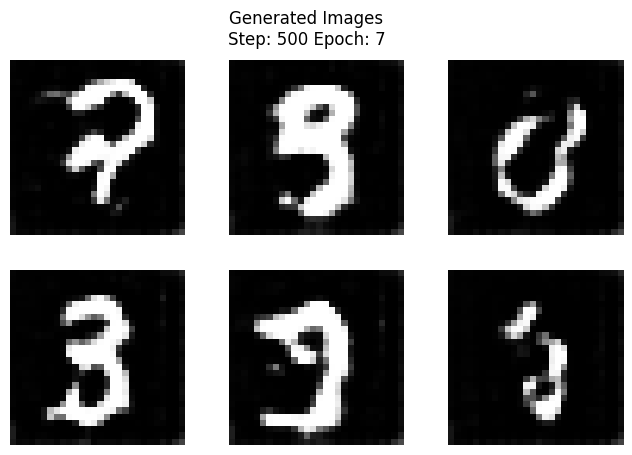

 27%|██▋       | 1000/3750 [00:49<02:05, 21.93it/s]

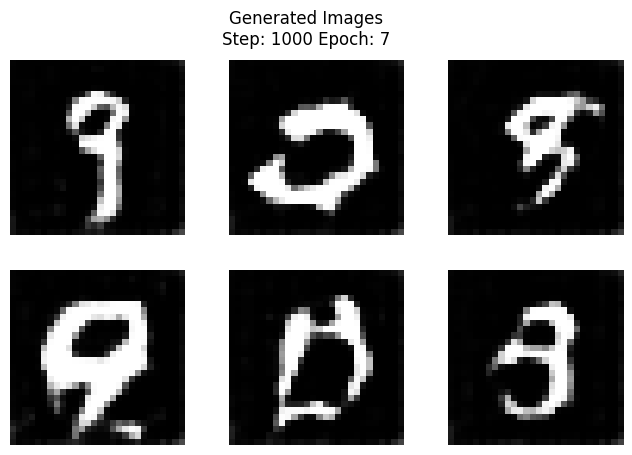

 40%|████      | 1500/3750 [01:14<01:42, 21.85it/s]

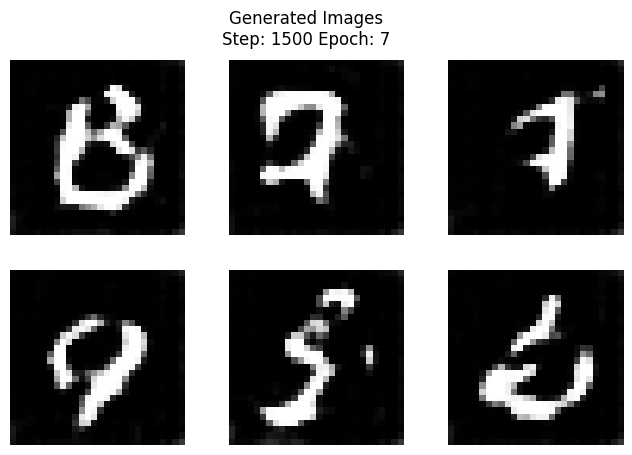

 53%|█████▎    | 1998/3750 [01:39<01:21, 21.42it/s]

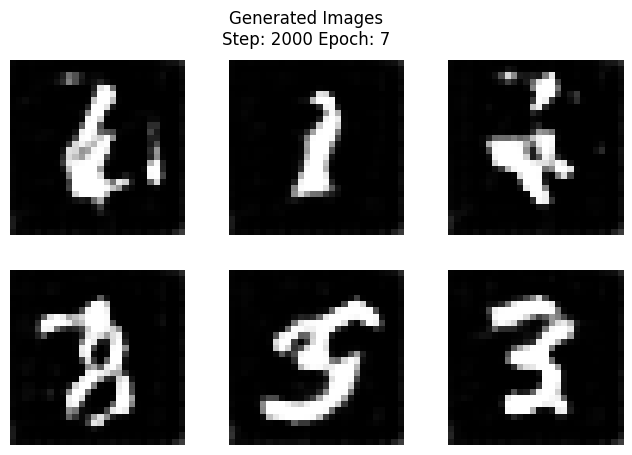

 67%|██████▋   | 2498/3750 [02:04<00:57, 21.87it/s]

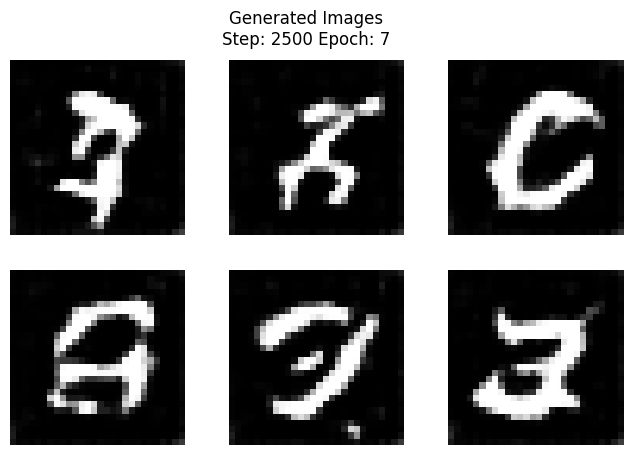

 80%|███████▉  | 2998/3750 [02:29<00:35, 21.14it/s]

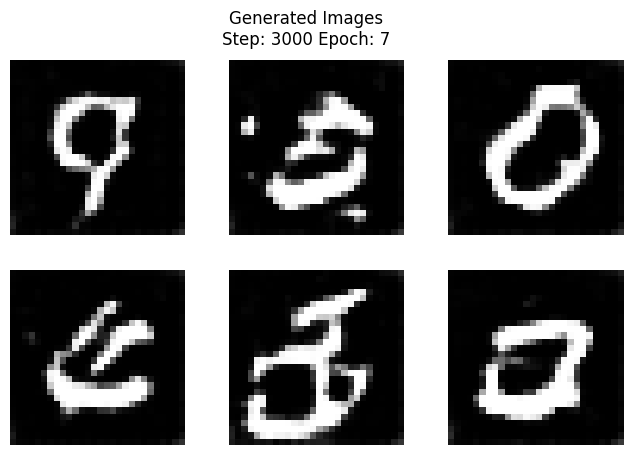

 93%|█████████▎| 3500/3750 [02:54<00:11, 21.94it/s]

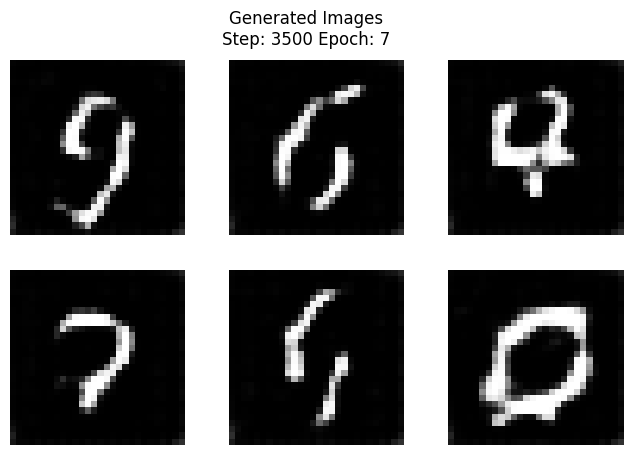

100%|██████████| 3750/3750 [03:07<00:00, 20.03it/s]


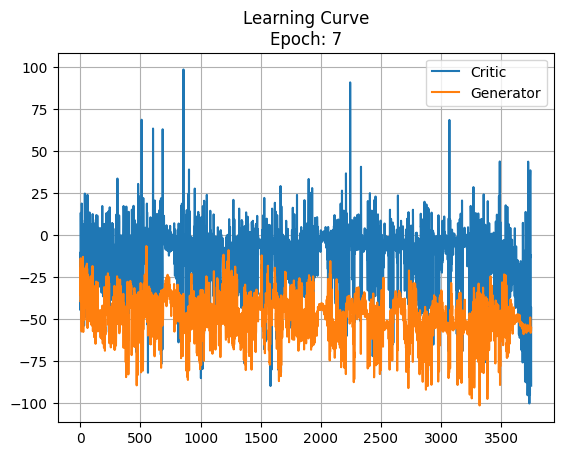

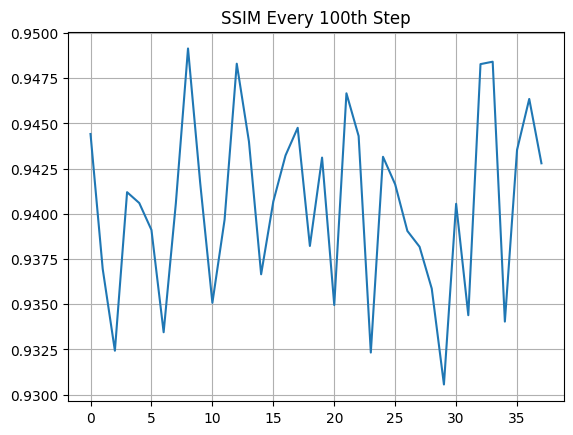

  0%|          | 0/3750 [00:00<?, ?it/s]

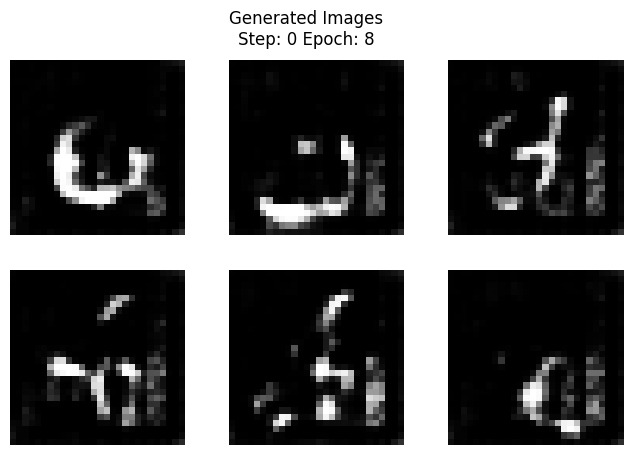

 13%|█▎        | 500/3750 [00:25<02:28, 21.94it/s]

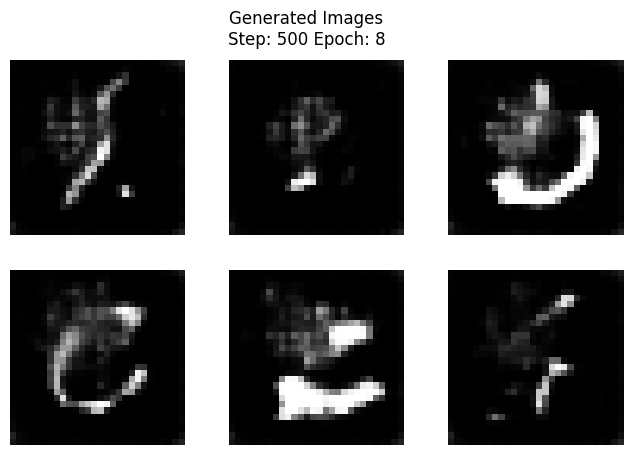

 27%|██▋       | 1000/3750 [00:50<02:08, 21.47it/s]

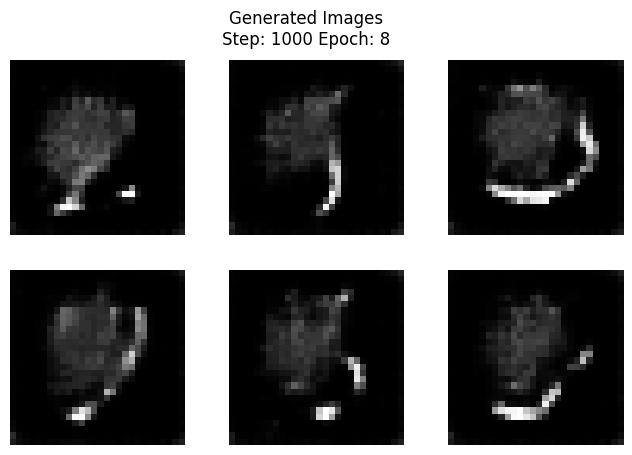

 40%|███▉      | 1498/3750 [01:15<01:43, 21.69it/s]

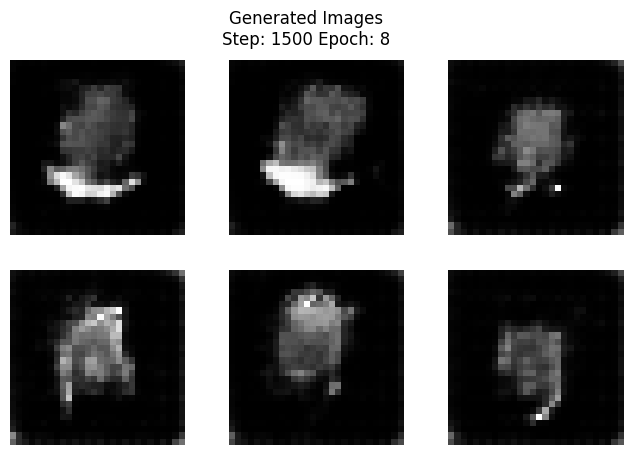

 53%|█████▎    | 1999/3750 [01:40<01:19, 21.96it/s]

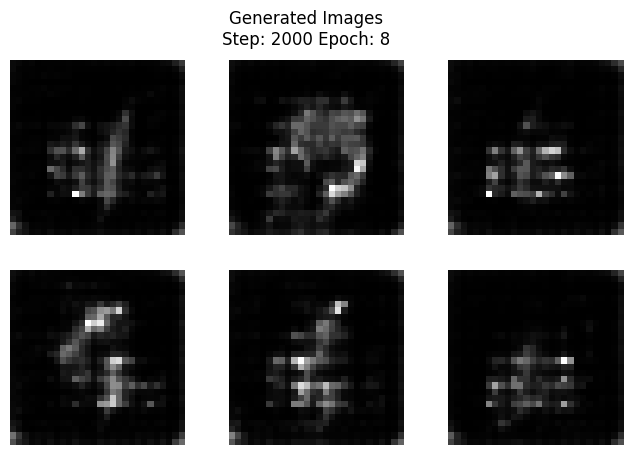

 67%|██████▋   | 2498/3750 [02:05<01:00, 20.82it/s]

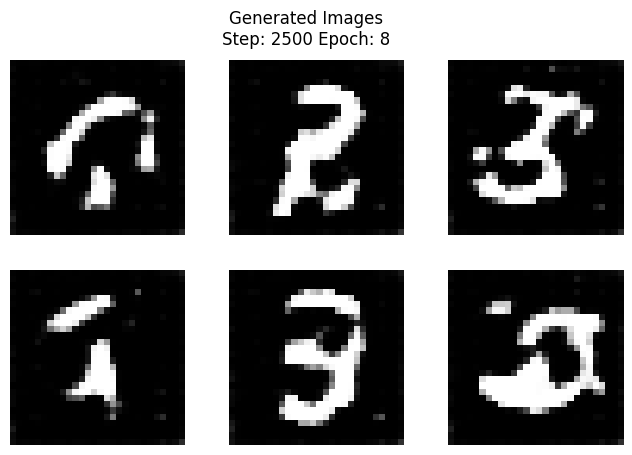

 80%|████████  | 3000/3750 [02:30<00:34, 21.61it/s]

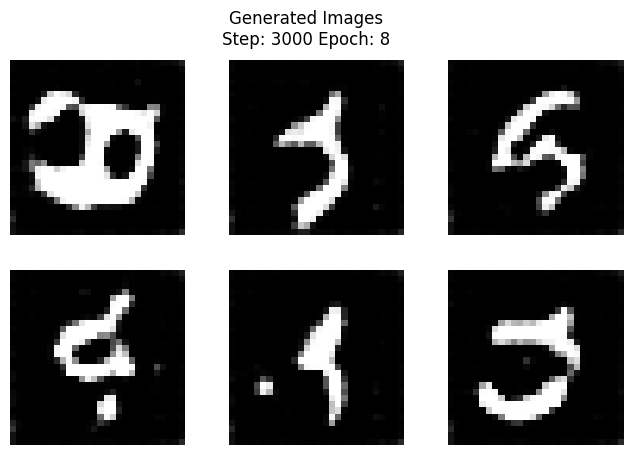

 93%|█████████▎| 3499/3750 [02:55<00:11, 21.92it/s]

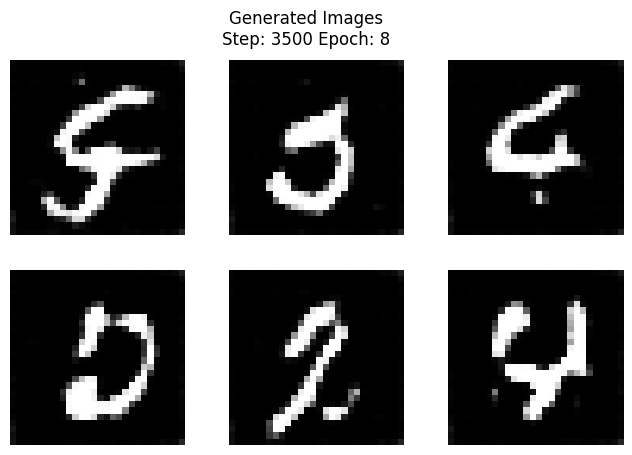

100%|██████████| 3750/3750 [03:08<00:00, 19.92it/s]


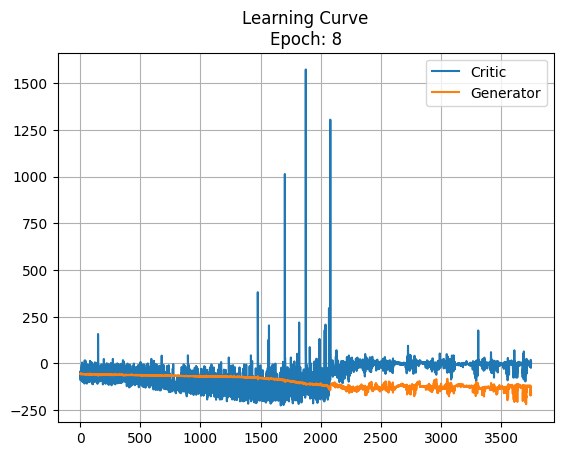

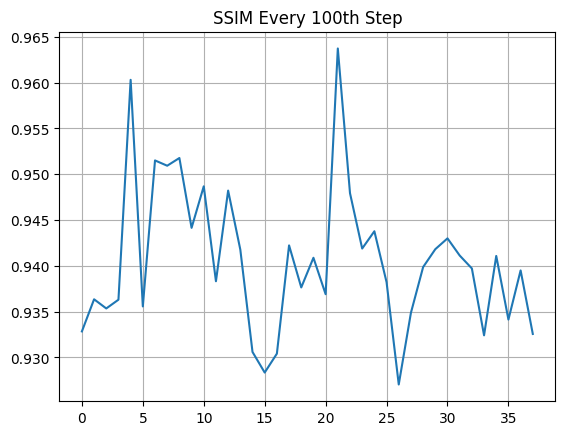

  0%|          | 0/3750 [00:00<?, ?it/s]

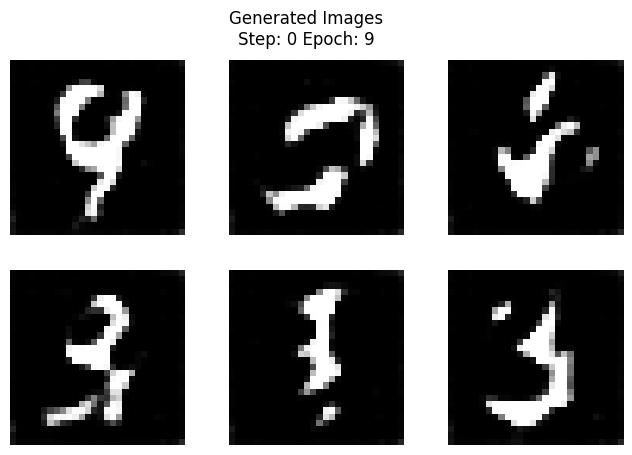

 13%|█▎        | 498/3750 [00:25<02:29, 21.77it/s]

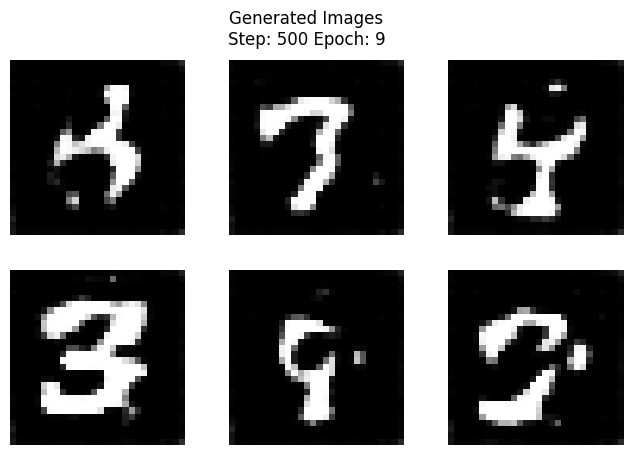

 27%|██▋       | 998/3750 [00:50<02:07, 21.56it/s]

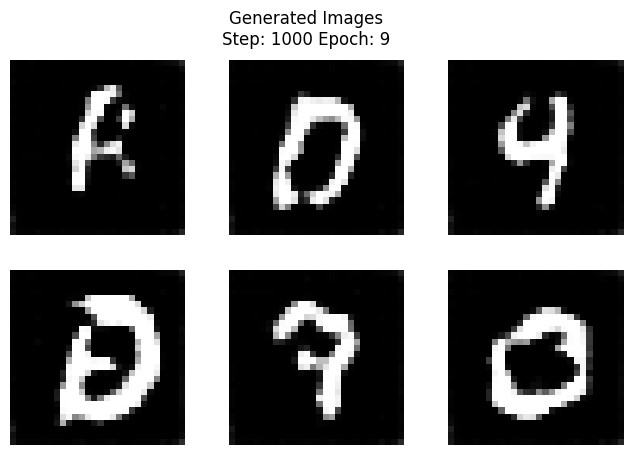

 40%|███▉      | 1499/3750 [01:15<01:42, 21.94it/s]

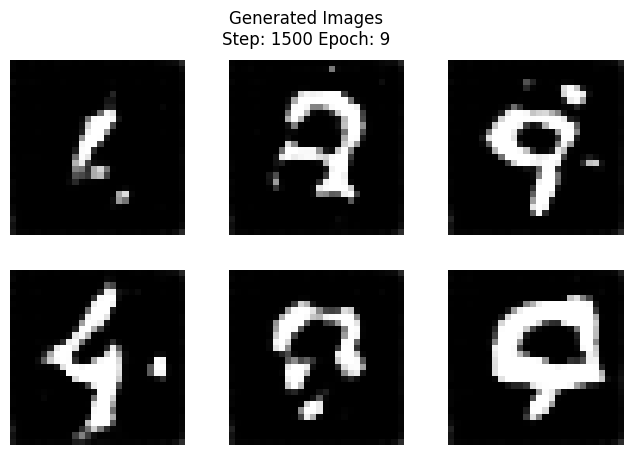

 53%|█████▎    | 1999/3750 [01:40<01:22, 21.32it/s]

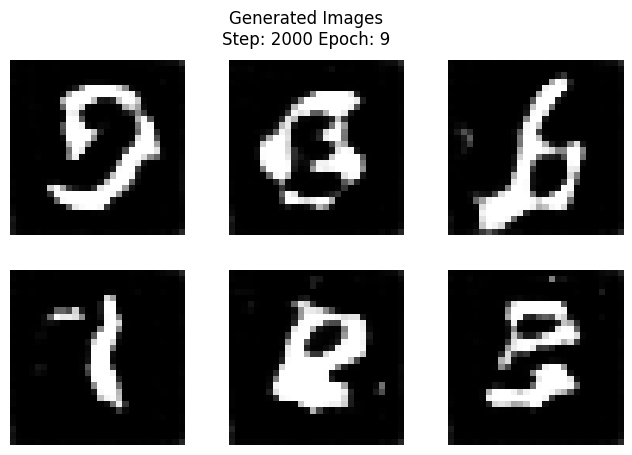

 67%|██████▋   | 2500/3750 [02:06<00:58, 21.39it/s]

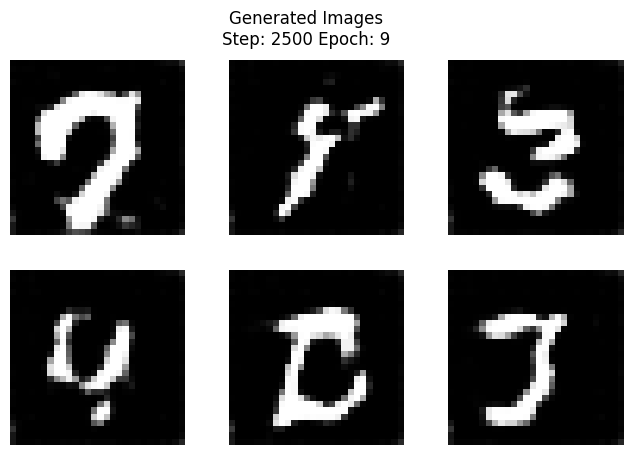

 80%|████████  | 3000/3750 [02:31<00:35, 21.31it/s]

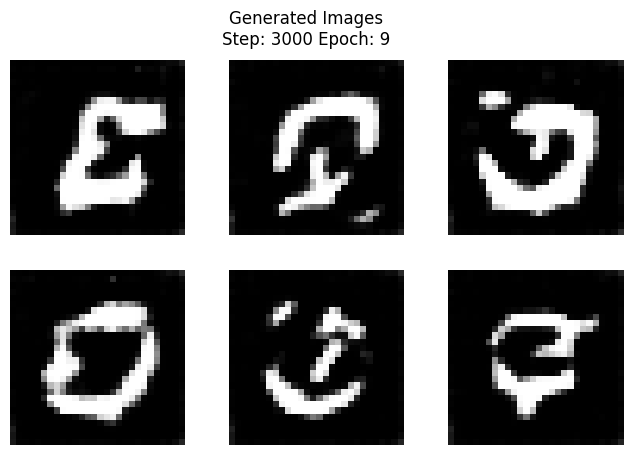

 93%|█████████▎| 3498/3750 [02:56<00:12, 20.07it/s]

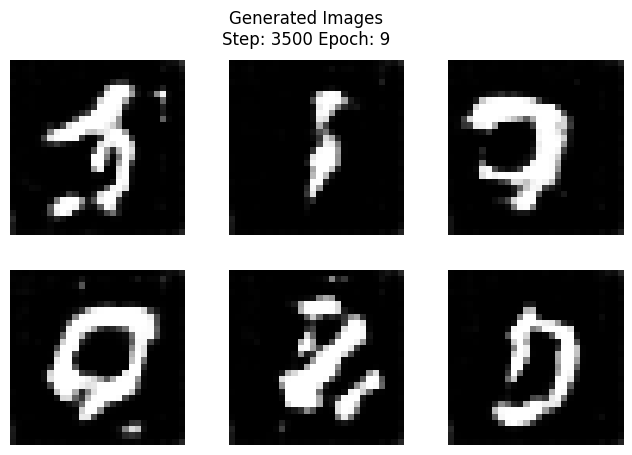

100%|██████████| 3750/3750 [03:09<00:00, 19.75it/s]


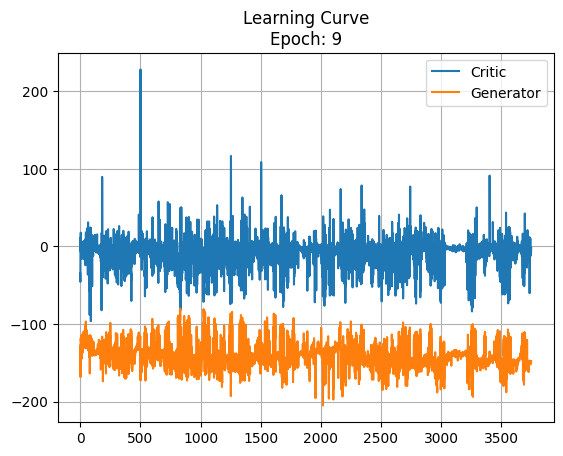

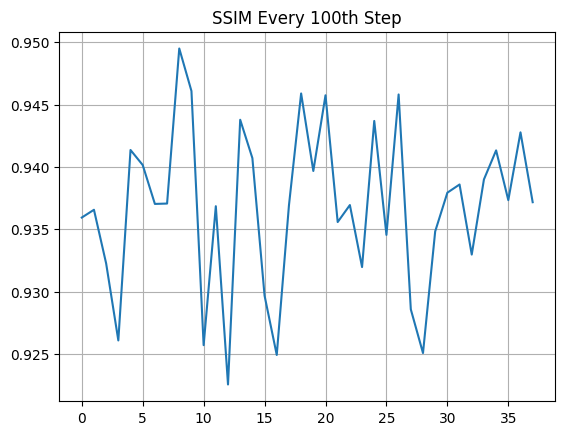

  0%|          | 0/3750 [00:00<?, ?it/s]

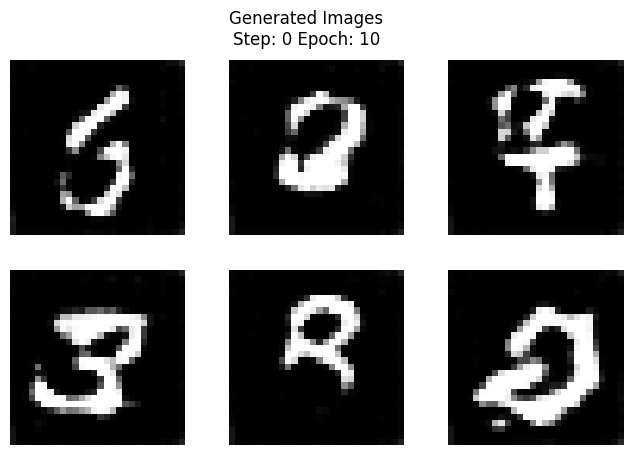

 13%|█▎        | 498/3750 [00:25<02:46, 19.52it/s]

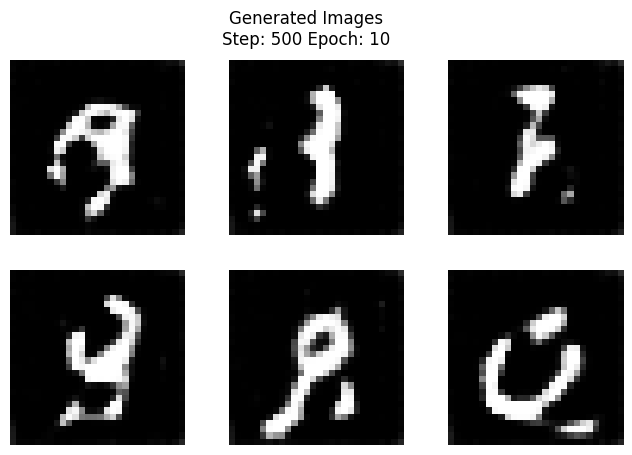

 27%|██▋       | 1000/3750 [00:50<02:39, 17.20it/s]

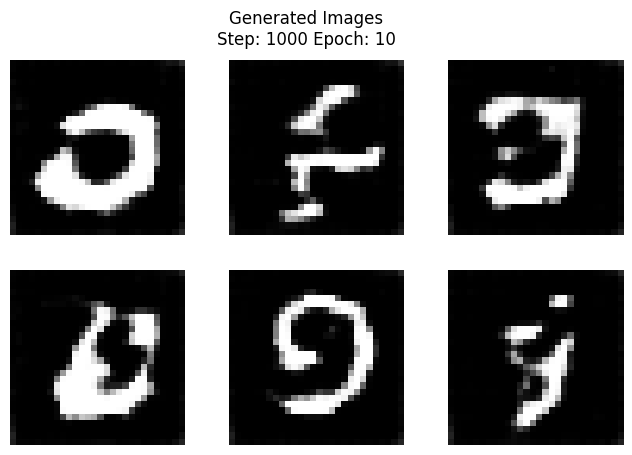

 40%|████      | 1500/3750 [01:15<02:09, 17.33it/s]

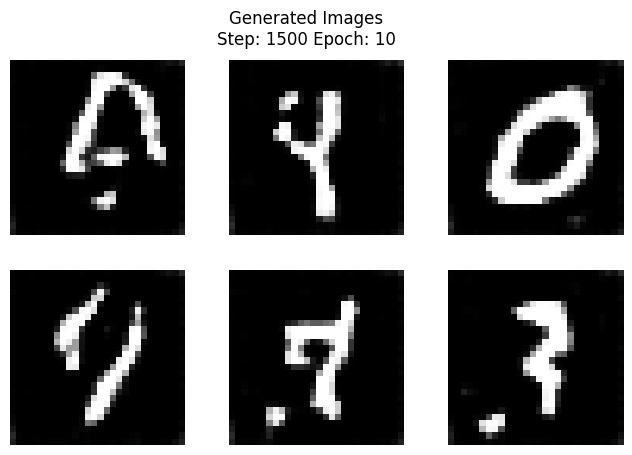

 53%|█████▎    | 1999/3750 [01:40<01:49, 16.06it/s]

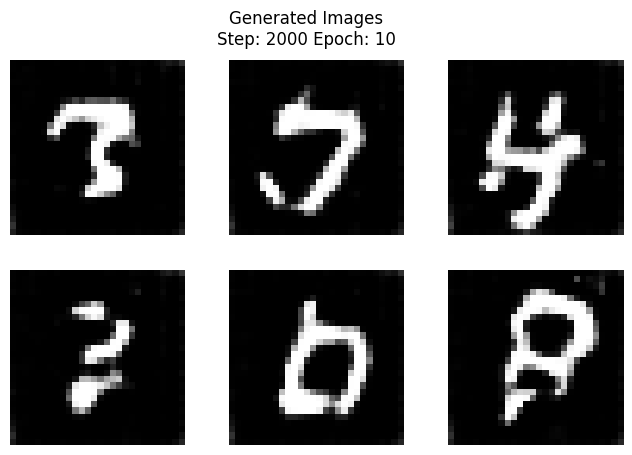

 67%|██████▋   | 2499/3750 [02:06<01:10, 17.80it/s]

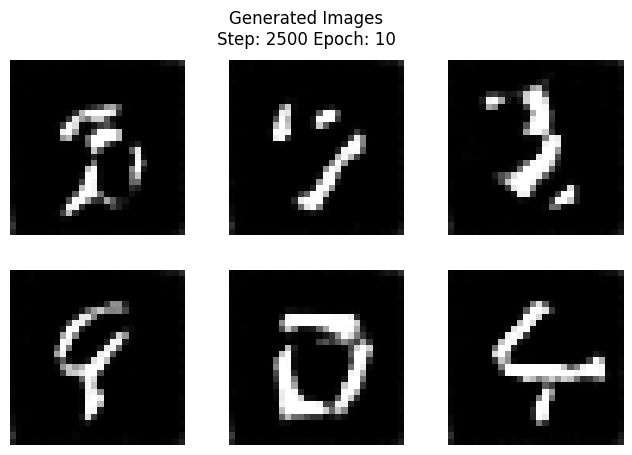

 80%|███████▉  | 2999/3750 [02:31<00:35, 21.41it/s]

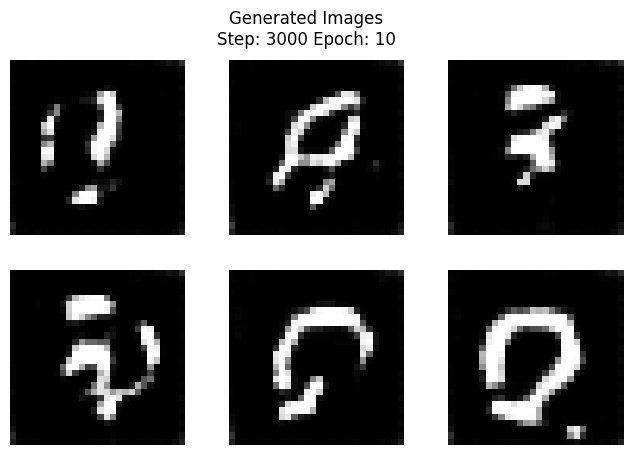

 93%|█████████▎| 3499/3750 [02:56<00:11, 21.32it/s]

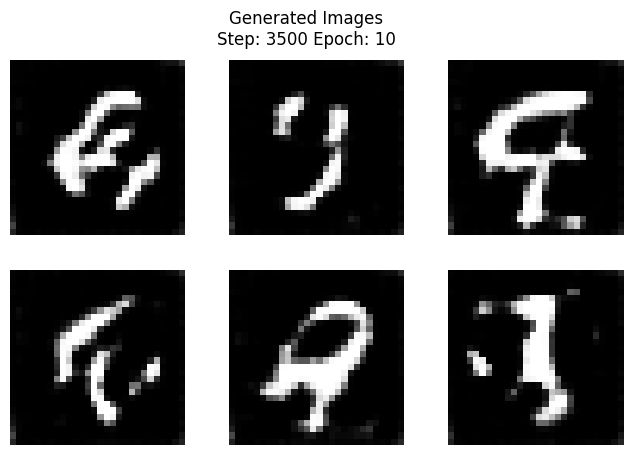

100%|██████████| 3750/3750 [03:09<00:00, 19.78it/s]


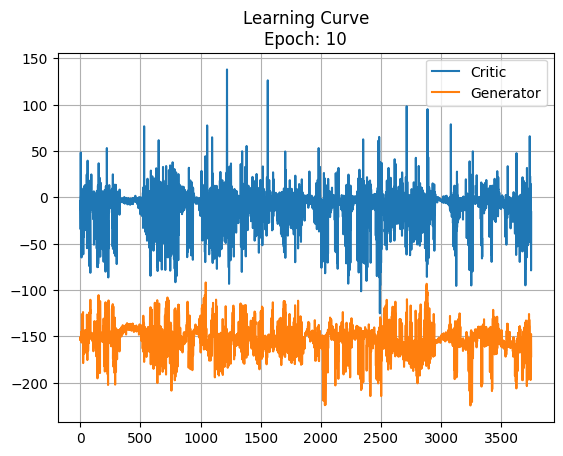

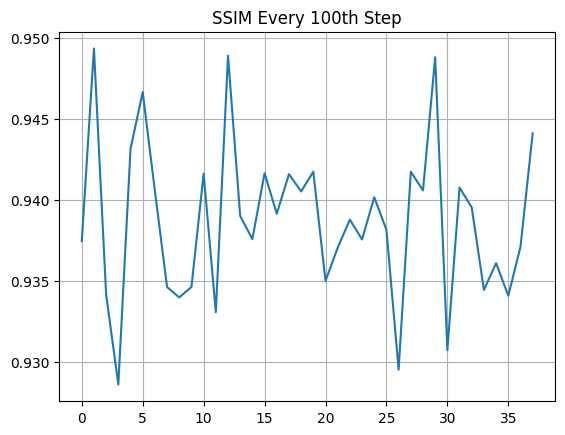

  0%|          | 0/3750 [00:00<?, ?it/s]

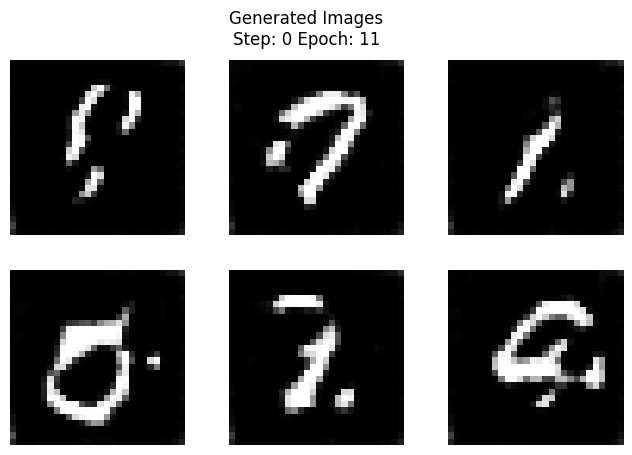

 13%|█▎        | 500/3750 [00:25<02:29, 21.77it/s]

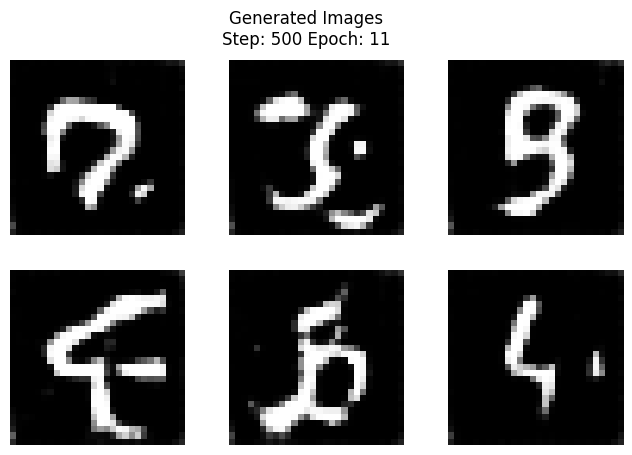

 27%|██▋       | 1000/3750 [00:51<02:07, 21.55it/s]

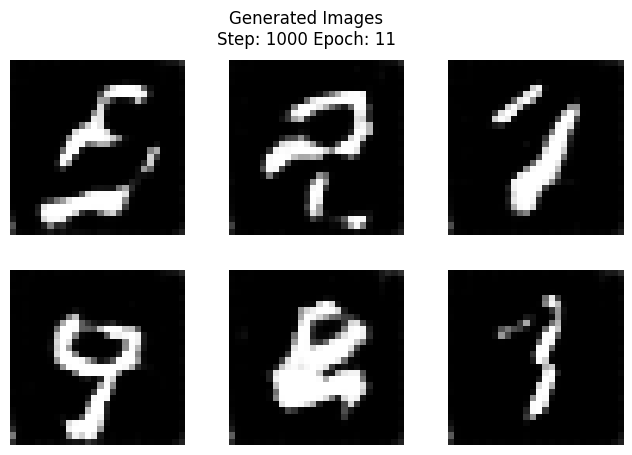

 40%|███▉      | 1499/3750 [01:16<01:43, 21.72it/s]

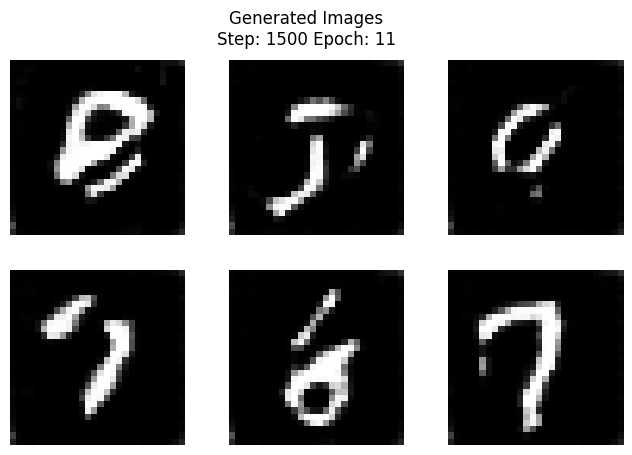

 53%|█████▎    | 1998/3750 [01:41<01:26, 20.35it/s]

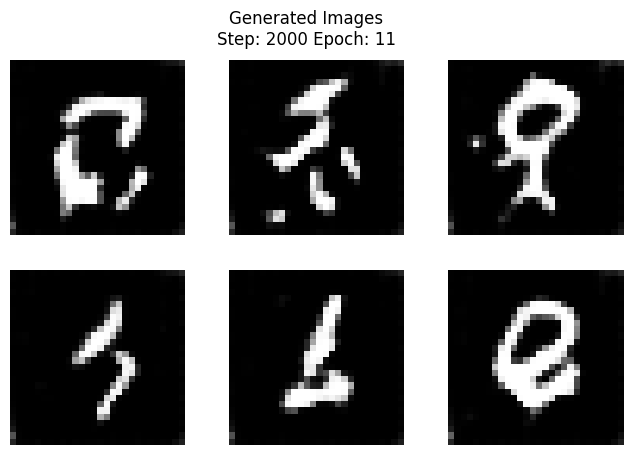

 67%|██████▋   | 2500/3750 [02:07<00:56, 21.98it/s]

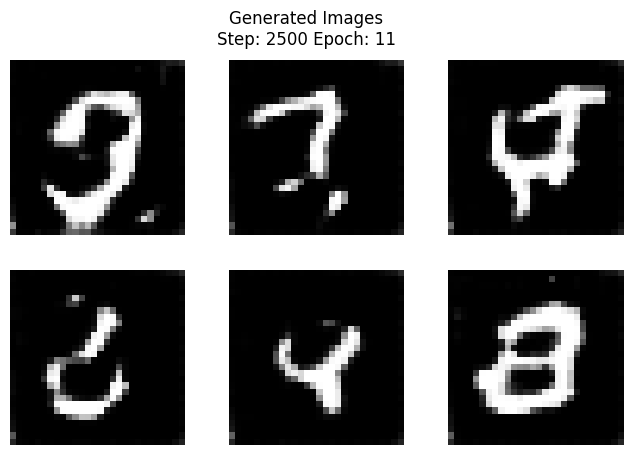

 80%|████████  | 3000/3750 [02:32<00:34, 21.98it/s]

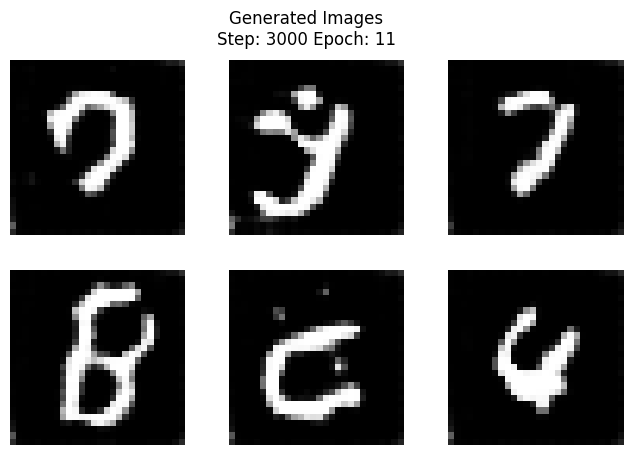

 93%|█████████▎| 3500/3750 [02:57<00:11, 21.34it/s]

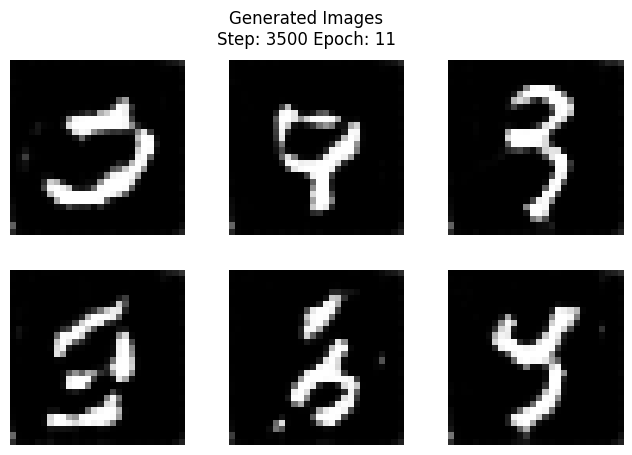

100%|██████████| 3750/3750 [03:10<00:00, 19.69it/s]


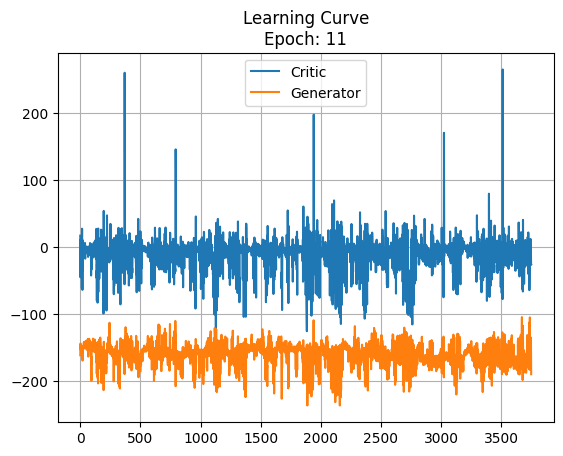

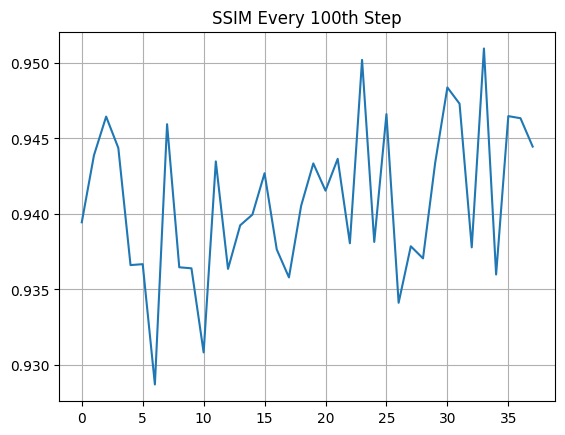

  0%|          | 0/3750 [00:00<?, ?it/s]

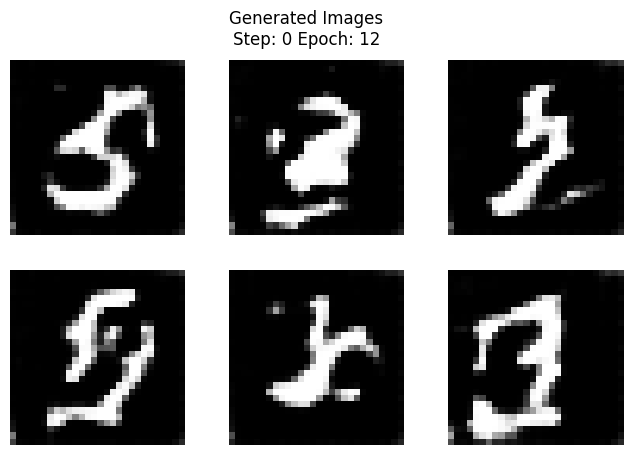

 13%|█▎        | 500/3750 [00:25<02:33, 21.24it/s]

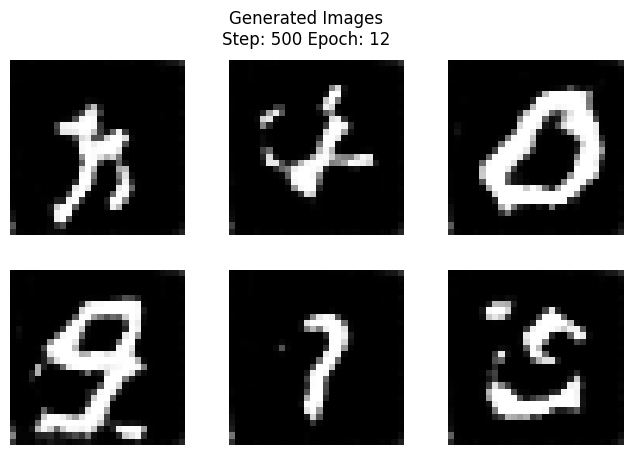

 27%|██▋       | 998/3750 [00:50<02:09, 21.33it/s]

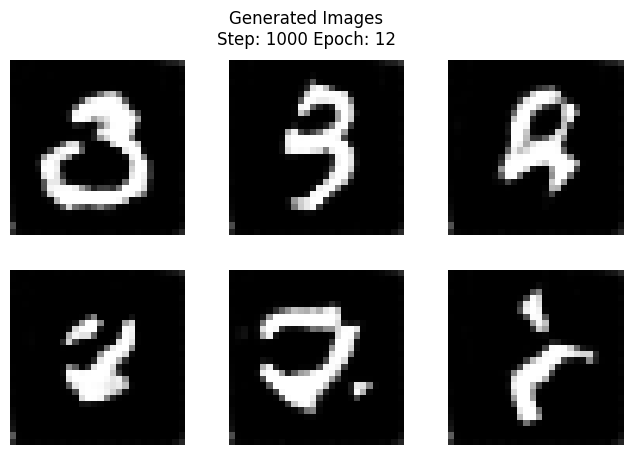

 40%|███▉      | 1498/3750 [01:15<02:17, 16.38it/s]

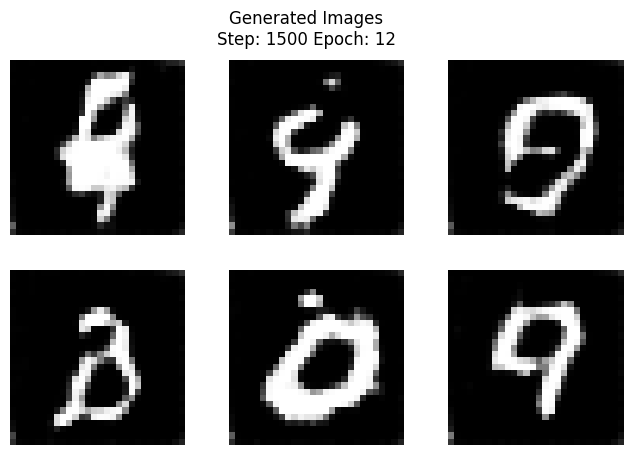

 53%|█████▎    | 1999/3750 [01:40<01:44, 16.69it/s]

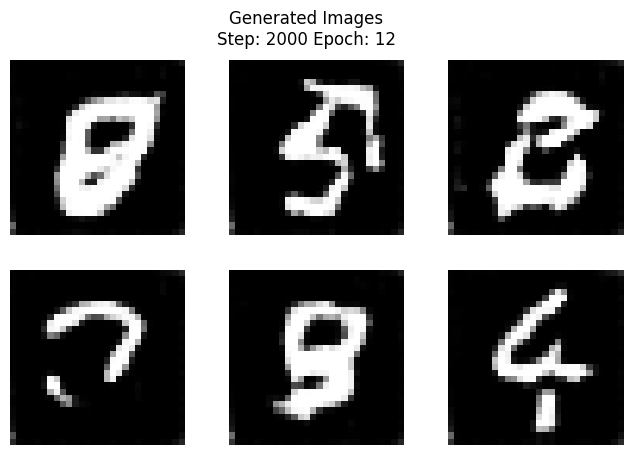

 67%|██████▋   | 2499/3750 [02:05<01:19, 15.66it/s]

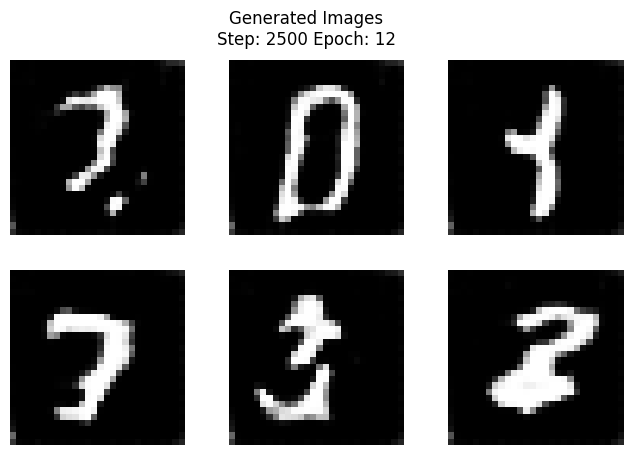

 80%|███████▉  | 2999/3750 [02:31<00:43, 17.39it/s]

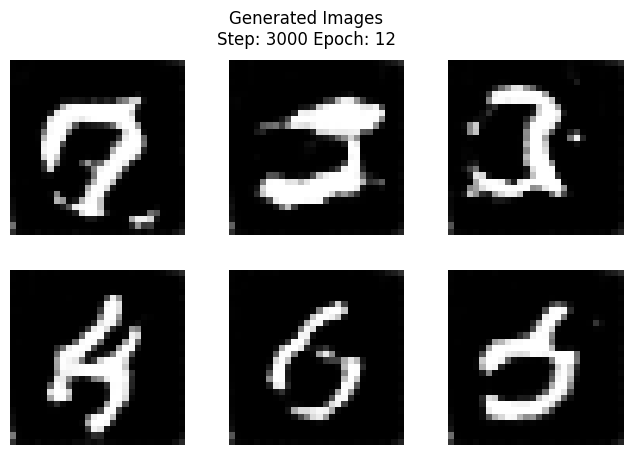

 93%|█████████▎| 3499/3750 [02:57<00:11, 21.15it/s]

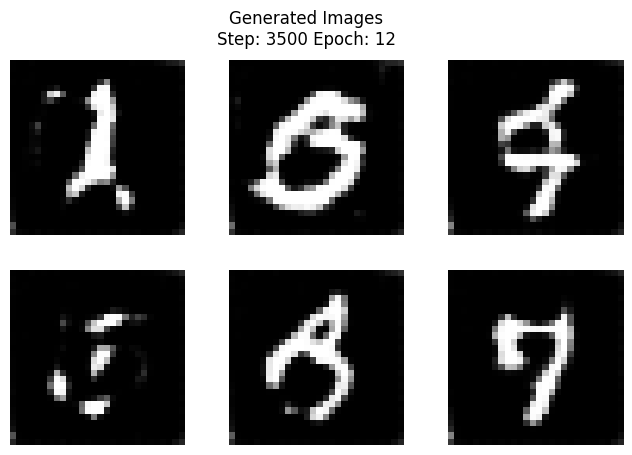

100%|██████████| 3750/3750 [03:10<00:00, 19.69it/s]


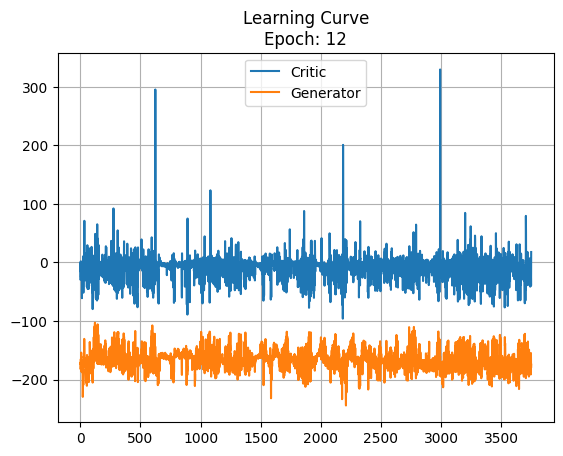

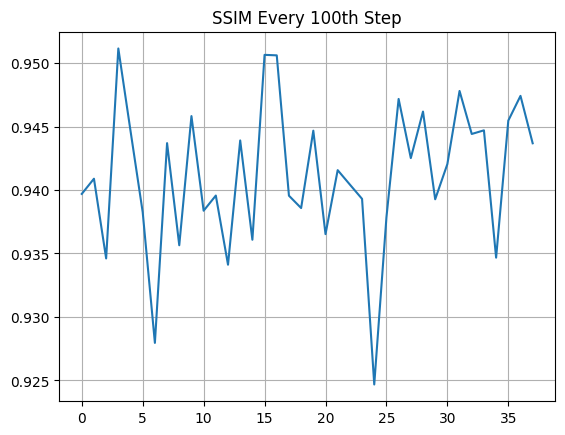

  0%|          | 0/3750 [00:00<?, ?it/s]

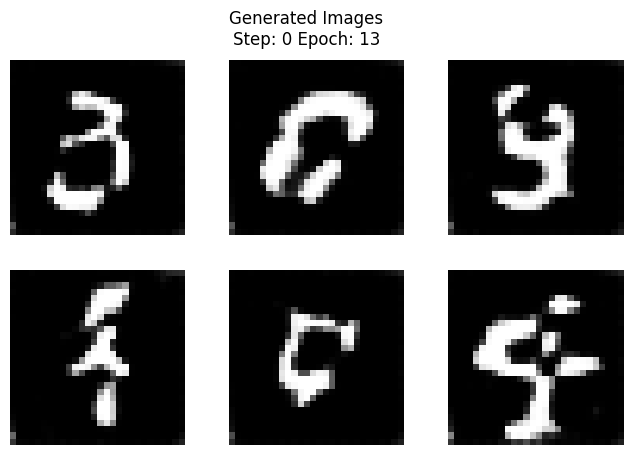

 13%|█▎        | 499/3750 [00:25<02:46, 19.53it/s]

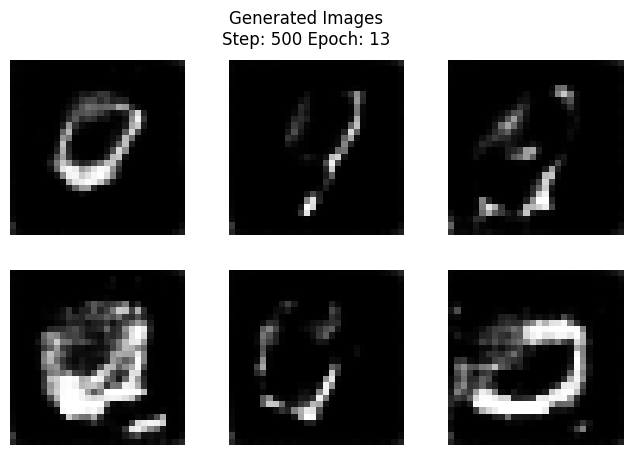

 27%|██▋       | 1000/3750 [00:51<02:11, 20.98it/s]

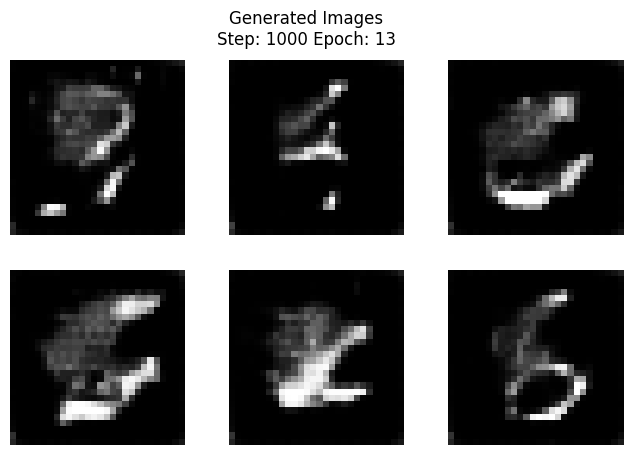

 40%|████      | 1500/3750 [01:17<01:48, 20.77it/s]

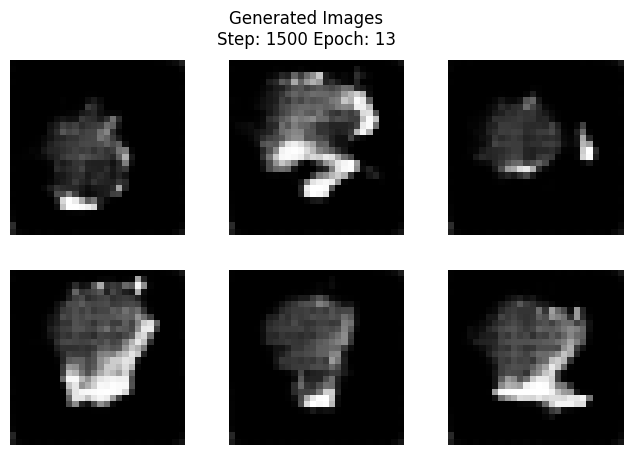

 53%|█████▎    | 2000/3750 [01:44<01:22, 21.11it/s]

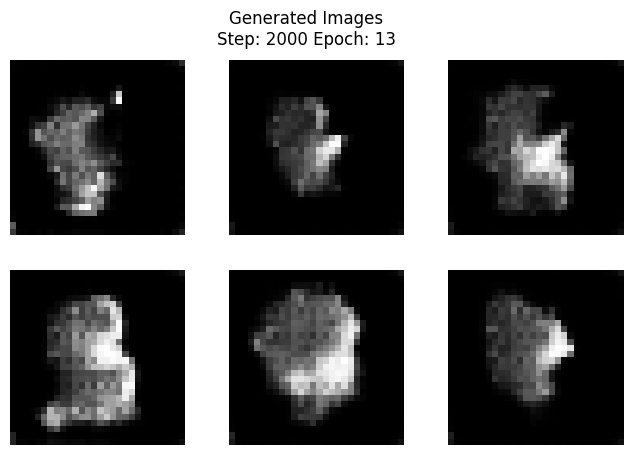

 67%|██████▋   | 2500/3750 [02:10<00:59, 20.84it/s]

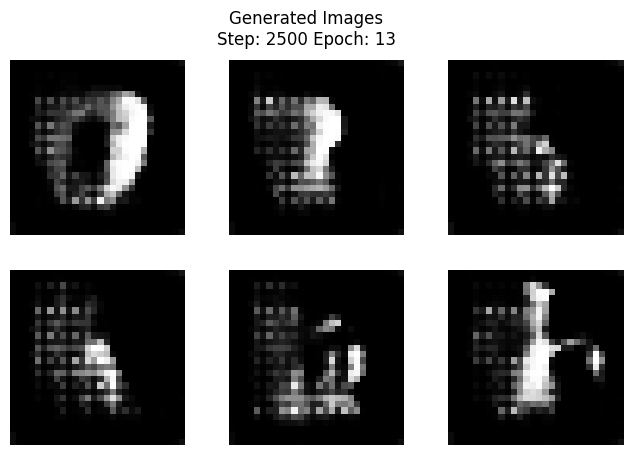

 80%|████████  | 3000/3750 [02:36<00:35, 20.98it/s]

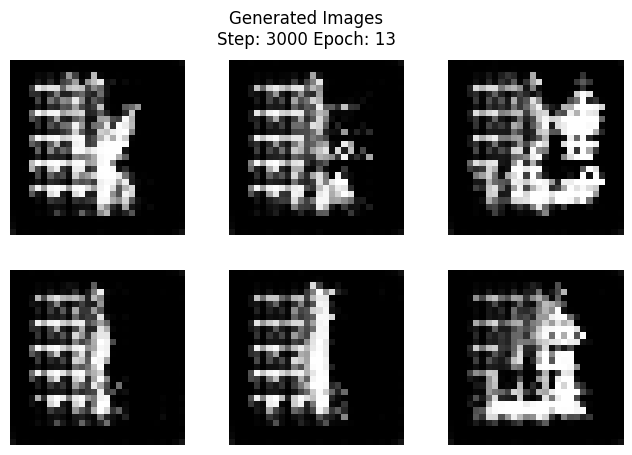

 93%|█████████▎| 3498/3750 [03:01<00:11, 21.18it/s]

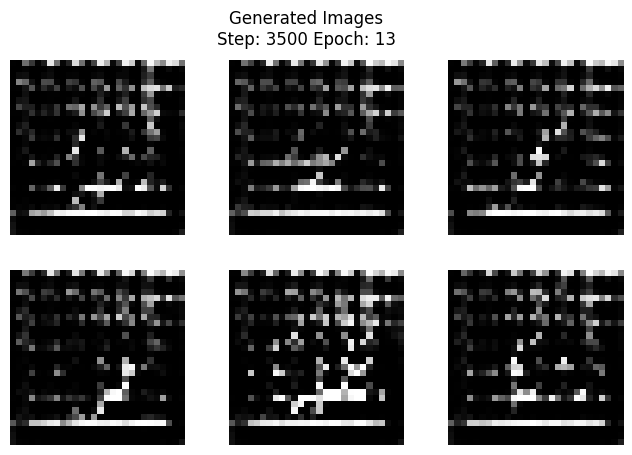

100%|██████████| 3750/3750 [03:15<00:00, 19.21it/s]


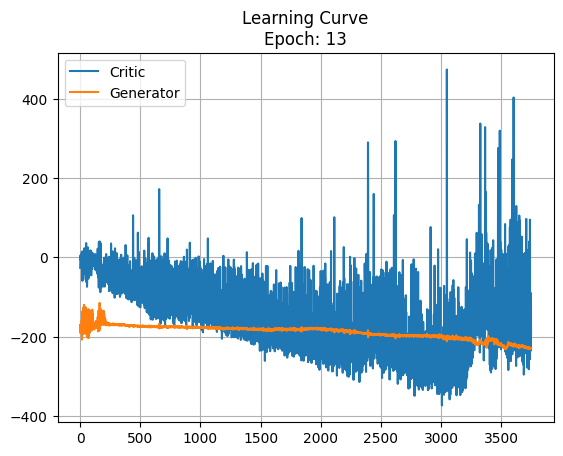

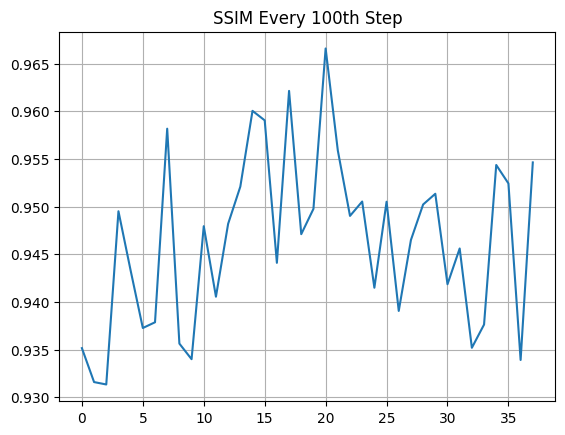

  0%|          | 0/3750 [00:00<?, ?it/s]

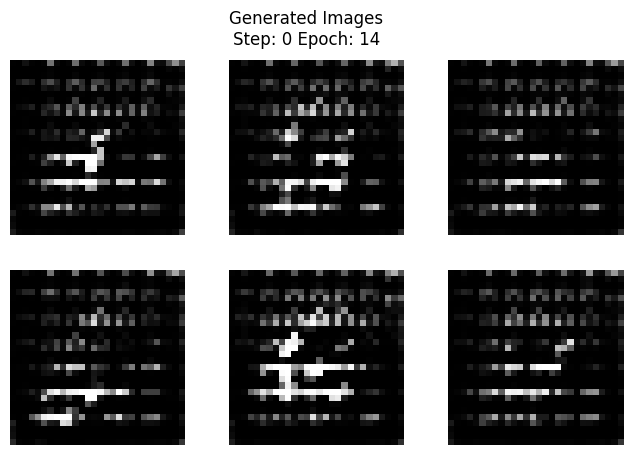

 13%|█▎        | 500/3750 [00:26<02:34, 21.02it/s]

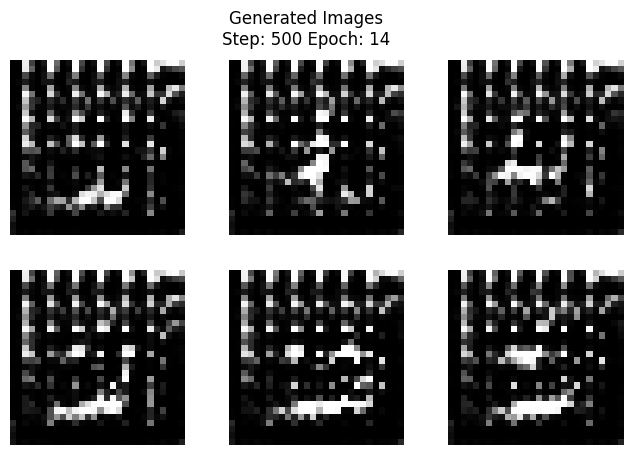

 27%|██▋       | 999/3750 [00:52<02:11, 20.91it/s]

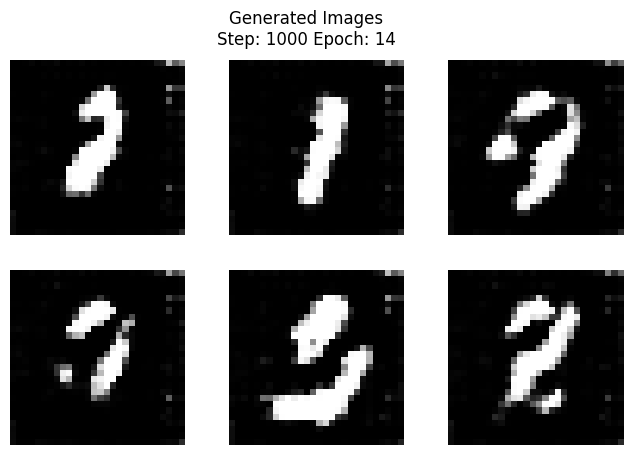

 40%|███▉      | 1499/3750 [01:18<01:47, 20.98it/s]

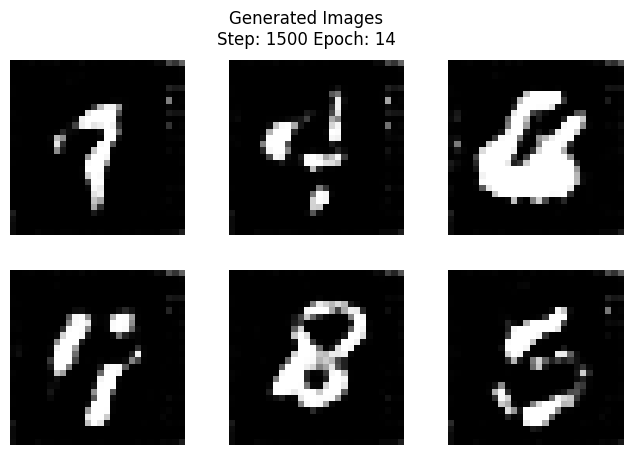

 53%|█████▎    | 1999/3750 [01:45<01:26, 20.27it/s]

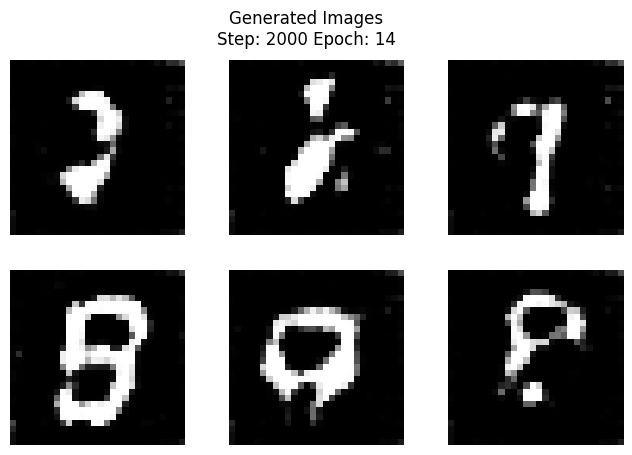

 67%|██████▋   | 2498/3750 [02:11<00:58, 21.55it/s]

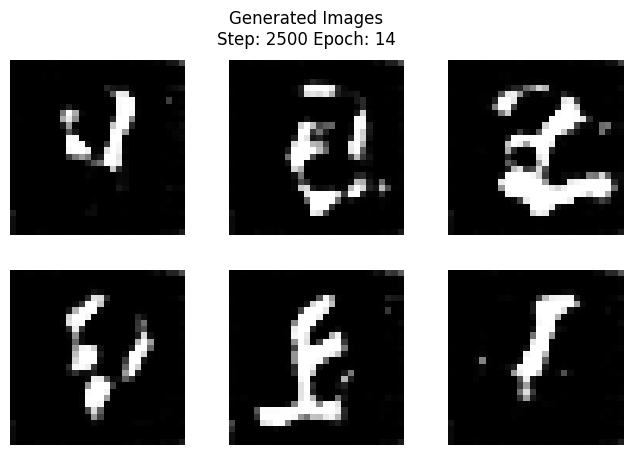

 80%|███████▉  | 2998/3750 [02:38<00:35, 21.10it/s]

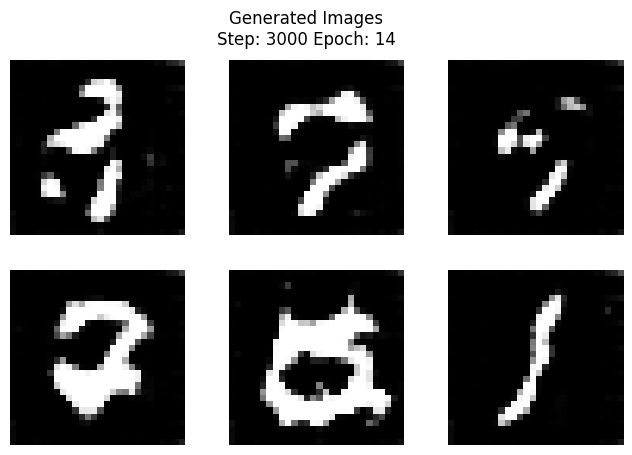

 93%|█████████▎| 3498/3750 [03:03<00:13, 19.32it/s]

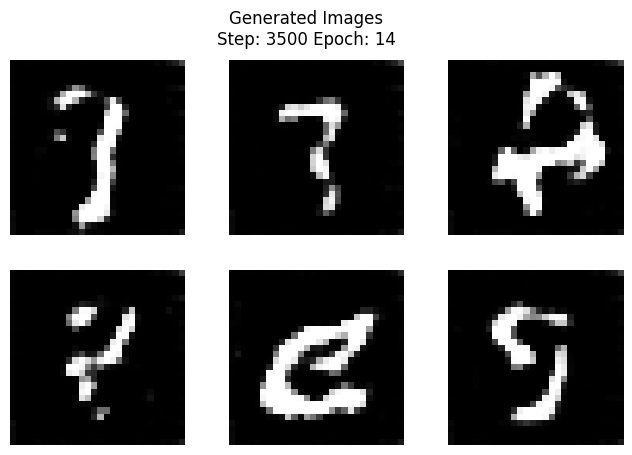

100%|██████████| 3750/3750 [03:17<00:00, 18.96it/s]


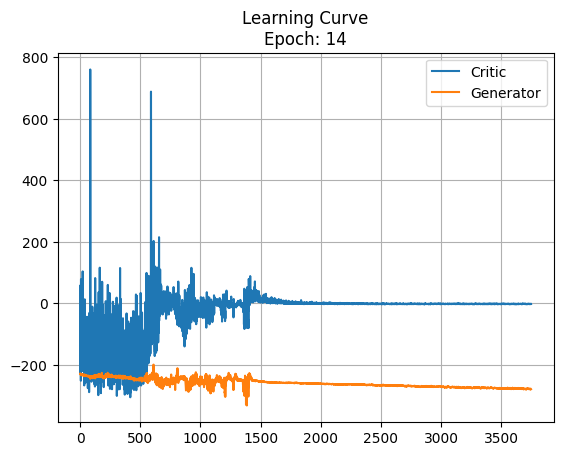

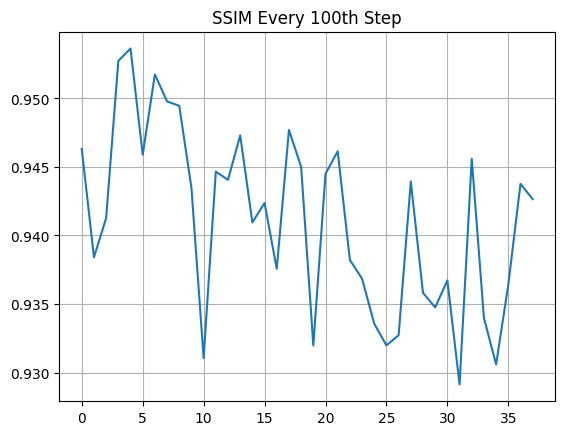

  0%|          | 0/3750 [00:00<?, ?it/s]

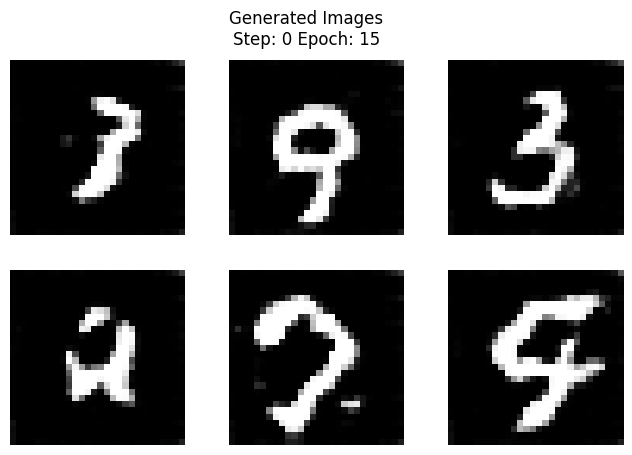

 13%|█▎        | 500/3750 [00:26<02:45, 19.63it/s]

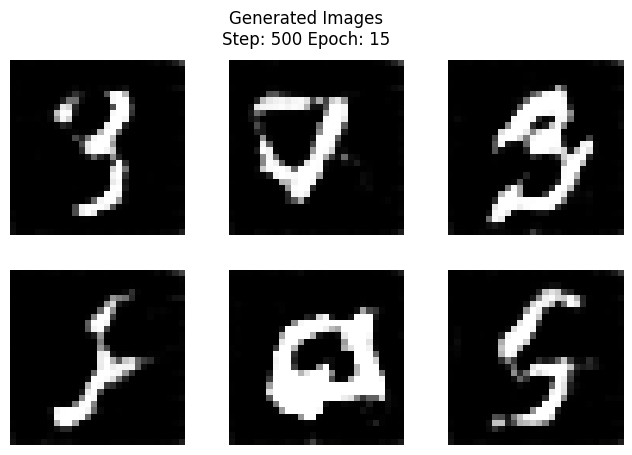

 27%|██▋       | 998/3750 [00:52<02:29, 18.40it/s]

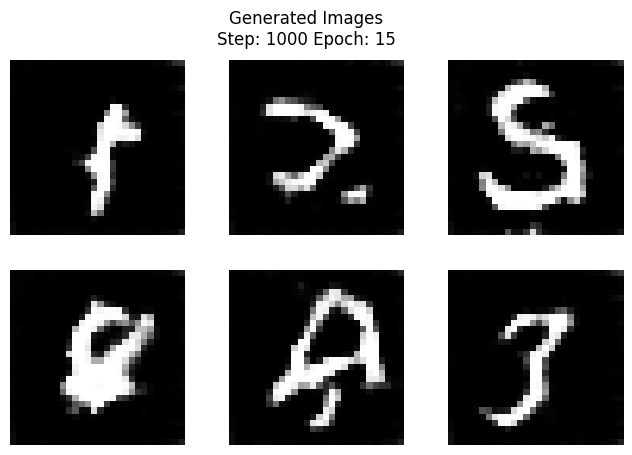

 40%|████      | 1500/3750 [01:18<02:25, 15.45it/s]

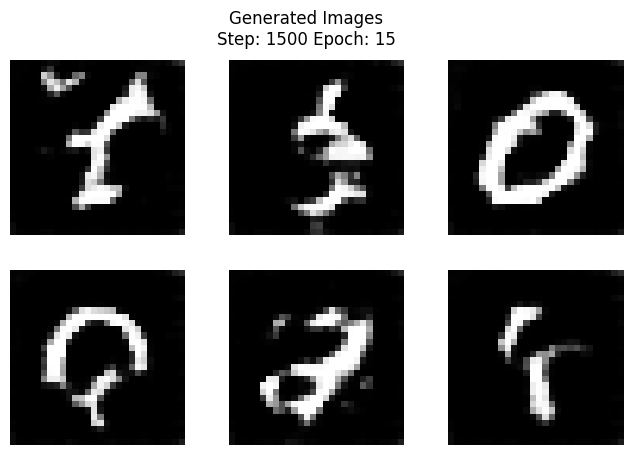

 53%|█████▎    | 2000/3750 [01:44<01:34, 18.49it/s]

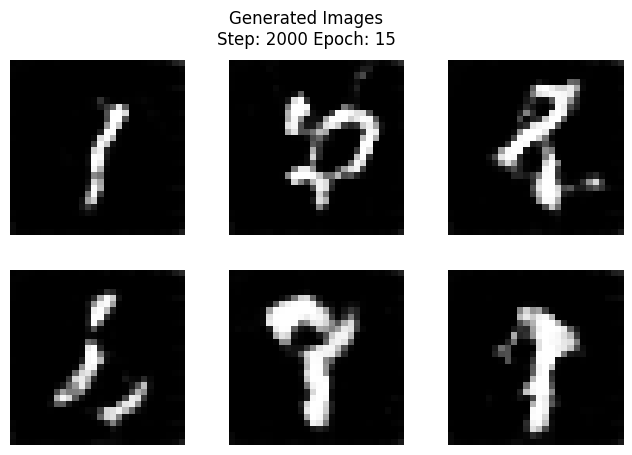

 67%|██████▋   | 2498/3750 [02:09<01:00, 20.68it/s]

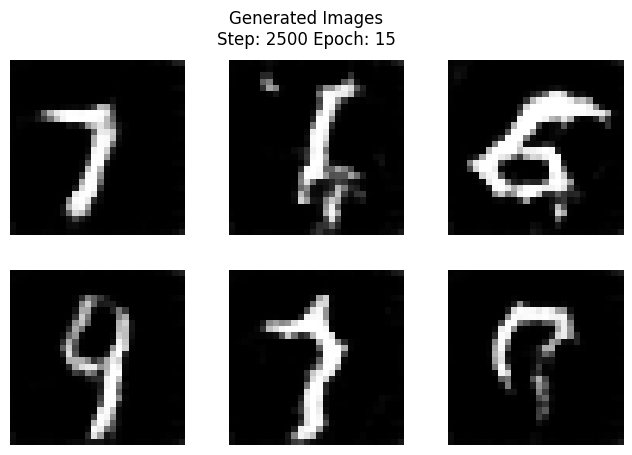

 80%|███████▉  | 2999/3750 [02:35<00:36, 20.67it/s]

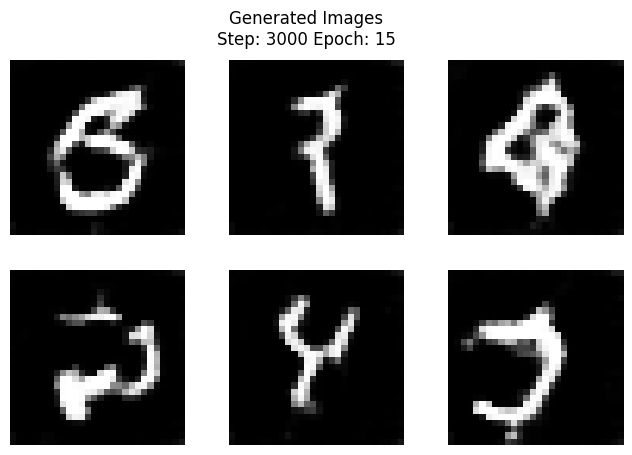

 93%|█████████▎| 3500/3750 [03:01<00:12, 19.32it/s]

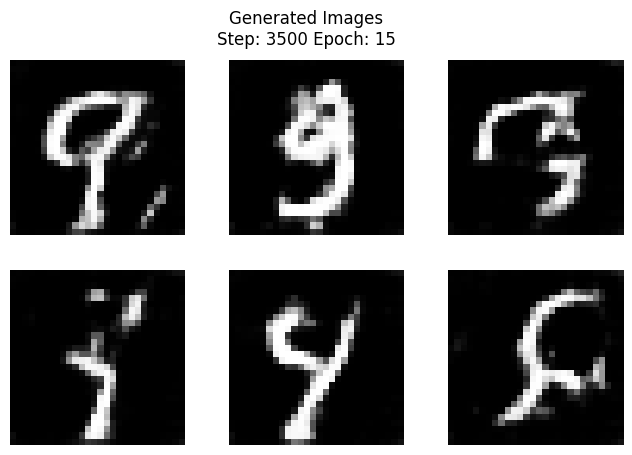

100%|██████████| 3750/3750 [03:14<00:00, 19.25it/s]


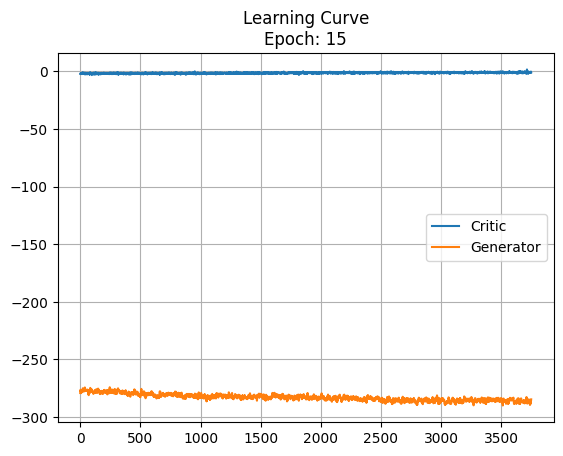

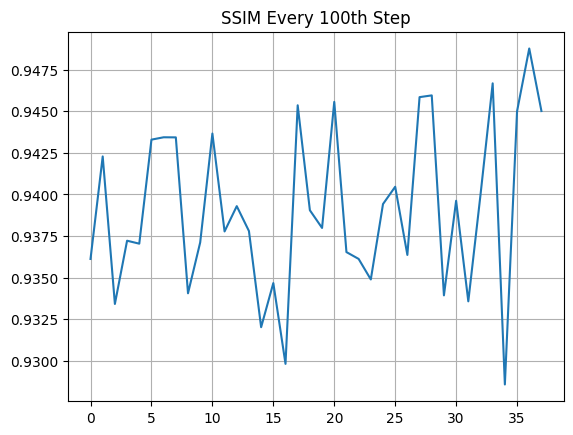

  0%|          | 0/3750 [00:00<?, ?it/s]

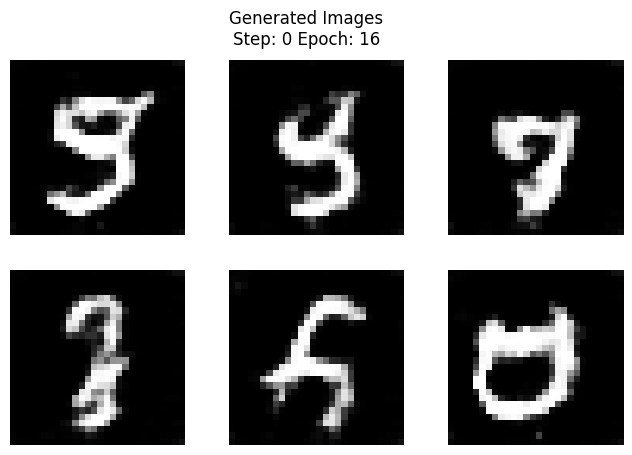

 13%|█▎        | 500/3750 [00:25<02:33, 21.18it/s]

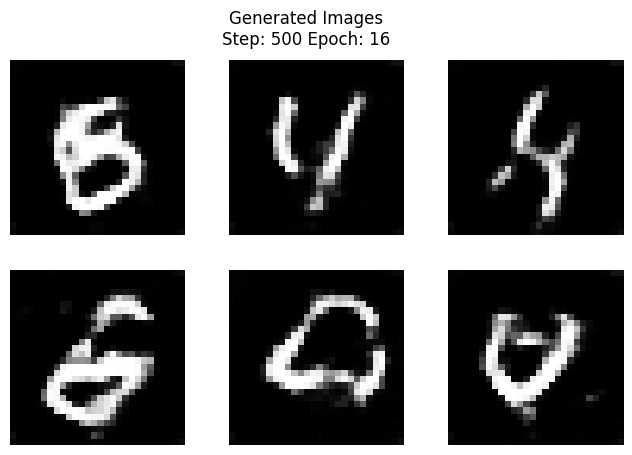

 27%|██▋       | 999/3750 [00:52<02:08, 21.46it/s]

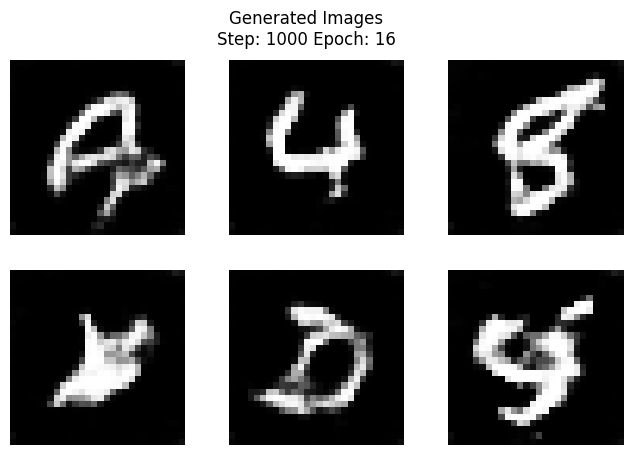

 40%|███▉      | 1499/3750 [01:18<01:47, 20.96it/s]

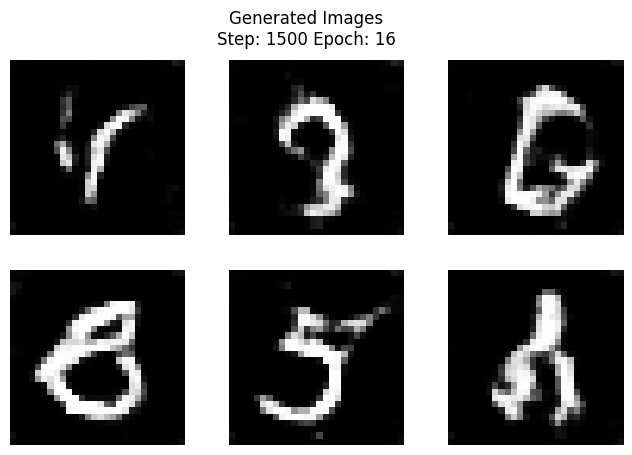

 53%|█████▎    | 1998/3750 [01:44<01:24, 20.69it/s]

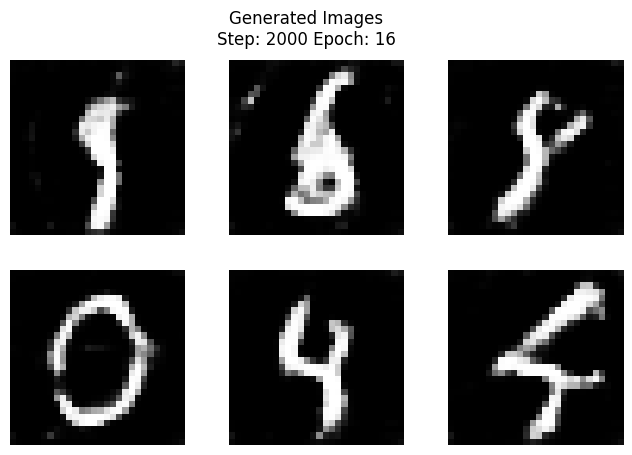

 67%|██████▋   | 2498/3750 [02:10<00:59, 21.19it/s]

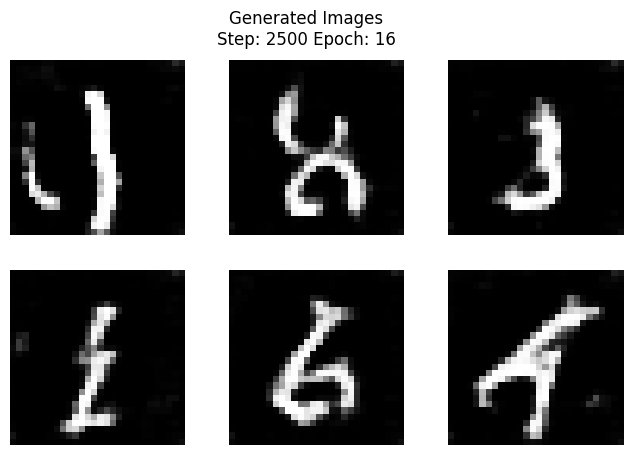

 80%|████████  | 3000/3750 [02:37<00:40, 18.71it/s]

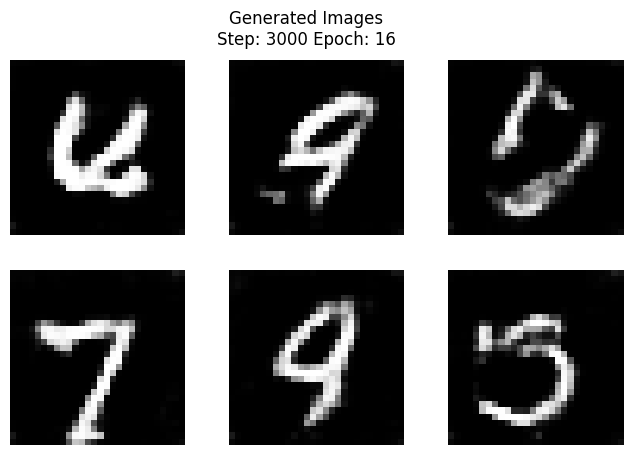

 93%|█████████▎| 3499/3750 [03:03<00:15, 16.38it/s]

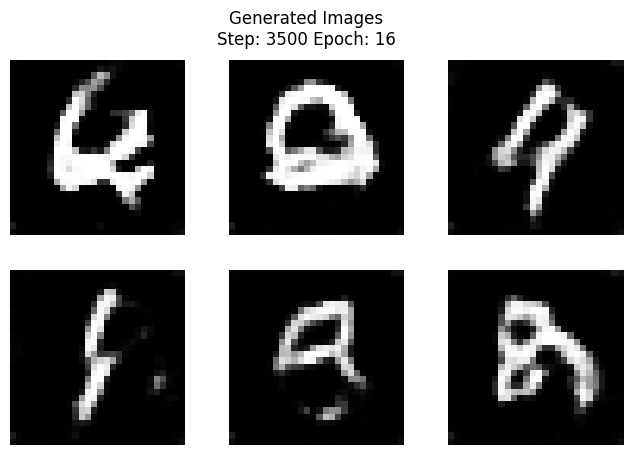

100%|██████████| 3750/3750 [03:16<00:00, 19.11it/s]


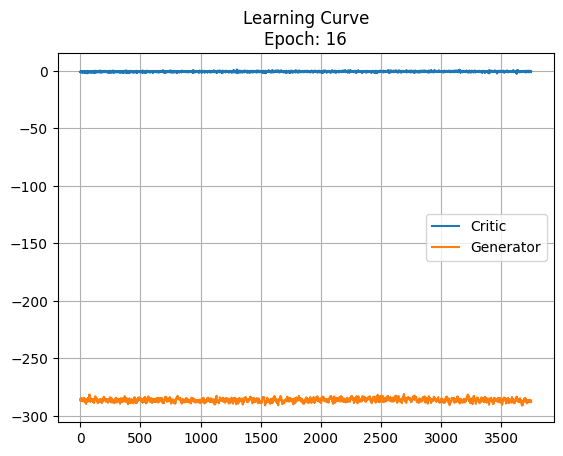

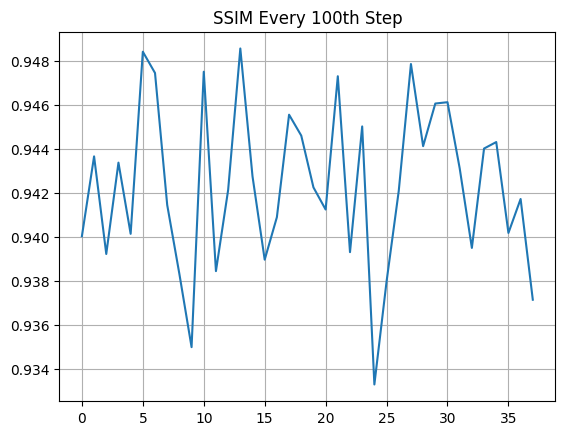

  0%|          | 0/3750 [00:00<?, ?it/s]

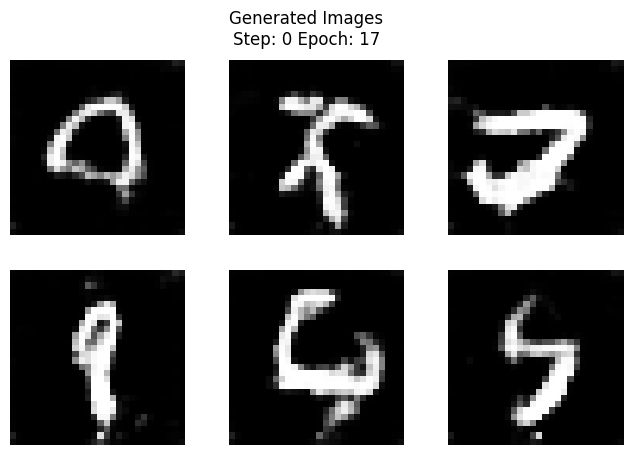

 13%|█▎        | 499/3750 [00:26<03:26, 15.75it/s]

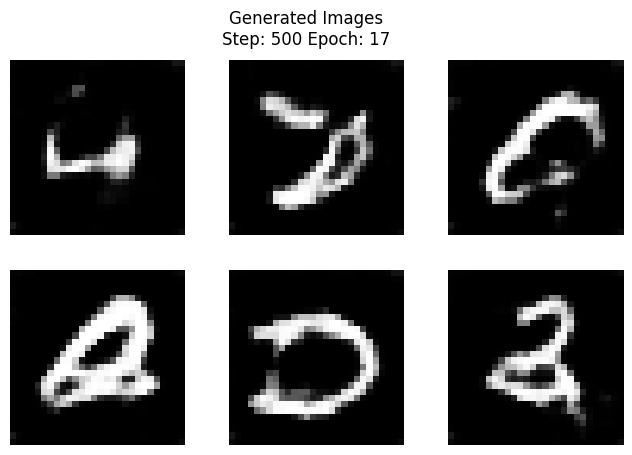

 27%|██▋       | 999/3750 [00:52<02:41, 16.99it/s]

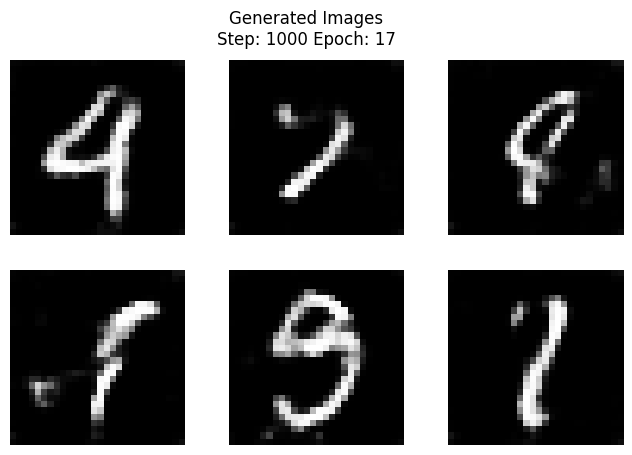

 40%|████      | 1500/3750 [01:18<02:12, 16.92it/s]

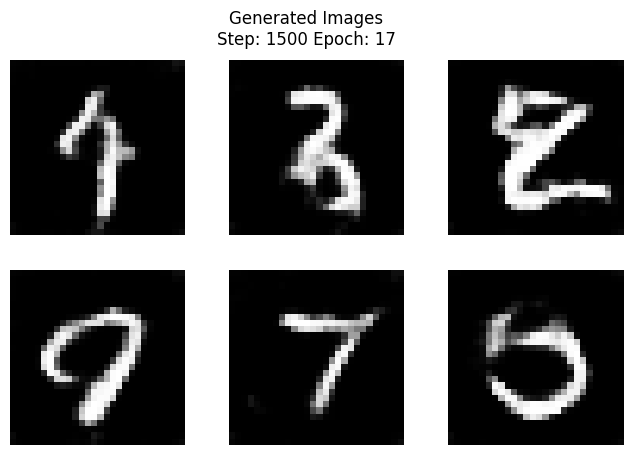

 53%|█████▎    | 2000/3750 [01:44<01:31, 19.10it/s]

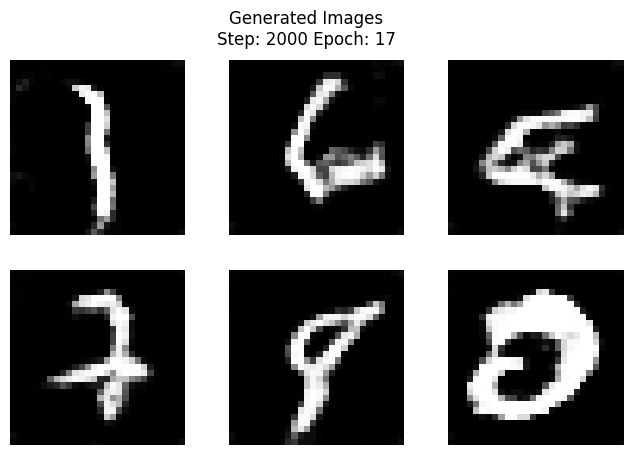

 67%|██████▋   | 2499/3750 [02:11<01:00, 20.84it/s]

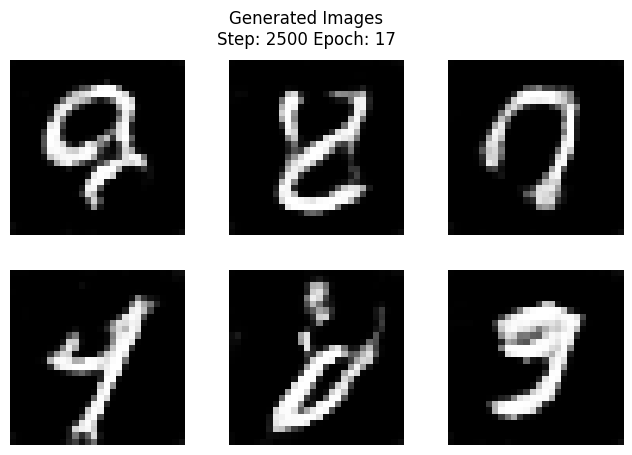

 80%|███████▉  | 2998/3750 [02:38<00:35, 21.01it/s]

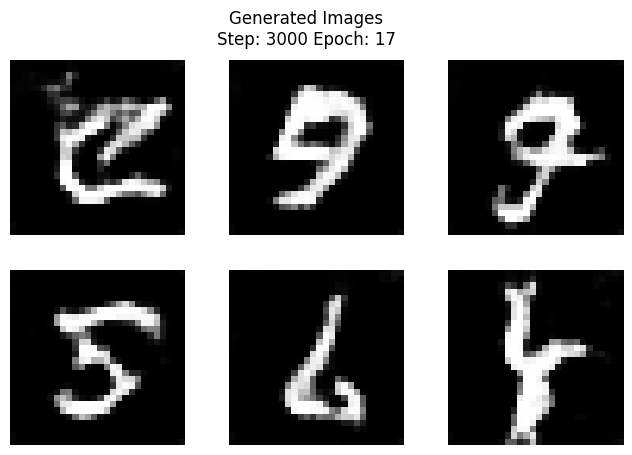

 93%|█████████▎| 3499/3750 [03:05<00:13, 18.20it/s]

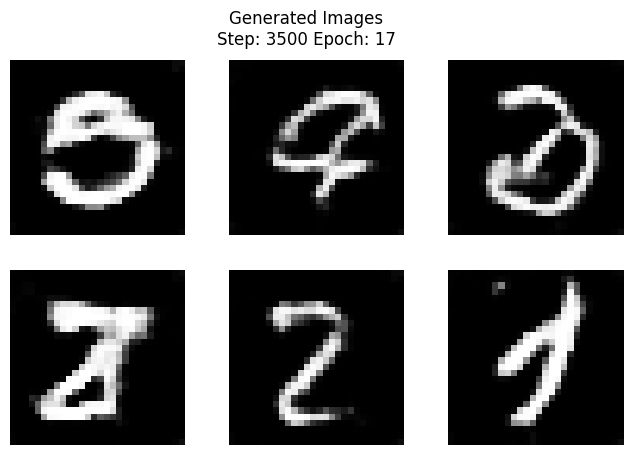

100%|██████████| 3750/3750 [03:19<00:00, 18.84it/s]


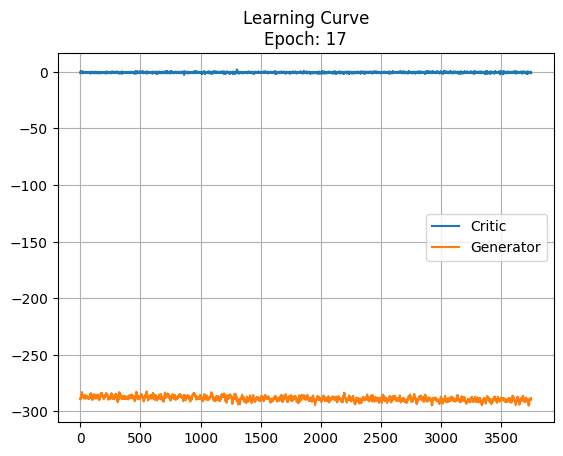

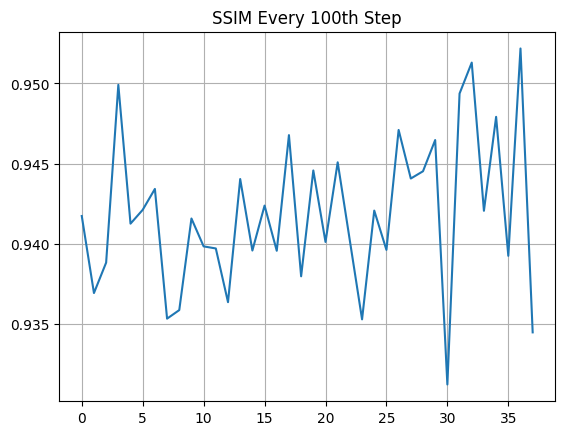

  0%|          | 0/3750 [00:00<?, ?it/s]

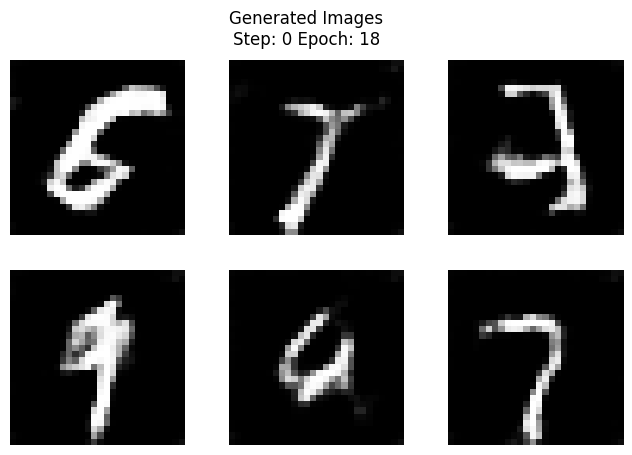

 13%|█▎        | 498/3750 [00:27<02:54, 18.58it/s]

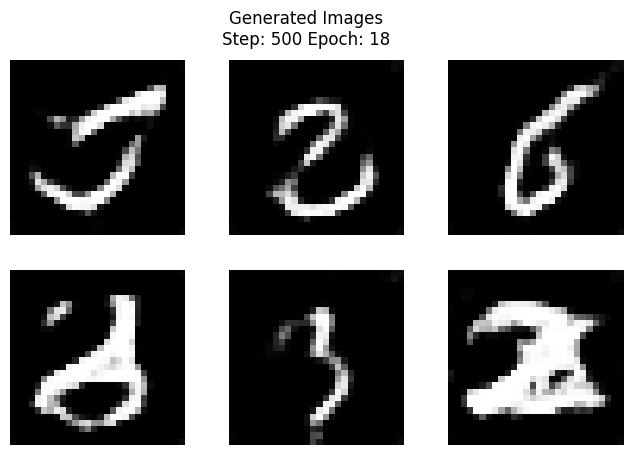

 27%|██▋       | 999/3750 [00:54<02:22, 19.32it/s]

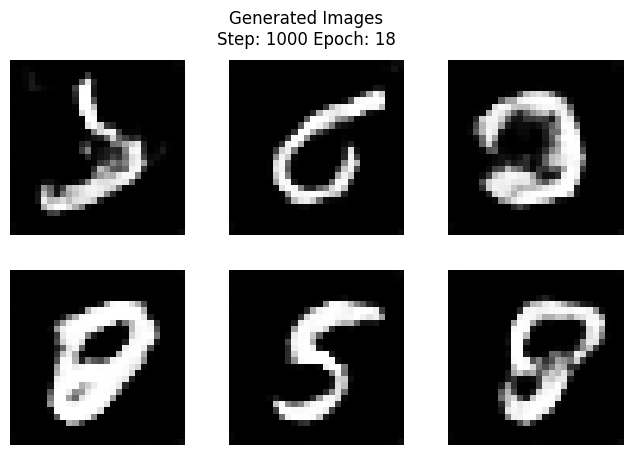

 40%|███▉      | 1498/3750 [01:20<01:47, 20.98it/s]

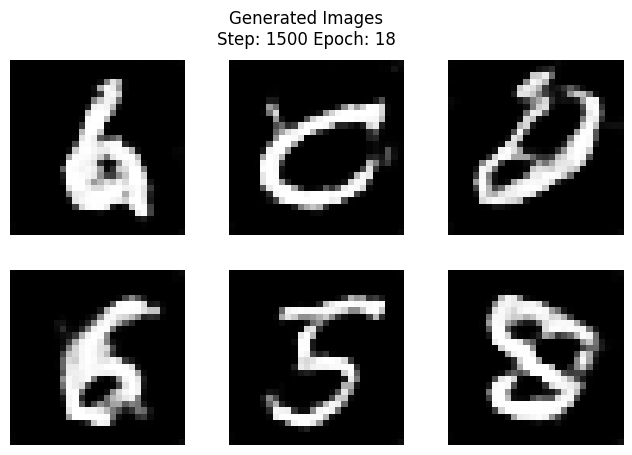

 53%|█████▎    | 1999/3750 [01:47<01:32, 18.97it/s]

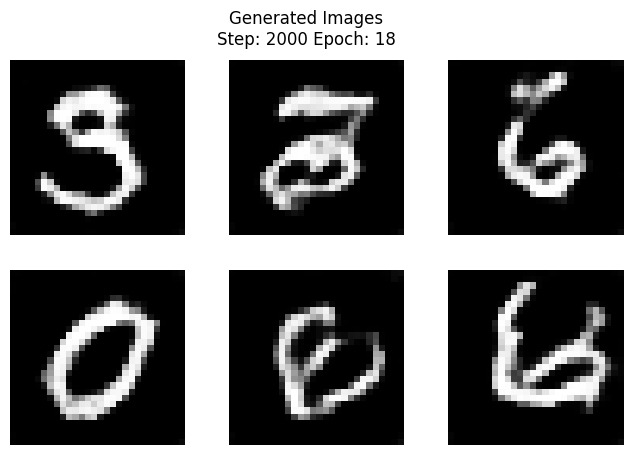

 67%|██████▋   | 2500/3750 [02:14<01:04, 19.47it/s]

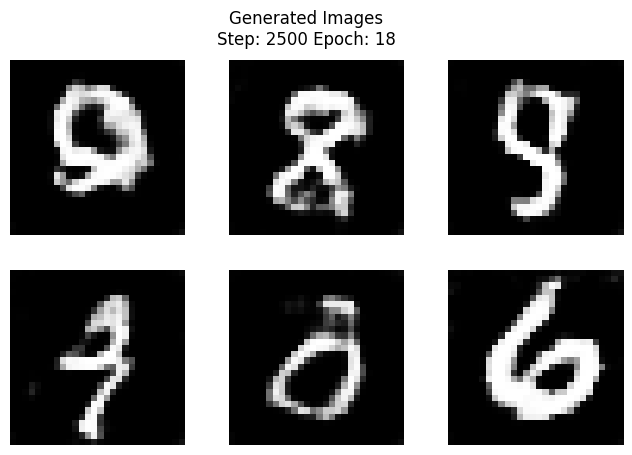

 80%|███████▉  | 2998/3750 [02:40<00:35, 20.90it/s]

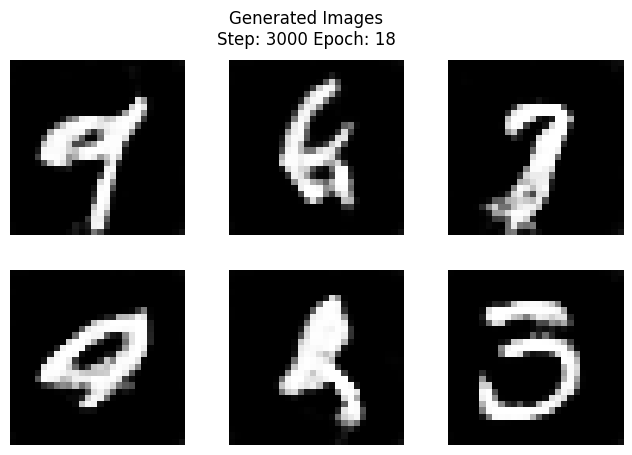

 93%|█████████▎| 3499/3750 [03:08<00:12, 19.32it/s]

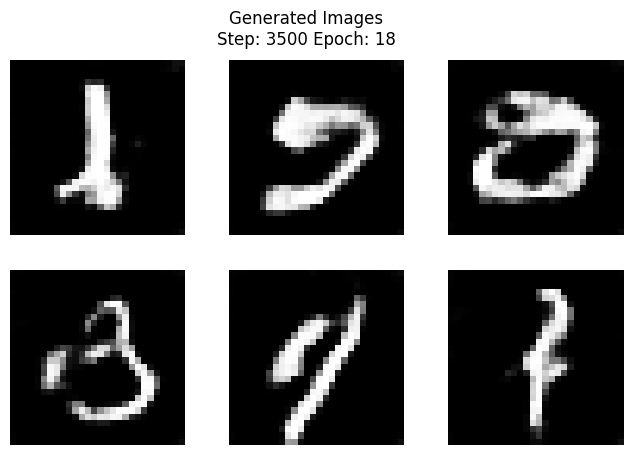

100%|██████████| 3750/3750 [03:21<00:00, 18.61it/s]


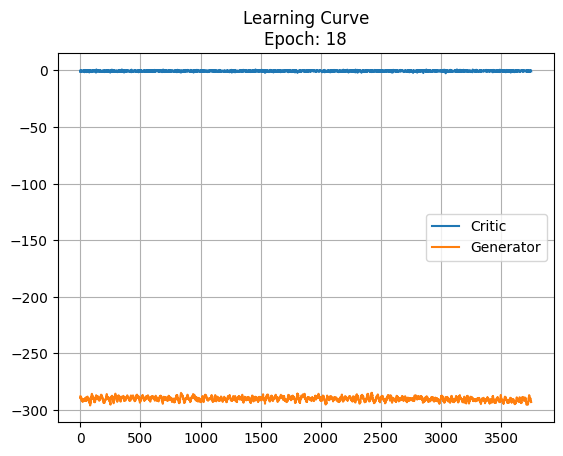

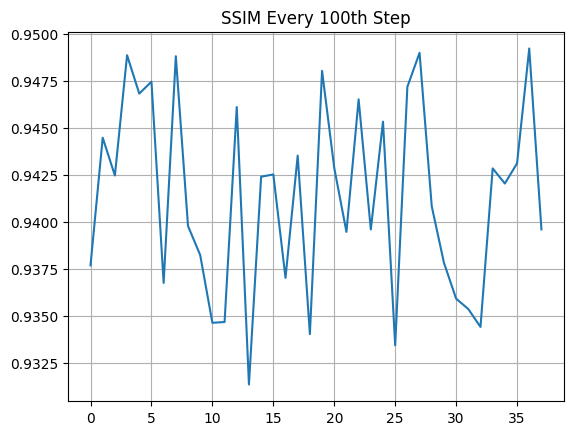

  0%|          | 0/3750 [00:00<?, ?it/s]

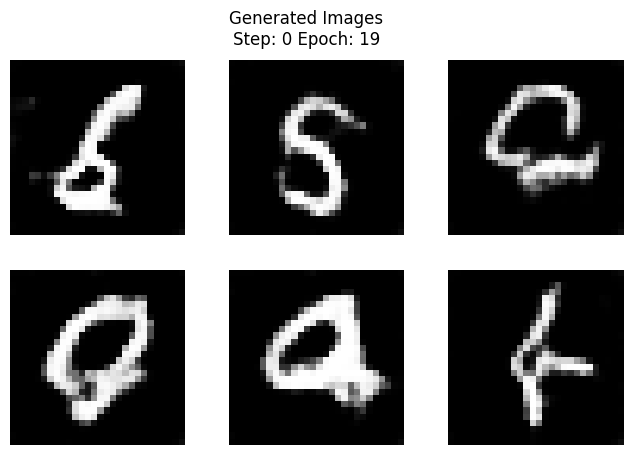

 13%|█▎        | 499/3750 [00:26<03:02, 17.79it/s]

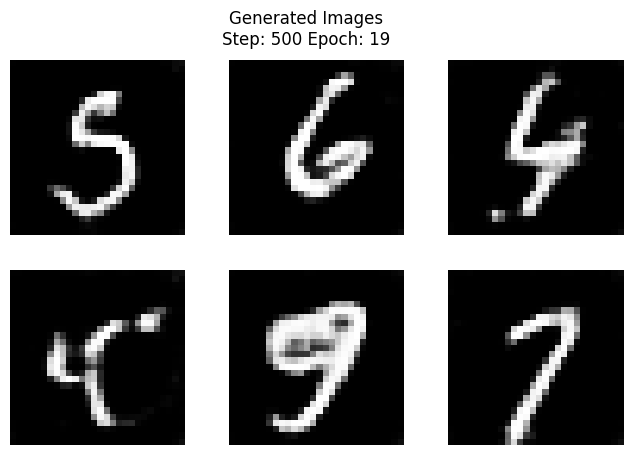

 27%|██▋       | 999/3750 [00:52<02:41, 17.07it/s]

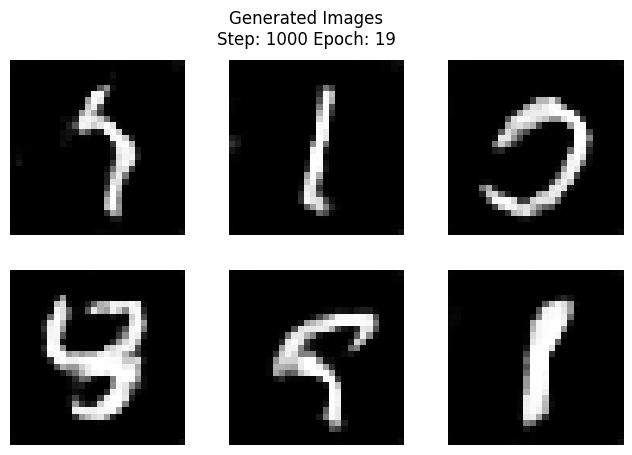

 40%|████      | 1500/3750 [01:18<02:31, 14.81it/s]

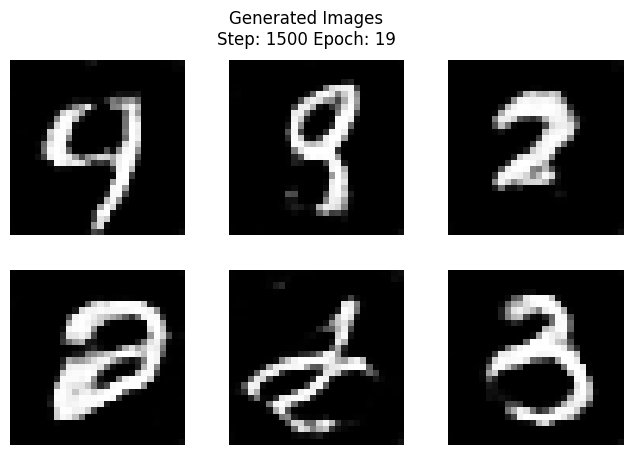

 53%|█████▎    | 2000/3750 [01:45<01:43, 16.84it/s]

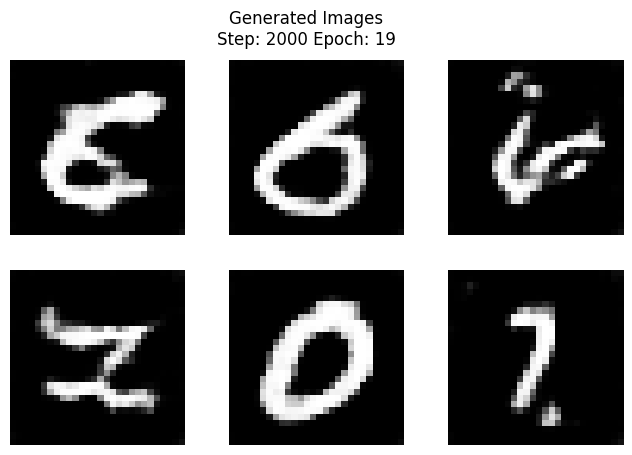

 67%|██████▋   | 2500/3750 [02:12<01:07, 18.43it/s]

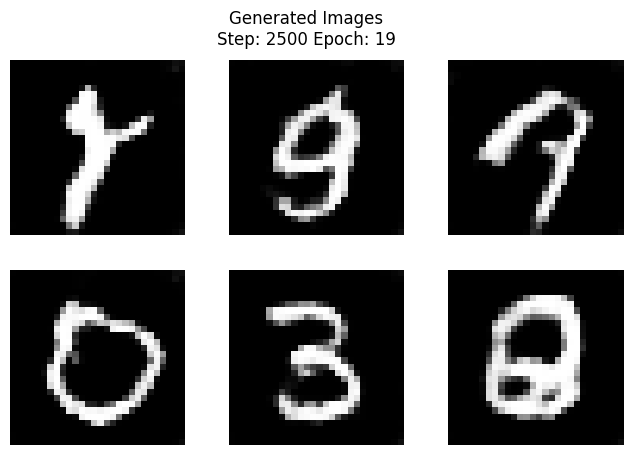

 80%|███████▉  | 2998/3750 [02:39<00:36, 20.53it/s]

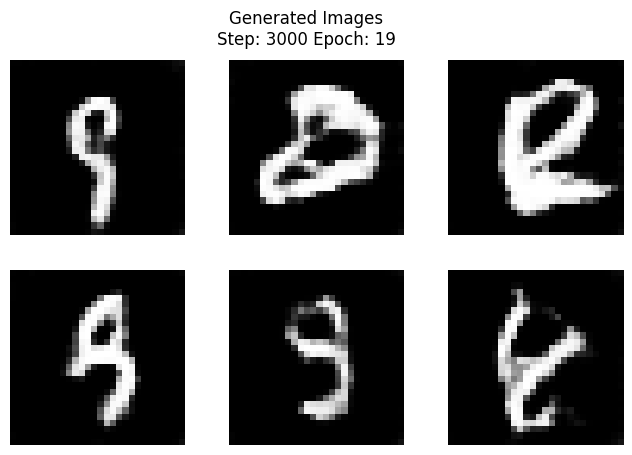

 93%|█████████▎| 3500/3750 [03:06<00:12, 20.62it/s]

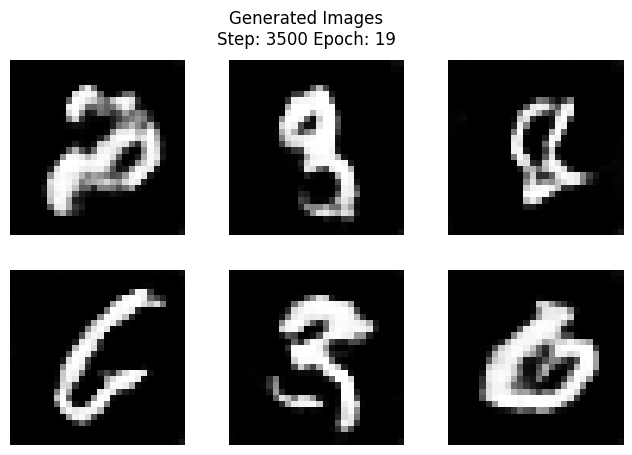

100%|██████████| 3750/3750 [03:20<00:00, 18.73it/s]


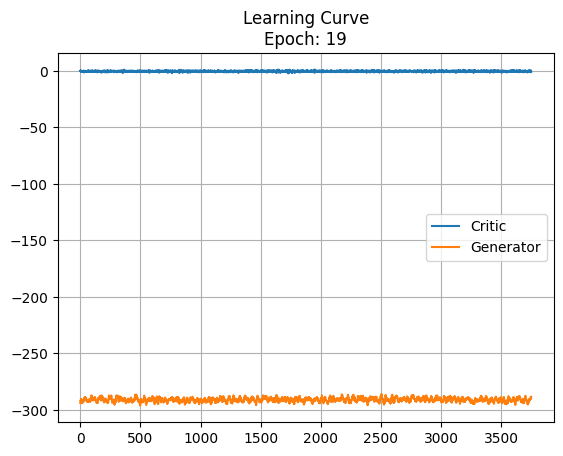

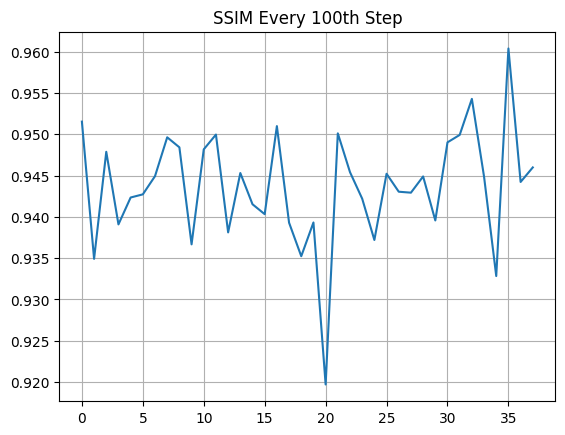

  0%|          | 0/3750 [00:00<?, ?it/s]

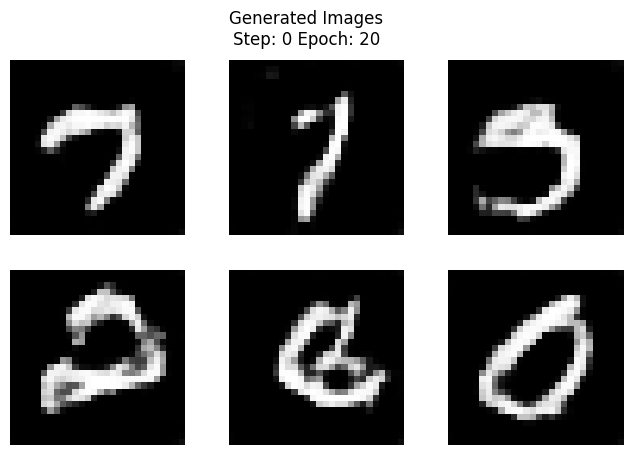

 13%|█▎        | 499/3750 [00:27<02:57, 18.32it/s]

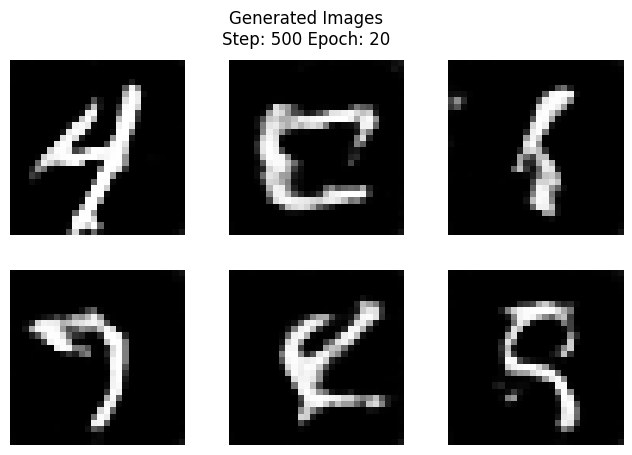

 27%|██▋       | 999/3750 [00:55<02:20, 19.62it/s]

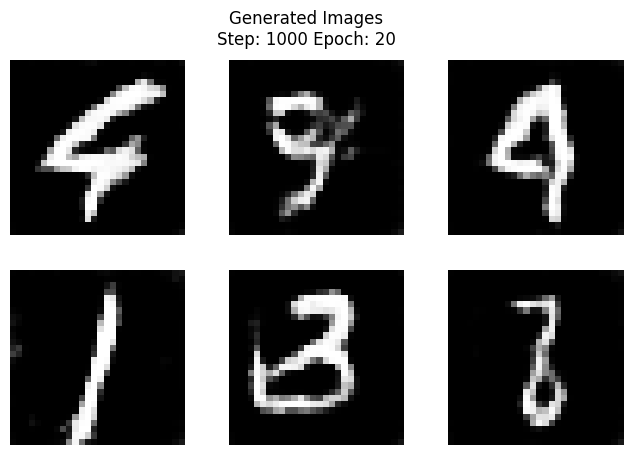

 40%|████      | 1500/3750 [01:24<02:09, 17.41it/s]

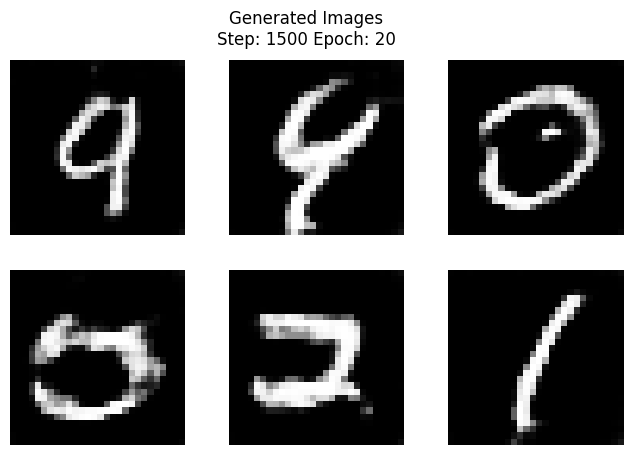

 53%|█████▎    | 1999/3750 [01:52<01:40, 17.34it/s]

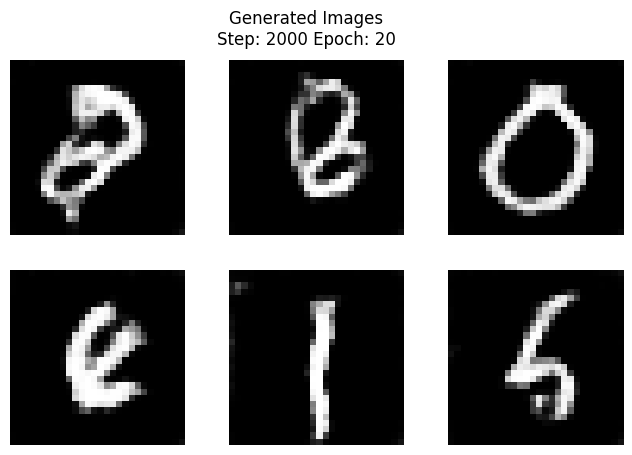

 67%|██████▋   | 2500/3750 [02:20<01:20, 15.44it/s]

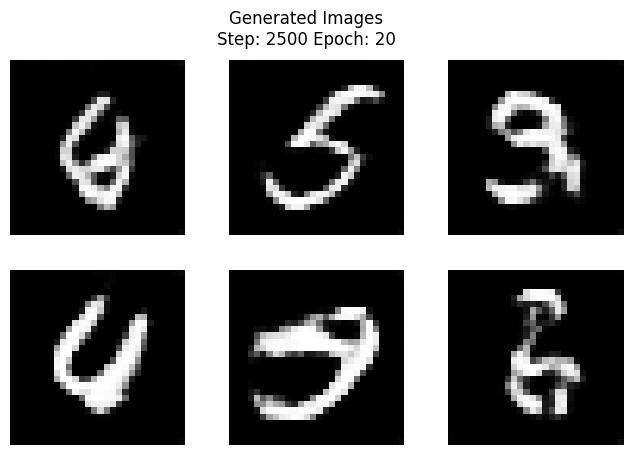

 80%|████████  | 3000/3750 [02:48<00:42, 17.46it/s]

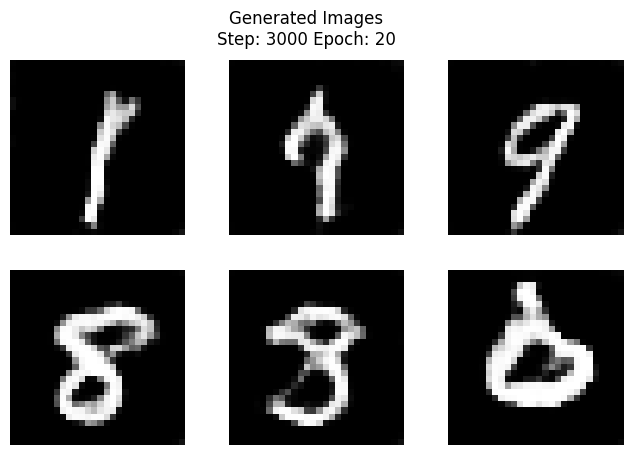

 93%|█████████▎| 3499/3750 [03:16<00:14, 17.16it/s]

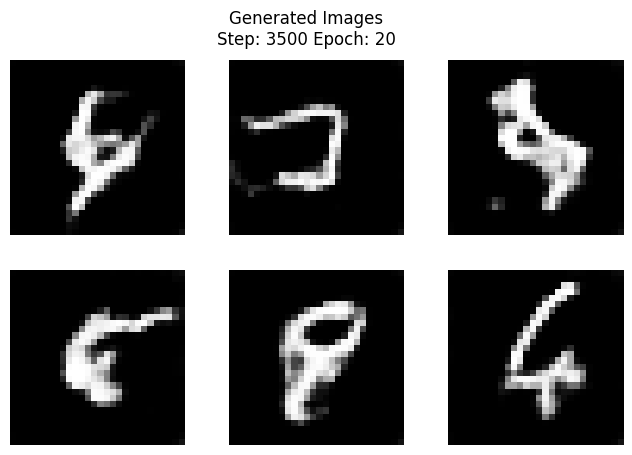

100%|██████████| 3750/3750 [03:31<00:00, 17.74it/s]


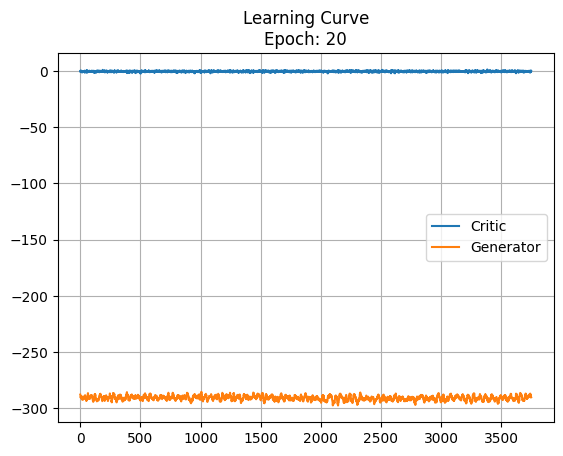

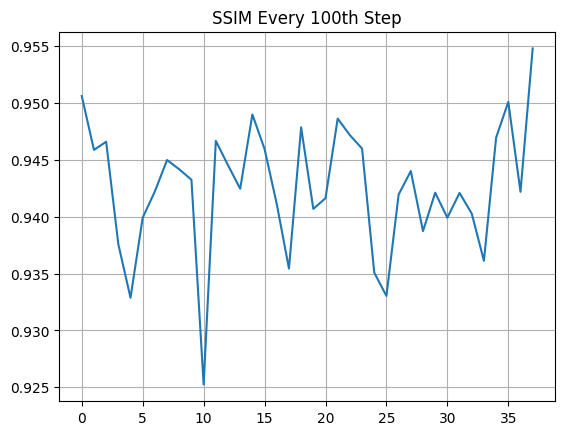

In [16]:
# Save Learning Curves
dir = './GANLearningCurve'
if not os.path.exists(dir):
    os.mkdir(dir)


# Start the training process
for epoch in range(1, EPOCHS+ 1):

    # Record Losses
    CRITIC_LOSSES = []
    GENERATOR_LOSSES = []
    SSIM_SCORES = []

    # Load the data.
    step = 0
    for real, _ in tqdm(dataloader):

        # Current step configurations
        curr_batch_size = len(real)
        real_images = real.to(DEVICE)

        mean_iter_critic_loss = 0

        for _ in range(CRITIC_STEPS):

            # Updating the critic
            critic_optim.zero_grad()

            fake_images = generator(generate_noise(curr_batch_size))
            critic_fake_preds = critic(fake_images.detach())
            critic_real_preds = critic(real_images)

            epsilon = torch.rand(curr_batch_size, 1, 1, 1, device=DEVICE, requires_grad=True)
            gp = gradient_penalty(extract_gradients(critic, real_images, fake_images.detach(), epsilon))

            critic_loss = compute_critic_loss(critic_fake_preds, critic_real_preds, gp, C_LAMBDA)

            mean_iter_critic_loss += critic_loss.item() / CRITIC_STEPS

            critic_loss.backward(retain_graph=True)
            critic_optim.step()

        CRITIC_LOSSES += [mean_iter_critic_loss]

        # Update the generator
        generator_optim.zero_grad()
        fake_images = generator(generate_noise(curr_batch_size))
        critic_fake_pred = critic(fake_images)

        generator_loss = compute_generator_loss(critic_fake_pred)
        generator_loss.backward()
        generator_optim.step()

        GENERATOR_LOSSES += [generator_loss.item()]

        if (step % 100 == 0):
            score = ssim(real_images.detach(), fake_images.detach())
            SSIM_SCORES.append(score.detach().cpu())

        if (step % DISPLAY_STEP == 0):

            noise = generate_noise(25)
            synthetic_images = generator(noise)

            show_generations(
                synthetic_images, 2, 3,
                figsize=(8, 5),
                title=f"Generated Images\nStep: {step} Epoch: {epoch}",
                save_loc = f"./GeneratorImages/Epoch_{epoch}/synthetic_image_{step}.png"
            )

        step += 1

    # Render Learning curve after every epoch
    plt.title(f"Learning Curve\nEpoch: {epoch}")
    plt.plot(CRITIC_LOSSES, label='Critic')
    plt.plot(GENERATOR_LOSSES, label='Generator')
    plt.grid()
    plt.legend()
    plt.savefig(f"./{dir}/LC_Epoch{epoch}.png")
    plt.show()

    plt.title("SSIM Every 100th Step")
    plt.plot(SSIM_SCORES)
    plt.grid()
    plt.savefig(f"./{dir}/SSIM_Score_{epoch}.png")
    plt.show()

Looking at the similarity score began clearly see that even for such a bad model, the similarity score wins at Max 20 .96 which is around 96%. So we can consider it as a benchmark that if the moral progress is and its is a quality improves, then its ssi score should, on average, go above 95 at least.

In [17]:
# # Used in colab to download learning curves and other images
# !zip -r ./GeneratorImages.zip ./GeneratorImages
# !zip -r ./GANLearningCurve.zip ./GANLearningCurve

  adding: GeneratorImages/ (stored 0%)

  adding: GeneratorImages/Epoch_6/ (stored 0%)

  adding: GeneratorImages/Epoch_6/synthetic_image_3000.png (deflated 18%)

  adding: GeneratorImages/Epoch_6/synthetic_image_1000.png (deflated 18%)

  adding: GeneratorImages/Epoch_6/synthetic_image_1500.png (deflated 18%)

  adding: GeneratorImages/Epoch_6/synthetic_image_500.png (deflated 18%)

  adding: GeneratorImages/Epoch_6/synthetic_image_2500.png (deflated 18%)

  adding: GeneratorImages/Epoch_6/synthetic_image_0.png (deflated 18%)

  adding: GeneratorImages/Epoch_6/synthetic_image_2000.png (deflated 18%)

  adding: GeneratorImages/Epoch_6/synthetic_image_3500.png (deflated 17%)

  adding: GeneratorImages/Epoch_9/ (stored 0%)

  adding: GeneratorImages/Epoch_9/synthetic_image_3000.png (deflated 19%)

  adding: GeneratorImages/Epoch_9/synthetic_image_1000.png (deflated 20%)

  adding: GeneratorImages/Epoch_9/synthetic_image_1500.png (deflated 20%)

  adding: GeneratorImages/Epoch_9/synthetic

# **Training Curves (Deep Talk) 🔍**

I've transformed **the generations** from each epoch into **GIFs**, facilitating a **straightforward visual assessment and enabling us to swiftly evaluate the progression**.

In [26]:
# Only for Google Colab
# !unzip /content/TrainingGIFs.zip

**Epoch 1 & 2:**

1. At the outset of the training in epoch 1, the model starts its learning journey, gradually attempting to discern the image generation process. Initially, it shows some success by comprehending the need for white pixels in the central area and black pixels around the corners. However, an unexpected shift occurs in epoch 2, around 2000 epoch steps, where the model suddenly produces slightly flawed images, with scattered white pixels.

2. Nevertheless, as epoch 2 nears its conclusion, approximately at 3500 steps, there's a noticeable effort by the model to revert to its original learning trajectory, focusing on improvement after the temporary setback. This signifies a transient deviation followed by a reorientation toward learning and progress.

In [28]:
from IPython.display import Image

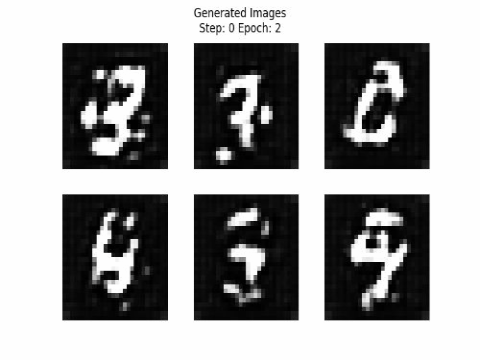

In [30]:
# Epoch 2nd Model Generations
Image("/content/TrainingGIFs/Epoch_02.gif")

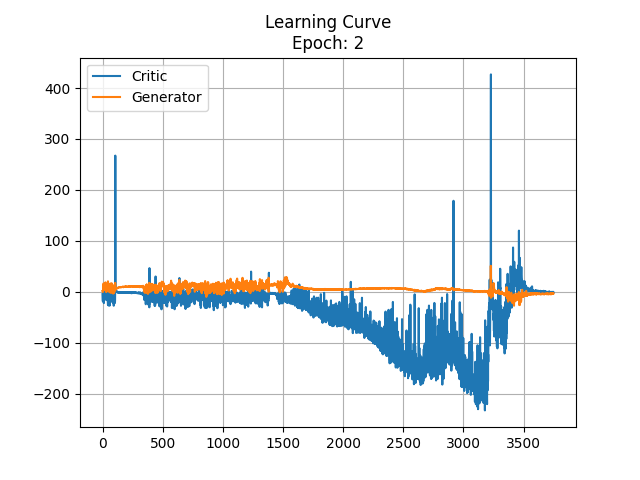

In [34]:
Image("./GANLearningCurve/LC_Epoch2.png")

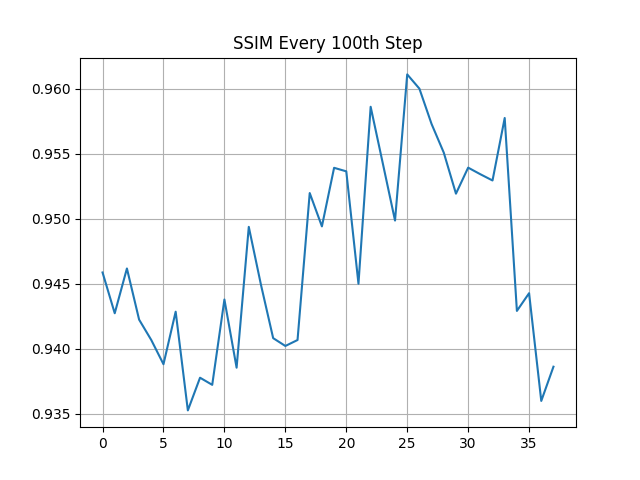

In [35]:
Image("./GANLearningCurve/SSIM_Score_2.png")

The learning curves for this epoch indeed echo the observed fluctuations in model performance. Analyzing the curves reveals a downward trend in the critic's loss compared to that of the generator, indicating a deterioration in the critic's discriminatory ability, subsequently impacting the generator's performance.

A similar pattern is discernible in the SSIM score plot. Initially, the score remains low as the model grapples with learning. A slight increase suggests progress in learning, followed by a sudden decline towards the end, underscoring the model's decline in performance as the epoch concludes. These trends underscore the intricate relationship between the critic's efficacy, the generator's output, and the model's overall competence throughout the epoch.

---
**Epochs 3-7**:

1. Between epochs 3 and 7, there was a remarkable leap in the model's comprehension of the required image generation. Notably, it exhibited an understanding of contextual information and attempted to depict numerical patterns, notably visible in the generated GIFs.

2. This positive stride showcased the model's endeavor to grasp context, resulting in the production of decent images. However, despite this commendable progress, the generated images remained noticeably unrealistic upon human inspection. While the model demonstrated strides in contextual inference, achieving complete realism remained an ongoing challenge during this period.

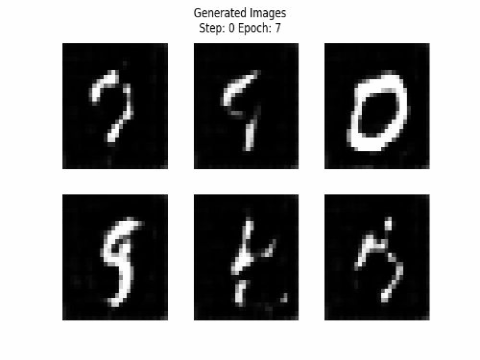

In [37]:
Image("/content/TrainingGIFs/Epoch_07.gif")

---

Epoch 8:

1. In the early phase of epoch 8, a notable observation in the learning curve is the significant oscillations in the critic's loss, evident from step 0 to step 2000. This pattern aligns with the slender oscillations seen in the generator loss.

2. These fluctuations directly manifest in the model's generations during this phase, visibly deteriorating compared to previous stages. However, employing the gradient penalty and the introduced W loss successfully mitigates this over-oscillations, restoring the loss to a more stable range.

3. This corrective action reflects in the model generations, swiftly reverting them to their initial, more favorable state. Notably, the model exhibits a deeper understanding of the contextual nuances it needs to generate.

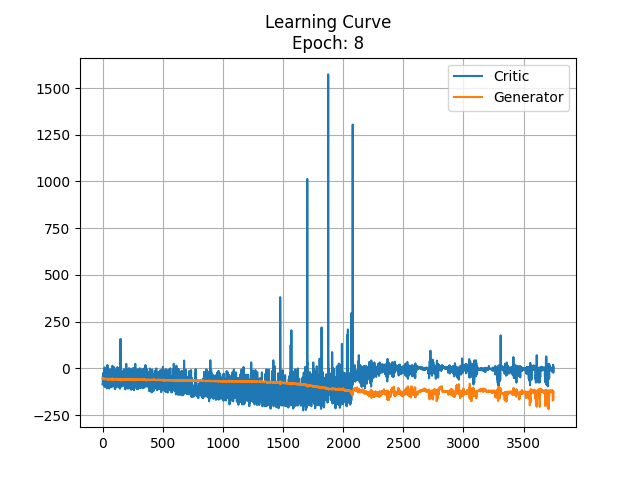

In [40]:
Image("./GANLearningCurve/LC_Epoch8.png")

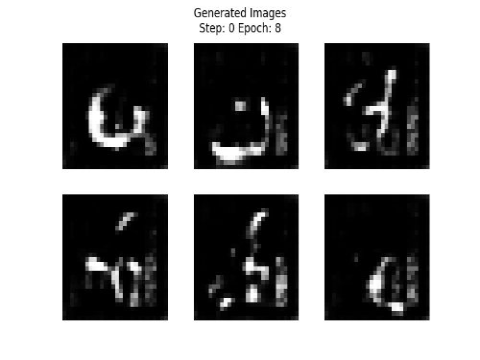

In [41]:
Image("/content/TrainingGIFs/Epoch_08.gif")

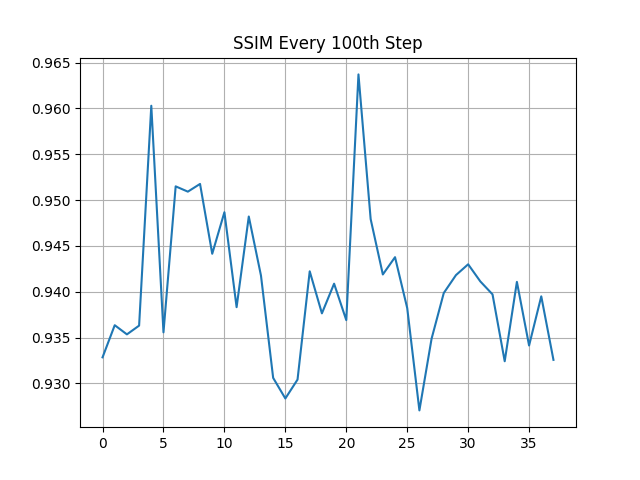

In [42]:
Image("./GANLearningCurve/SSIM_Score_8.png")

In the SSIM scores of epoch 8, the initial phase doesn't distinctly portray performance deterioration. However, a clear trend emerges where the model's performance abruptly drops below 0.93 before sharply surging beyond 0.96.

This aligns perfectly with both the observed learning curve trends and the patterns in image generations. Initially, the model struggles to generate high-quality images, followed by a sudden surge in producing exceptionally good ones.

Towards the epoch's end, the model's generations once again exhibit signs of deterioration. The SSIM scores effectively mirror these fluctuations, providing a coherent depiction of the model's varying performance throughout the epoch.

---

**Epoch 10 - 12:**

In this phase, there's a discernible improvement in the model's generations, albeit slight. However, it's increasingly apparent that the model is gradually losing its grasp on contextual information. This loss becomes particularly conspicuous by epoch 13, reflecting a noticeable decline in the model's ability to retain and reproduce contextual details in its generated outputs.

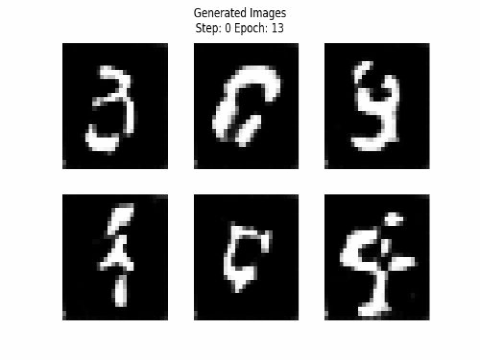

In [43]:
Image("/content/TrainingGIFs/Epoch_13.gif")

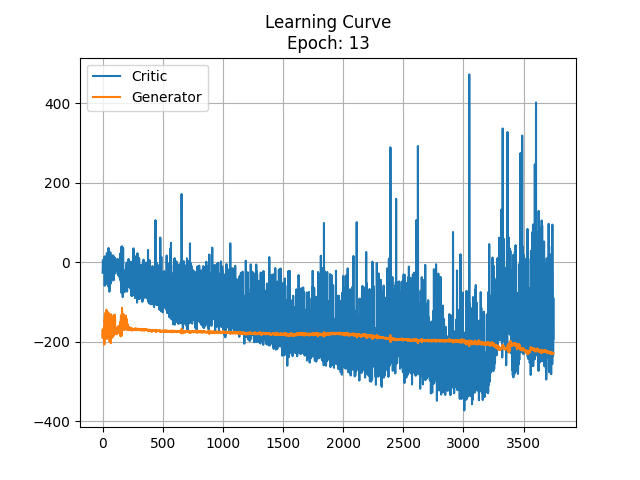

In [45]:
Image("./GANLearningCurve/LC_Epoch13.png")

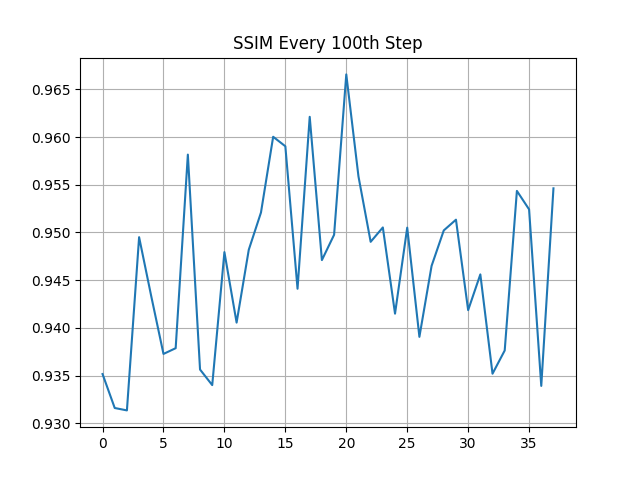

In [44]:
Image("./GANLearningCurve/SSIM_Score_13.png")

The drastic decline in image quality evident at epoch 13 is starkly reflected in the learning curve. The curve distinctly showcases a surge in the critic's loss, characterized by pronounced over-oscillations and notably larger fluctuations. This heightened critic loss serves as a clear indicator of the considerable degradation observed in the model's performance during this epoch.

---

**Rest Epochs**

Undoubtedly, the model's performance took a severe hit during the 13th epoch, displaying notably poor quality. However, it showcased a remarkable recovery thereafter. By the culmination of epoch 20, the model's performance notably improved compared to its earlier stages. Despite these advancements, there remains a necessity for extensive hyperparameter tuning or refinement in the training methodology. The generated outputs at epoch 20, while improved, still lack the level of realism necessary to deceive the human eye convincingly.


---

**My thoughts:**

Absolutely, the training journey of generative adversarial networks vividly illustrates the challenges encountered in their optimization. The instability witnessed in gradients, their substantial fluctuations, and the concurrent oscillations across various metrics underscore these complexities. However, amidst these fluctuations, the efficacy of the introduced gradient penalty and the discriminator loss shines through. Despite encountering substantial fluctuations, the gradient penalty adeptly steered the generator back to its initial state, yielding more acceptable generations. Nonetheless, the model's journey involves delving deeper into the hyperspace of image representations—a notably intricate task. Despite its complexities, this model exhibits promising strides, hinting at a potential future as one of the premier models in this domain.

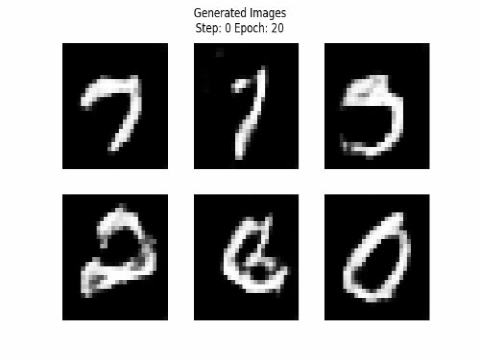

In [46]:
Image("/content/TrainingGIFs/Epoch_20.gif")

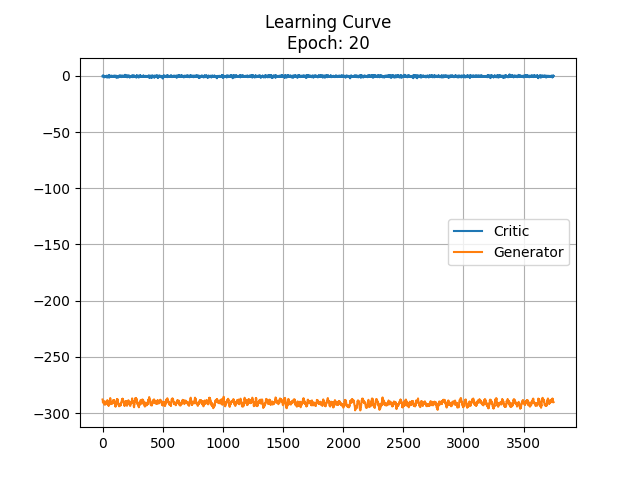

In [47]:
Image("./GANLearningCurve/LC_Epoch20.png")

# **Final Model Generations 🖌️**

At this stage our **GAN** is trained, and now it's ready to **generate realistic synthetic images** and **fascinate us with its generations**. So let's have a look at the **generations after the training.**

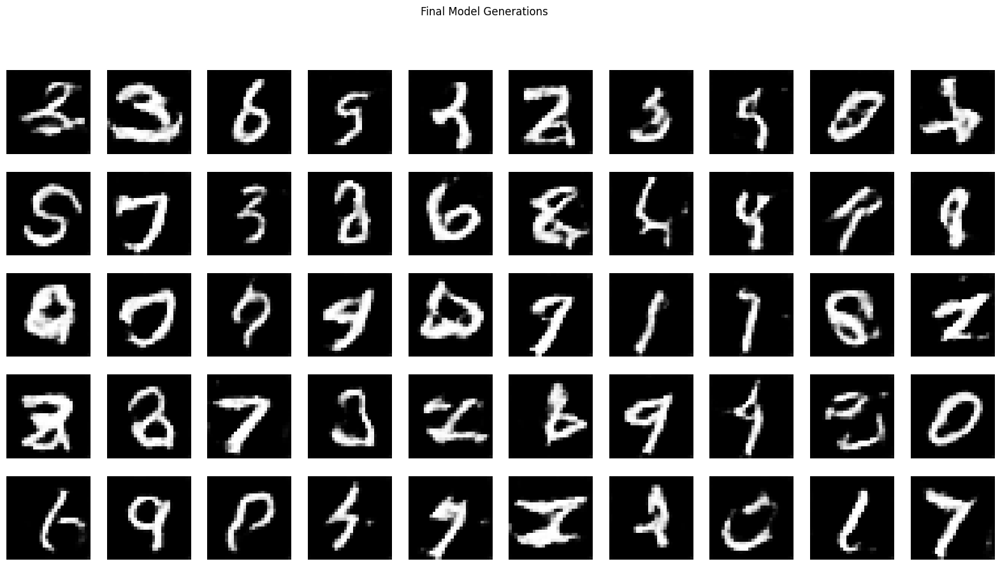

In [18]:
# Generate Images
noise = generate_noise(50)
syn_images = generator(noise)

# Show Generated Images
show_generations(
    syn_images, 5, 10,
    figsize=(20, 10),
    title="Final Model Generations",
    save_loc = "./FinalGenerations.png"
)

Despite training the model for **20 epochs**, its **inadequacy became evident due to the glaring instability** within the **GAN framework**. This **instability was noticeable**, evident in the **final generations**.

Despite this, there were **glimpses of remarkable accuracy** in **certain generated images**, such as **the class 9, 1, and 7 representations**. While these images exhibited **astonishing realism**, it's crucial to note that the **model's overall performance remains subpar**.

The root cause lies in the **acknowledged instability during training.** While acknowledging the **commendable aspects**, it's imperative to **recognize the necessity for extensive hyperparameter tuning** to achieve **significantly improved results**.

# **SSIM Similarity Score 💯**

In [19]:
ssim_scores = []
for batch in range(10):
    # Generate Images
    real_images, _ = next(iter(dataloader))
    noise = generate_noise(len(real_images))
    syn_images = generator(noise).detach().cpu()

    # Compute Similarity score
    score = ssim(real_images, syn_images)
    print(f"Batch : {batch+1:2} Similarity Score: {score}")

    ssim_scores.append(score)

print(f"Mean SSIM Score: {np.mean(ssim_scores)}")

Batch :  1 Similarity Score: 0.944259762763977

Batch :  2 Similarity Score: 0.942093014717102

Batch :  3 Similarity Score: 0.9436646699905396

Batch :  4 Similarity Score: 0.9427172541618347

Batch :  5 Similarity Score: 0.9397215843200684

Batch :  6 Similarity Score: 0.9401799440383911

Batch :  7 Similarity Score: 0.9418734908103943

Batch :  8 Similarity Score: 0.9292681217193604

Batch :  9 Similarity Score: 0.9438578486442566

Batch : 10 Similarity Score: 0.948222279548645


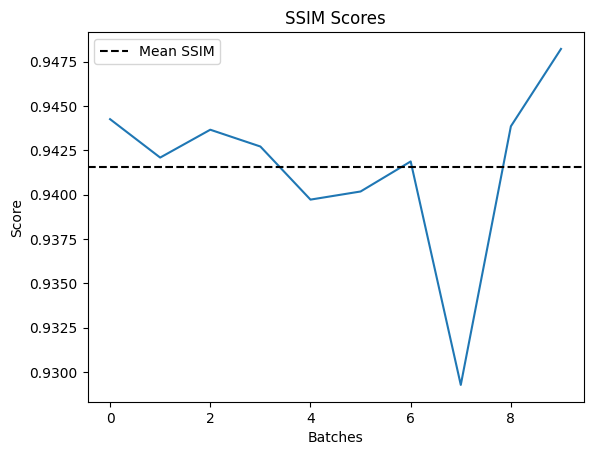

In [20]:
plt.title("SSIM Scores")
plt.plot(ssim_scores)
plt.axhline(np.mean(ssim_scores), linestyle="--", label="Mean SSIM", color='black')
plt.xlabel("Batches")
plt.ylabel("Score")
plt.legend()
plt.show()

The **Structural Similarity Index (SSIM),** a metric **representing similarity**, indicates a **rather subpar performance**. It oscillates around **0.94**, signifying adequacy but **falling short of excellence**.

Considering these are **straightforward digit generations**, achieving an **average SSIM score of 0.94 remains unimpressive**.

# **Summary 📔**

1. **Environment Setup and Introduction:**
   - Prepared the environment, introduced the model, and outlined the objectives.

2. **Model Architectures**
   - By using the subclassing api created the generator and critic architectures.

3. **Gradient Penalty & Loss**
   - Implemented the gradient penalty and the new improved Wasserstein distance loss.

2. **Model Training and Exploration:**
   - Commenced model training over multiple epochs, studying its learning curves, exploring fluctuations in losses, including critic and generator losses.
   - Analyzed SSIM (Structural Similarity Index) scores to gauge image similarity throughout epochs.

3. **Training Insights and Challenges:**
   - Observed fluctuations and instabilities in gradients, critically noting the impact on the model's performance.
   - Addressed challenges in stability and fluctuations, delving into the complexities encountered during training.

4. **Final Generations and SSIM Scores:**
   - Analyzed final generated images, tracking their evolution and improvement over epochs.
   - Examined SSIM score plots to assess the model's ability to produce realistic images.

In essence, the journey encompassed setting up the environment, training the model, navigating training challenges, and evaluating the final generated images and SSIM scores to gauge the model's progress and performance.